# Clasificación Aviar en Ibagué mediante Deep Learning: Enfoque en Precisión y Eficiencia

El proceso de clasificación aviar en Ibagué, mediante técnicas de Deep Learning, reviste una importancia fundamental en la conservación y el estudio de la biodiversidad de la región. Ibagué, ubicada en una zona geográfica rica en diversidad de aves, se enfrenta a desafíos significativos en la identificación y monitoreo de estas especies. La implementación de un sistema multiclase de identificación aviar no solo facilita la tarea de catalogación para investigadores y conservacionistas, sino que también proporciona una herramienta eficaz para la evaluación del estado de las poblaciones aviares y la detección temprana de posibles amenazas, como la pérdida de hábitat o el cambio climático. Con un enfoque en la precisión y eficiencia del proceso de clasificación, este sistema puede contribuir de manera significativa a la gestión sostenible de los recursos naturales y la protección del medio ambiente en la región de Ibagué.

## Librerias

A continuación se relacionana algunas de las bibliotecas y módulos de Python que se utilizan comúnmente en el desarrollo de aplicaciones de aprendizaje automático,  procesamiento de imágenes y que se utilizaran en este proyecto:

1. **Keras**: Es una biblioteca de redes neuronales de código abierto escrita en Python que facilita la creación y entrenamiento de modelos de aprendizaje profundo. Proporciona una interfaz simple y consistente para construir y entrenar modelos de redes neuronales.

2. **NumPy**: Es una biblioteca fundamental para computación numérica en Python. Se utiliza para realizar operaciones matemáticas en matrices y matrices multidimensionales, lo que es esencial para el procesamiento de datos en el aprendizaje automático.

3. **OpenCV (cv2)**: OpenCV (Open Source Computer Vision Library) es una biblioteca de código abierto que se utiliza para el procesamiento de imágenes y visión por computadora. Proporciona una amplia gama de funciones y algoritmos para tareas como manipulación de imágenes, detección de características, reconocimiento de objetos, seguimiento de objetos, entre otros.

4. **Matplotlib**: Es una biblioteca de trazado en 2D de Python que produce figuras de calidad de publicación en una variedad de formatos y entornos. Se utiliza para visualizar datos y resultados, incluidas imágenes y gráficos.

5. **TensorFlow**: Es una biblioteca de código abierto desarrollada por Google para el aprendizaje automático y la inteligencia artificial. TensorFlow proporciona un ecosistema completo para construir y entrenar modelos de aprendizaje profundo, incluidas API de alto nivel como Keras.

6. **Scikit-learn**: Es una biblioteca de aprendizaje automático de código abierto que proporciona herramientas simples y eficientes para el análisis predictivo y la minería de datos. Incluye una variedad de algoritmos de aprendizaje supervisado y no supervisado, así como herramientas para preprocesamiento de datos, evaluación de modelos y selección de características.

En resumen, estas bibliotecas son componentes clave en el desarrollo de aplicaciones de aprendizaje automático y procesamiento de imágenes, proporcionando herramientas y funciones para construir, entrenar, evaluar y visualizar modelos de manera eficiente.

In [7]:
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization, Input
from keras.optimizers import Adam
from keras.callbacks import TensorBoard, ModelCheckpoint
from keras.utils import to_categorical
import os
import numpy as np
from keras.preprocessing import image
from keras.applications.imagenet_utils import preprocess_input, decode_predictions
from keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.models import load_model
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

# Configuración de parámetros

Es crucial establecer los parámetros específicos, como el tamaño de las imágenes de entrada (width_shape y height_shape), el número de clases a predecir (num_classes), así como los hiperparámetros de entrenamiento, como el número de épocas (epochs) y el tamaño del lote (batch_size), antes de iniciar el proceso de entrenamiento de un modelo de aprendizaje profundo para la clasificación de imágenes. Estos parámetros tienen un impacto significativo en la calidad y eficiencia del modelo resultante. Por ejemplo, el tamaño de las imágenes de entrada afecta la capacidad del modelo para capturar detalles importantes de las imágenes, mientras que el número de clases determina la complejidad de la tarea de clasificación. Además, la configuración adecuada de los hiperparámetros de entrenamiento, como el número de épocas y el tamaño del lote, es esencial para garantizar un entrenamiento efectivo y eficiente del modelo, evitando el sobreajuste o el subajuste. Por lo tanto, la correcta especificación de estos parámetros es fundamental para lograr resultados precisos y confiables en el proceso de clasificación de imágenes.

In [2]:
width_shape = 224
height_shape = 224
num_classes = 18
epochs = 50
batch_size = 32

Este código define algunas variables que son comunes al entrenar modelos de aprendizaje profundo para clasificación de imágenes:

- `width_shape` y `height_shape`: Estas variables representan el ancho y la altura de las imágenes de entrada al modelo. En este caso, las imágenes se están redimensionando a una forma cuadrada de 224x224 píxeles. Es común redimensionar las imágenes de entrada a un tamaño específico antes de alimentarlas al modelo.

- `num_classes`: Esta variable indica el número de clases en el problema de clasificación. En este caso, el modelo se entrenará para clasificar imágenes en 10 clases diferentes.

- `epochs`: Este parámetro especifica el número de épocas o iteraciones completas sobre el conjunto de datos durante el entrenamiento del modelo. Cada época implica pasar por todo el conjunto de datos una vez hacia adelante y hacia atrás a través de la red neuronal.

- `batch_size`: Este parámetro indica el tamaño del lote de datos que se utilizará en cada iteración de entrenamiento. Durante el entrenamiento, los datos se dividen en lotes y se procesan en paralelo, lo que puede acelerar el proceso de entrenamiento y hacerlo más eficiente en términos de uso de memoria. Un valor típico para `batch_size` es 32, lo que significa que se procesarán 32 imágenes a la vez durante cada iteración de entrenamiento.

# Path de dataset

Estos son los directorios donde se almacenan los datos de entrenamiento y validación respectivamente para el modelo. Es una práctica común dividir el conjunto de datos en un conjunto de entrenamiento y un conjunto de validación para evaluar el rendimiento del modelo durante el entrenamiento.

In [4]:
train_data_dir = 'dataset/train'  
validation_data_dir = 'dataset/valid'


- `train_data_dir`: Este directorio contiene las imágenes de entrenamiento. Por lo general, se espera que contenga subdirectorios separados para cada clase (cada tipo de ave) de imagen, donde las imágenes de cada clase se agrupan juntas.

- `validation_data_dir`: Este directorio contiene las imágenes de validación, que se utilizan para evaluar el rendimiento del modelo en un conjunto de datos independiente durante el entrenamiento. Al igual que con el directorio de entrenamiento, se espera que este directorio contenga subdirectorios separados para cada clase de imagen.

La estructura de directorios esperada por los generadores de datos de Keras o TensorFlow para tareas de clasificación de imágenes suele ser la siguiente:

```
dataset/
├── train/
│   ├── class1/
│   │   ├── image1.jpg
│   │   ├── image2.jpg
│   │   └── ...
│   ├── class2/
│   │   ├── image1.jpg
│   │   ├── image2.jpg
│   │   └── ...
│   └── ...
└── valid/
    ├── class1/
    │   ├── image1.jpg
    │   ├── image2.jpg
    │   └── ...
    ├── class2/
    │   ├── image1.jpg
    │   ├── image2.jpg
    │   └── ...
    └── ...
```

En esta estructura:

- El directorio `train` contiene subdirectorios separados para cada clase de imagen.
- Cada subdirectorio de clase (`class1`, `class2`, etc.) contiene las imágenes correspondientes a esa clase.
- El directorio `valid` tiene una estructura similar al directorio de entrenamiento y se utiliza para almacenar las imágenes de validación.

Es importante seguir esta estructura de directorios para que los generadores de datos de Keras o TensorFlow puedan encontrar y cargar correctamente las imágenes durante el entrenamiento y la validación del modelo. Si los datos no están organizados de esta manera, los generadores de datos pueden tener dificultades para encontrar las imágenes y el proceso de entrenamiento puede fallar o producir resultados incorrectos.

# Generador de imágenes para las imagenes de `train`  y `valid`

Los generadores de imágenes son fundamentales para cargar y procesar los datos de entrenamiento y validación de manera eficiente durante el entrenamiento del modelo de clasificación de imágenes. Además, aplican aumentos de datos en tiempo real durante el entrenamiento, lo que ayuda a mejorar la capacidad del modelo para generalizar a nuevos datos.

In [5]:
# Definir el generador de imágenes para el conjunto de entrenamiento con aumentos de datos
train_datagen = ImageDataGenerator(  
    rotation_range=20,               # Rango de grados para rotación aleatoria
    zoom_range=0.2,                  # Rango de zoom aleatorio
    width_shift_range=0.1,           # Rango de desplazamiento horizontal aleatorio
    height_shift_range=0.1,          # Rango de desplazamiento vertical aleatorio
    horizontal_flip=True,            # Volteo horizontal aleatorio
    vertical_flip=False,             # No se aplica volteo vertical
    preprocessing_function=preprocess_input)  # Función de preprocesamiento

# Definir el generador de imágenes para el conjunto de validación con los mismos aumentos de datos
valid_datagen = ImageDataGenerator(    
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False,
    preprocessing_function=preprocess_input)

# Crear un generador de lotes de imágenes para el conjunto de entrenamiento
train_generator = train_datagen.flow_from_directory(  
    train_data_dir,                  # Directorio que contiene las imágenes de entrenamiento
    target_size=(width_shape, height_shape),  # Tamaño al que se redimensionarán las imágenes
    batch_size=batch_size,           # Tamaño del lote
    class_mode='categorical')        # Modo de clasificación para imágenes categóricas

# Crear un generador de lotes de imágenes para el conjunto de validación
validation_generator = valid_datagen.flow_from_directory(  
    validation_data_dir,             # Directorio que contiene las imágenes de validación
    target_size=(width_shape, height_shape),  # Tamaño al que se redimensionarán las imágenes
    batch_size=batch_size,           # Tamaño del lote
    class_mode='categorical')        # Modo de clasificación para imágenes categóricas


Found 834 images belonging to 5 classes.
Found 25 images belonging to 5 classes.


# Entrenamiento de modelo VGG16

A continuación, se configura y entrena un modelo de red neuronal convolucional (CNN) utilizando la arquitectura VGG16 preentrenada para la clasificación de imágenes. Primero, se establecen variables para el número de muestras de entrenamiento y validación. Luego, se define la estructura de entrada de la red neuronal y se carga el modelo VGG16 preentrenado con sus pesos ajustados a partir del conjunto de datos ImageNet. Se añade una capa densa adicional para adaptar la salida a la cantidad de clases en el problema de clasificación y se congela el resto de las capas para evitar que se modifiquen durante el entrenamiento. Posteriormente, el modelo se compila con una función de pérdida y un optimizador específicos, y se muestra un resumen de la arquitectura del modelo. Finalmente, se lleva a cabo el entrenamiento del modelo utilizando generadores de datos para el conjunto de entrenamiento y validación, con la configuración de épocas y pasos definida previamente. Durante el entrenamiento, se actualizan únicamente los pesos de la capa densa añadida, mientras que los pesos de las capas preentrenadas permanecen constantes debido a la congelación previa.

# Prueba 1

## **Regularización** L2 

Se agrega regularización L2 a la capa densa utilizando el parámetro kernel_regularizer='l2'. La regularización L2 es una técnica comúnmente utilizada para prevenir el sobreajuste en modelos de aprendizaje automático al penalizar los pesos grandes en la función de pérdida. Esto puede ayudar a mejorar la generalización del modelo, especialmente cuando se tienen conjuntos de datos pequeños o complejos.

# Entrenamiento

In [6]:
# Definir el número de muestras de entrenamiento y validación
nb_train_samples = 2805
nb_validation_samples = 90

# Definir la entrada de la red neuronal con el tamaño de las imágenes
image_input = Input(shape=(width_shape, height_shape, 3))

# Cargar el modelo VGG16 preentrenado con pesos ajustados desde ImageNet
model = VGG16(input_tensor=image_input, include_top=True, weights='imagenet')

# Obtener la salida de la penúltima capa densa del modelo VGG16 (fc2)
last_layer = model.get_layer('fc2').output

# Añadir una nueva capa densa al final del modelo para la clasificación multiclase con regularización L2 (Evita sobreajuste)
out = Dense(num_classes, activation='softmax', kernel_regularizer='l2', name='output')(last_layer)

# Crear un nuevo modelo personalizado que toma la entrada de la imagen y produce la salida clasificada
custom_vgg_model = Model(image_input, out)

# Congelar todas las capas del modelo, excepto la capa densa añadida
for layer in custom_vgg_model.layers[:-1]:
    layer.trainable = False

# Compilar el modelo con una función de pérdida, optimizador y métricas especificadas
custom_vgg_model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])


# Mostrar un resumen del modelo que incluye la arquitectura y el número de parámetros
custom_vgg_model.summary()

# Entrenar el modelo utilizando generadores de datos para el conjunto de entrenamiento y validación
model_history = custom_vgg_model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    steps_per_epoch=nb_train_samples//batch_size,  # Número de pasos por época de entrenamiento
    validation_steps=nb_validation_samples//batch_size)  # Número de pasos por época de validación


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 18)             │        73,746 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 134,334,290 (512.44 MB)

 Trainable params: 73,746 (288.07 KB)

 Non-trainable params: 134,260,544 (512.16 MB)

Epoch 1/50


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


87/87 ━━━━━━━━━━━━━━━━━━━━ 327s 4s/step - accuracy: 0.2574 - loss: 3.3109 - val_accuracy: 0.6719 - val_loss: 1.3040
Epoch 2/50
 1/87 ━━━━━━━━━━━━━━━━━━━━ 4:41 3s/step - accuracy: 0.7500 - loss: 1.1916

C:\Users\Oscar Diaz\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - accuracy: 0.7500 - loss: 1.1916 - val_accuracy: 0.8077 - val_loss: 1.1709
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 315s 4s/step - accuracy: 0.8064 - loss: 1.0603 - val_accuracy: 0.9219 - val_loss: 0.7147
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.7812 - loss: 0.9347 - val_accuracy: 0.8462 - val_loss: 0.8326
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 315s 4s/step - accuracy: 0.8887 - loss: 0.7424 - val_accuracy: 0.8750 - val_loss: 0.7001
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - accuracy: 0.9688 - loss: 0.6136 - val_accuracy: 0.7692 - val_loss: 0.8264
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 311s 4s/step - accuracy: 0.9222 - loss: 0.6504 - val_accuracy: 0.9844 - val_loss: 0.5047
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - accuracy: 0.8750 - loss: 0.7784 - val_accuracy: 0.9231 - val_loss: 0.6585
Epoch 9/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 306s 3s/step - accuracy: 0.9399 - loss: 0.5582 - val_accuracy: 0.9219 - val_loss: 0.

# Grabar modelo en disco

In [9]:
import os

# Nombre base del modelo
model_name = "model_VGG16_v"

# Extensión del archivo
file_extension = ".keras"

# Directorio donde se guardarán los modelos
model_directory = "models/"

# Inicializar contador
counter = 1

# Generar el nombre completo del archivo
file_name = model_name + file_extension

ruta=model_directory + file_name
print(ruta)
# Verificar si el modelo ya está guardado
while os.path.exists(model_directory + file_name):
    
    # Si el archivo existe, agregar un número al final del nombre del modelo
    file_name = f"{model_name}{counter}{file_extension}"
    counter += 1

# Guardar el modelo con el nombre único en el directorio correcto
custom_vgg_model.save(model_directory + file_name)

models/model_VGG16_v.keras


# Gráficas de entrenamiento y validación (accuracy - loss)

Esta función plotTraining se encarga de visualizar la evolución de la pérdida (loss) y la precisión (accuracy) durante el entrenamiento y la validación de un modelo de redes neuronales a lo largo de las épocas.

In [25]:
def plotTraining(hist, epochs, typeData):

    # Seleccionar la figura y establecer el tamaño
    # Dependiendo del tipo de datos (loss o accuracy), se elige la figura correspondiente
    
    if typeData=="loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'-r',label='Loss Training')
    if typeData=="accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'-r',label='Accuracy Training')
    if typeData=="val_loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['val_loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'--b',label='Loss Validate')
    if typeData=="val_accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['val_accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'--b',label='Training Validate')
        

    plt.rc('xtick',labelsize=24)
    plt.rc('ytick',labelsize=24)
    plt.rc('legend', fontsize=18) 
    plt.legend()
    plt.xlabel('Number of Epochs',fontsize=24)
    plt.grid(True)


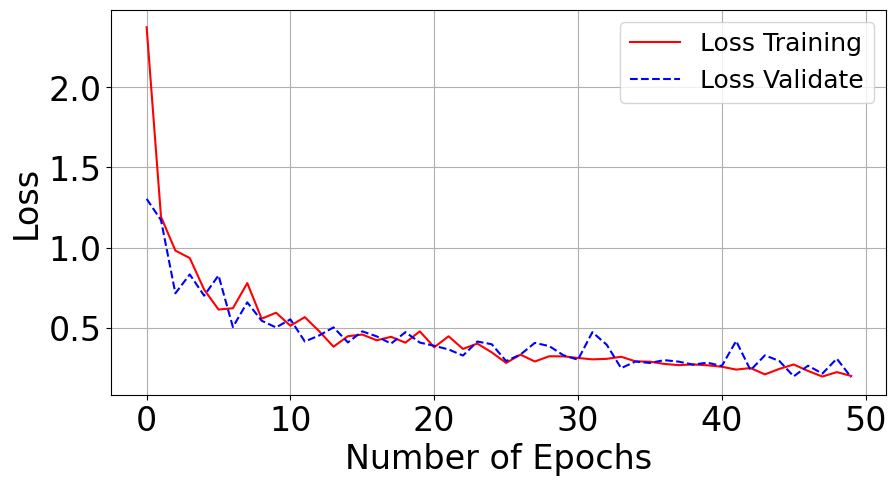

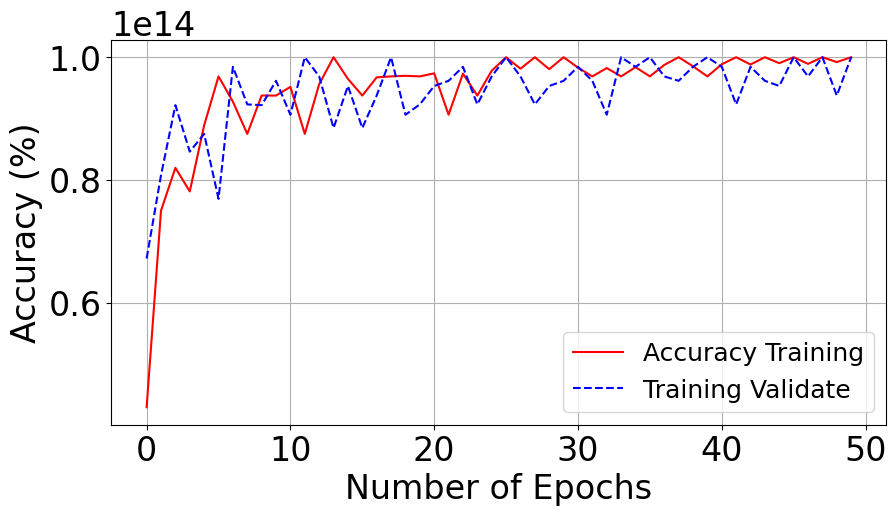

In [26]:
plotTraining(model_history,epochs,"loss")
plotTraining(model_history,epochs,"accuracy")
plotTraining(model_history,epochs,"val_loss")
plotTraining(model_history,epochs,"val_accuracy")

# Predicción usando el modelo entrenado

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 785ms/step
Clase predicha: EGRETTA THULA
Porcentaje de confianza: 66.31%


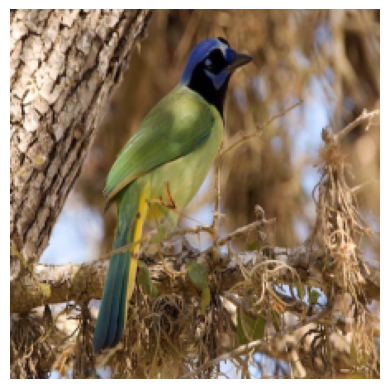

In [27]:
from keras.applications.imagenet_utils import preprocess_input, decode_predictions
from keras.models import load_model

names = ['CYANOCORAX YNCAS', 'PIRANGA RUBRA', 'PITANGUS SULPHURATUS', 'PYROCEPHALUS RUBINUS', 'RUPORNIS MAGNIROSTRIS', 'SICALIS FLAVEOLA', 'THRAUPIS EPISCOPUS', 'TIARIS OLIVACEUS', 'TYRANNUS MELANCHOLICUS', 'ZONOTRICHIA CAPENSIS', 'CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']

# Cargar el modelo
modelt = load_model(model_directory + file_name)
#modelt = custom_vgg_model

# Ruta de la imagen de prueba
imaget_path = "ImagenPrueba.jpg"

# Leer la imagen, cambiar tamaño y preprocesar
imaget=cv2.resize(cv2.imread(imaget_path), (width_shape, height_shape), interpolation = cv2.INTER_AREA)
xt = np.asarray(imaget)
xt=preprocess_input(xt)
xt = np.expand_dims(xt,axis=0)

# Obtener las predicciones del modelo
preds = modelt.predict(xt)

# Obtener la clase predicha y su porcentaje de confianza
predicted_class_index = np.argmax(preds)
predicted_class_name = names[predicted_class_index]
confidence_percentage = preds[0][predicted_class_index] * 100

# Imprimir el resultado
print(f'Clase predicha: {predicted_class_name}')
print(f'Porcentaje de confianza: {confidence_percentage:.2f}%')

# Mostrar la imagen
plt.imshow(cv2.cvtColor(np.asarray(imaget), cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Matriz de confusión y métricas de desempeño

In [36]:
from sklearn.metrics import confusion_matrix, f1_score, roc_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


names = ['CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']



test_data_dir = 'dataset/test'  

test_datagen = ImageDataGenerator()

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape), 
    batch_size = batch_size,
    class_mode='categorical', 
    shuffle=False)

custom_Model= load_model(model_directory + file_name)

predictions = custom_Model.predict(test_generator)


y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes


matc=confusion_matrix(y_real, y_pred)



print(metrics.classification_report(y_real,y_pred, digits = 4))

Found 85 images belonging to 18 classes.


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step
              precision    recall  f1-score   support

           0     1.0000    0.8000    0.8889         5
           1     0.6667    0.8000    0.7273         5
           2     0.8333    1.0000    0.9091         5
           3     1.0000    0.8000    0.8889         5
           4     0.5556    1.0000    0.7143         5
           5     0.8333    1.0000    0.9091         5
           6     0.5000    1.0000    0.6667         5
           7     0.5556    1.0000    0.7143         5
           8     0.8000    0.8000    0.8000         5
           9     0.3333    0.8000    0.4706         5
          10     1.0000    0.4000    0.5714         5
          11     1.0000    0.6000    0.7500         5
          12     0.0000    0.0000    0.0000         5
          13     0.0000    0.0000    0.0000         5
          14     1.0000    0.6000    0.7500         5
          15     1.0000    0.4000    0.5714         5
          16     0.0000    0.0000    0.0000  

C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\

C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\mlxtend\plotting\plot_confusion_matrix.py:102: RuntimeWarning: invalid value encountered in divide
  normed_conf_mat = conf_mat.astype("float") / total_samples


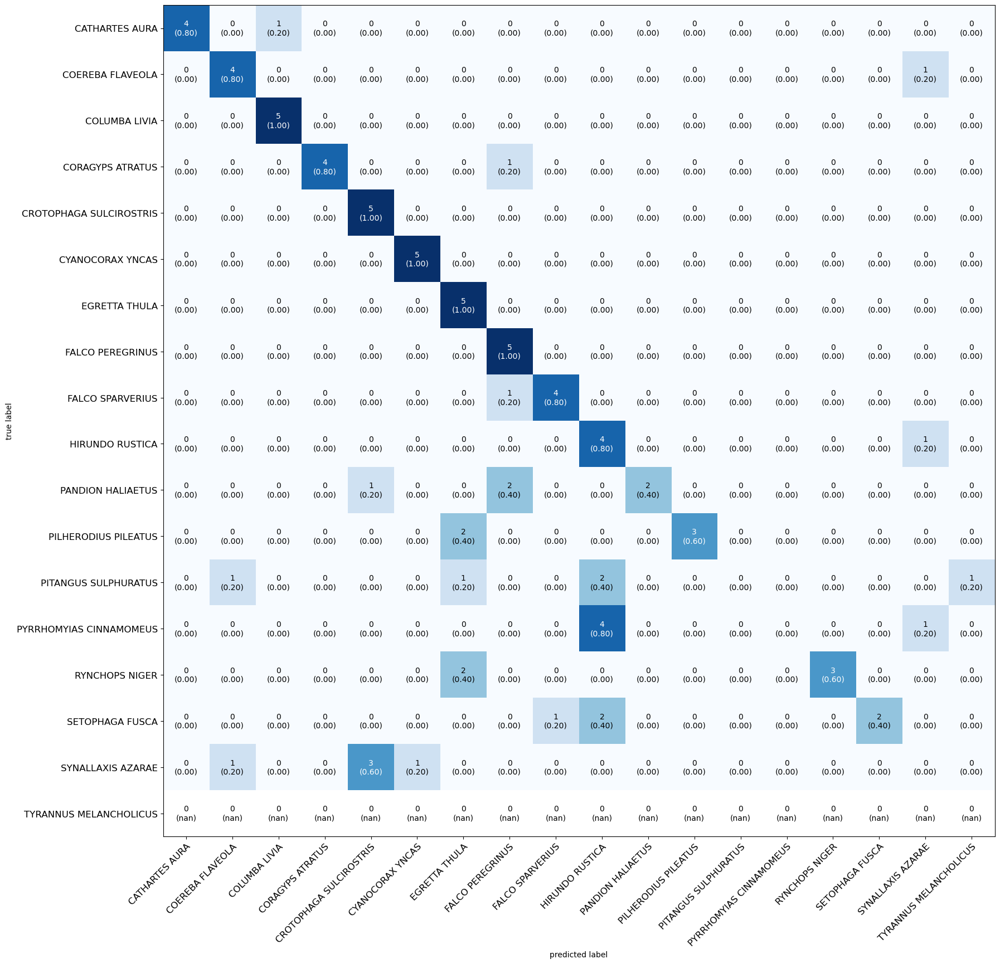

In [35]:
# Define el tamaño de la figura y los nombres de las clases
fig, ax = plot_confusion_matrix(conf_mat=matc, figsize=(18,18), class_names=names, show_normed=True)

# Ajusta el tamaño de las letras de los nombres de las clases
ax.set_xticklabels(names, fontsize=12)  # Ajusta el tamaño de las letras en el eje x
ax.set_yticklabels(names, fontsize=12)  # Ajusta el tamaño de las letras en el eje y

# Ajusta automáticamente el diseño de la figura
plt.tight_layout()

# Muestra la figura
plt.show()

# Prueba 2

# Generador de imágenes para las imagenes de train y valid

In [37]:
# Definir el generador de imágenes para el conjunto de entrenamiento con aumentos de datos
train_datagen = ImageDataGenerator(
    rotation_range=20,               
    zoom_range=0.2,                  
    width_shift_range=0.1,           
    height_shift_range=0.1,          
    horizontal_flip=True,            
    vertical_flip=False,             
    preprocessing_function=preprocess_input
)

# Definir el generador de imágenes para el conjunto de validación con los mismos aumentos de datos
valid_datagen = ImageDataGenerator(
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False,
    preprocessing_function=preprocess_input
)

# Definir el número de conjuntos de entrenamiento y validación
num_splits = 3

# Dividir los datos en múltiples conjuntos de entrenamiento y validación
for i in range(num_splits):
    # Crear un generador de lotes de imágenes para el conjunto de entrenamiento
    train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(width_shape, height_shape),
        batch_size=batch_size,
        class_mode='categorical'
    )

    # Crear un generador de lotes de imágenes para el conjunto de validación
    validation_generator = valid_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(width_shape, height_shape),
        batch_size=batch_size,
        class_mode='categorical'
    )

Found 2805 images belonging to 18 classes.
Found 90 images belonging to 18 classes.
Found 2805 images belonging to 18 classes.
Found 90 images belonging to 18 classes.
Found 2805 images belonging to 18 classes.
Found 90 images belonging to 18 classes.


# Entrenamiento

In [38]:
from keras.callbacks import LearningRateScheduler
import math

# Definir el número de muestras de entrenamiento y validación
nb_train_samples = 2805
nb_validation_samples = 90

# Definir la entrada de la red neuronal con el tamaño de las imágenes
image_input = Input(shape=(width_shape, height_shape, 3))

# Cargar el modelo VGG16 preentrenado con pesos ajustados desde ImageNet
model = VGG16(input_tensor=image_input, include_top=True, weights='imagenet')

# Obtener la salida de la penúltima capa densa del modelo VGG16 (fc2)
last_layer = model.get_layer('fc2').output

# Añadir una nueva capa densa al final del modelo para la clasificación multiclase con regularización L2 (Evita sobreajuste)
out = Dense(num_classes, activation='softmax', kernel_regularizer='l2', name='output')(last_layer)

# Crear un nuevo modelo personalizado que toma la entrada de la imagen y produce la salida clasificada
custom_vgg_model = Model(image_input, out)

# Congelar todas las capas del modelo, excepto la capa densa añadida
for layer in custom_vgg_model.layers[:-1]:
    layer.trainable = False

# Compilar el modelo con una función de pérdida, optimizador y métricas especificadas
custom_vgg_model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

# Definir una función que reduzca la tasa de aprendizaje a la mitad cada 2 épocas
def lr_schedule(epoch):
    initial_lr = 0.0001
    drop = 0.5
    epochs_drop = 2
    lr = initial_lr * math.pow(drop, math.floor((1+epoch)/epochs_drop))
    print("Learning rate set to:", lr)
    return lr



# Crear un callback para ajustar dinámicamente la tasa de aprendizaje
lr_scheduler = LearningRateScheduler(lr_schedule)

# Mostrar un resumen del modelo que incluye la arquitectura y el número de parámetros
custom_vgg_model.summary()

# Entrenar el modelo utilizando generadores de datos para el conjunto de entrenamiento y validación
model_history = custom_vgg_model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    steps_per_epoch=nb_train_samples//batch_size,  # Número de pasos por época de entrenamiento
    validation_steps=nb_validation_samples//batch_size,  # Número de pasos por época de validación
    callbacks=[lr_scheduler])# Añadir el callback de la tasa de aprendizaje
   

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 18)             │        73,746 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 134,334,290 (512.44 MB)

 Trainable params: 73,746 (288.07 KB)

 Non-trainable params: 134,260,544 (512.16 MB)

Learning rate set to: 0.0001
Epoch 1/50


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


87/87 ━━━━━━━━━━━━━━━━━━━━ 320s 4s/step - accuracy: 0.2627 - loss: 2.9901 - val_accuracy: 0.8281 - val_loss: 0.9816 - learning_rate: 1.0000e-04
Learning rate set to: 5e-05
Epoch 2/50
 1/87 ━━━━━━━━━━━━━━━━━━━━ 5:18 4s/step - accuracy: 0.6875 - loss: 1.3955

C:\Users\Oscar Diaz\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - accuracy: 0.6875 - loss: 1.3955 - val_accuracy: 0.6154 - val_loss: 1.3046 - learning_rate: 5.0000e-05
Learning rate set to: 5e-05
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 314s 4s/step - accuracy: 0.7854 - loss: 1.0984 - val_accuracy: 0.8594 - val_loss: 0.8841 - learning_rate: 5.0000e-05
Learning rate set to: 2.5e-05
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.7188 - loss: 0.9660 - val_accuracy: 0.9231 - val_loss: 0.7396 - learning_rate: 2.5000e-05
Learning rate set to: 2.5e-05
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 306s 3s/step - accuracy: 0.8557 - loss: 0.8725 - val_accuracy: 0.8438 - val_loss: 0.8213 - learning_rate: 2.5000e-05
Learning rate set to: 1.25e-05
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.9062 - loss: 0.6931 - val_accuracy: 0.8846 - val_loss: 0.7597 - learning_rate: 1.2500e-05
Learning rate set to: 1.25e-05
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 297s 3s/step - accuracy: 0.8782 - loss: 0.8099 -

Este código realiza las siguientes operaciones en general:

1. **Definición de variables:** Se definen dos variables `nb_train_samples` y `nb_validation_samples` para indicar el número de muestras de entrenamiento y validación respectivamente. Estas variables se utilizan más adelante para configurar el entrenamiento del modelo.

2. **Definición de la entrada de la red neuronal:** Se define la entrada de la red neuronal utilizando la clase `Input` de Keras. La forma de la entrada se especifica como `(width_shape, height_shape, 3)`, lo que indica el tamaño de las imágenes de entrada y el número de canales de color (en este caso, 3 para imágenes RGB).

3. **Carga del modelo preentrenado VGG16:** Se carga el modelo preentrenado VGG16 utilizando la función `VGG16` de Keras. Se especifica el tensor de entrada de la red neuronal (`input_tensor=image_input`), se incluye la capa densa al final del modelo (`include_top=True`) y se cargan los pesos preentrenados en el conjunto de datos de ImageNet (`weights='imagenet'`).

4. **Creación de un nuevo modelo personalizado:** Se crea un nuevo modelo personalizado que incluye todas las capas de la VGG16 hasta la última capa densa (`fc2`). Se agrega una capa densa adicional al final del modelo con un número de unidades igual al número de clases en el problema (`num_classes`). Esta capa tiene una función de activación softmax, lo que la convierte en una clasificación de salida.

5. **Congelación de capas:** Se congela todas las capas del modelo preentrenado VGG16, excepto la última capa densa añadida. Esto se hace para que durante el entrenamiento solo se actualicen los pesos de la nueva capa densa.

6. **Compilación del modelo:** Se compila el modelo personalizado utilizando la función de pérdida `categorical_crossentropy`, el optimizador `adadelta` y se incluye la métrica de precisión (`accuracy`).

7. **Resumen del modelo:** Se muestra un resumen del modelo, que incluye todas las capas y el número total de parámetros entrenables y no entrenables.

8. **Entrenamiento del modelo:** Se entrena el modelo utilizando los generadores de datos `train_generator` y `validation_generator` que se definieron anteriormente. Se especifica el número de épocas (`epochs`) y el número de pasos por época (`steps_per_epoch`) y de validación (`validation_steps`). Durante el entrenamiento, se actualizan los pesos de la capa densa añadida mientras que los pesos de las capas de VGG16 se mantienen fijos debido a la congelación realizada anteriormente.

# Grabar modelo en disco

Guardar el modelo tiene varias ventajas. En primer lugar, permite la reutilización futura, ya que puedes cargarlo y utilizarlo nuevamente sin necesidad de volver a entrenarlo desde cero, lo que resulta útil tanto para hacer predicciones en nuevos datos como para continuar el entrenamiento en una fecha posterior. Además, facilita la distribución y compartición del modelo con otros investigadores, colegas o clientes que puedan necesitar utilizarlo en sus propios proyectos. Por último, al guardar el modelo junto con su configuración y pesos entrenados, se asegura la reproducibilidad de los resultados, ya que otros investigadores pueden cargar el modelo exacto y obtener los mismos resultados que tú, lo que es fundamental para la validación y la comparación de resultados en investigación científica y desarrollo de modelos.

Este código utilizará un bucle while para verificar si el archivo con el nombre base del modelo ya existe. Si existe, agregará un número al final del nombre del archivo y verificará nuevamente. Esto continuará hasta que se encuentre un nombre de archivo único que no exista en el directorio. Una vez que se encuentra un nombre único, el modelo se guarda con ese nombre.

In [39]:
import os

# Nombre base del modelo
model_name = "model_VGG16_v"

# Extensión del archivo
file_extension = ".keras"

# Directorio donde se guardarán los modelos
model_directory = "models/"

# Inicializar contador
counter = 1

# Generar el nombre completo del archivo
file_name = model_name + file_extension

ruta=model_directory + file_name
print(ruta)
# Verificar si el modelo ya está guardado
while os.path.exists(model_directory + file_name):
    
    # Si el archivo existe, agregar un número al final del nombre del modelo
    file_name = f"{model_name}{counter}{file_extension}"
    counter += 1

# Guardar el modelo con el nombre único en el directorio correcto
custom_vgg_model.save(model_directory + file_name)

models/model_VGG16_v.keras


# Gráficas de entrenamiento y validación (accuracy - loss)

In [40]:
def plotTraining(hist, epochs, typeData):
    
    if typeData=="loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'-r',label='Loss Training')
    if typeData=="accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'-r',label='Accuracy Training')
    if typeData=="val_loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['val_loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'--b',label='Loss Validate')
    if typeData=="val_accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['val_accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'--b',label='Training Validate')
        

    plt.rc('xtick',labelsize=24)
    plt.rc('ytick',labelsize=24)
    plt.rc('legend', fontsize=18) 
    plt.legend()
    plt.xlabel('Number of Epochs',fontsize=24)
    plt.grid(True)

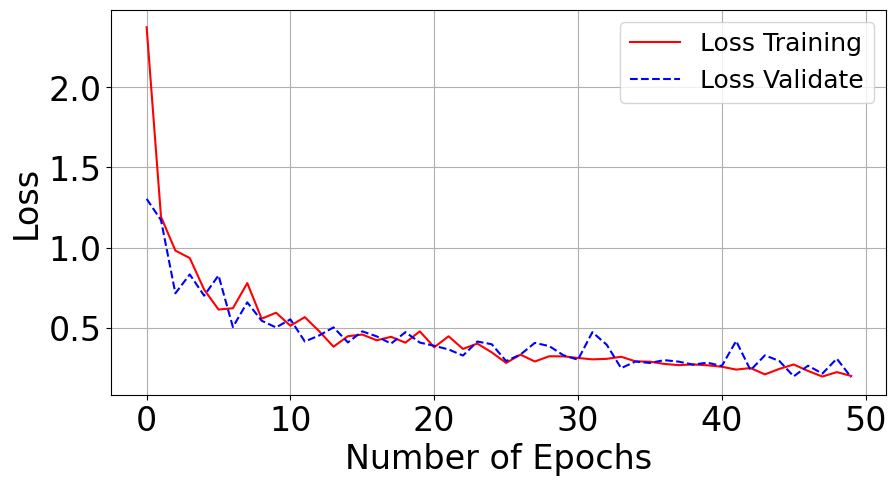

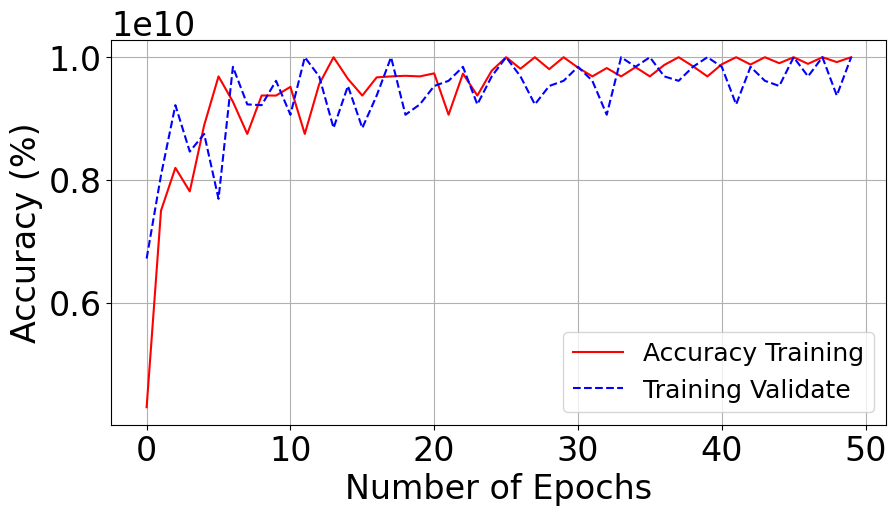

In [22]:
plotTraining(model_history,epochs,"loss")
plotTraining(model_history,epochs,"accuracy")
plotTraining(model_history,epochs,"val_loss")
plotTraining(model_history,epochs,"val_accuracy")

# Predicción usando el modelo entrenado

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
Clase predicha: CYANOCORAX YNCAS
Porcentaje de confianza: 89.46%


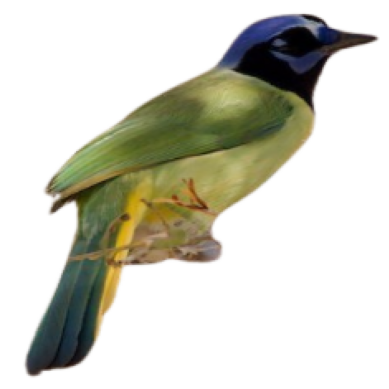

In [43]:
from keras.applications.imagenet_utils import preprocess_input, decode_predictions
from keras.models import load_model

names = ['CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']

# Cargar el modelo
modelt = load_model(model_directory + file_name)
#modelt = custom_vgg_model

# Ruta de la imagen de prueba
imaget_path = "ImagenPrueba_SF.png"

# Leer la imagen, cambiar tamaño y preprocesar
imaget=cv2.resize(cv2.imread(imaget_path), (width_shape, height_shape), interpolation = cv2.INTER_AREA)
xt = np.asarray(imaget)
xt=preprocess_input(xt)
xt = np.expand_dims(xt,axis=0)

# Obtener las predicciones del modelo
preds = modelt.predict(xt)

# Obtener la clase predicha y su porcentaje de confianza
predicted_class_index = np.argmax(preds)
predicted_class_name = names[predicted_class_index]
confidence_percentage = preds[0][predicted_class_index] * 100

# Imprimir el resultado
print(f'Clase predicha: {predicted_class_name}')
print(f'Porcentaje de confianza: {confidence_percentage:.2f}%')

# Mostrar la imagen
plt.imshow(cv2.cvtColor(np.asarray(imaget), cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Matriz de confusión y métricas de desempeño

Found 86 images belonging to 18 classes.
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\mlxtend\plotting\plot_confusion_matrix.py:102: RuntimeWarning: invalid value encountered in divide
  normed_conf_mat = conf_mat.astype("float") / total_samples
C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being

              precision    recall  f1-score   support

           0     1.0000    0.2000    0.3333         5
           1     0.5714    0.8000    0.6667         5
           2     0.8333    1.0000    0.9091         5
           3     1.0000    1.0000    1.0000         5
           4     0.6250    1.0000    0.7692         5
           5     0.7500    1.0000    0.8571         6
           6     0.4444    0.8000    0.5714         5
           7     0.4167    1.0000    0.5882         5
           8     1.0000    0.8000    0.8889         5
           9     0.1250    0.2000    0.1538         5
          10     0.5000    0.2000    0.2857         5
          11     0.2500    0.2000    0.2222         5
          12     0.0000    0.0000    0.0000         5
          13     1.0000    0.4000    0.5714         5
          14     1.0000    0.6000    0.7500         5
          15     1.0000    0.2000    0.3333         5
          16     0.0000    0.0000    0.0000         5
          17     0.0000    

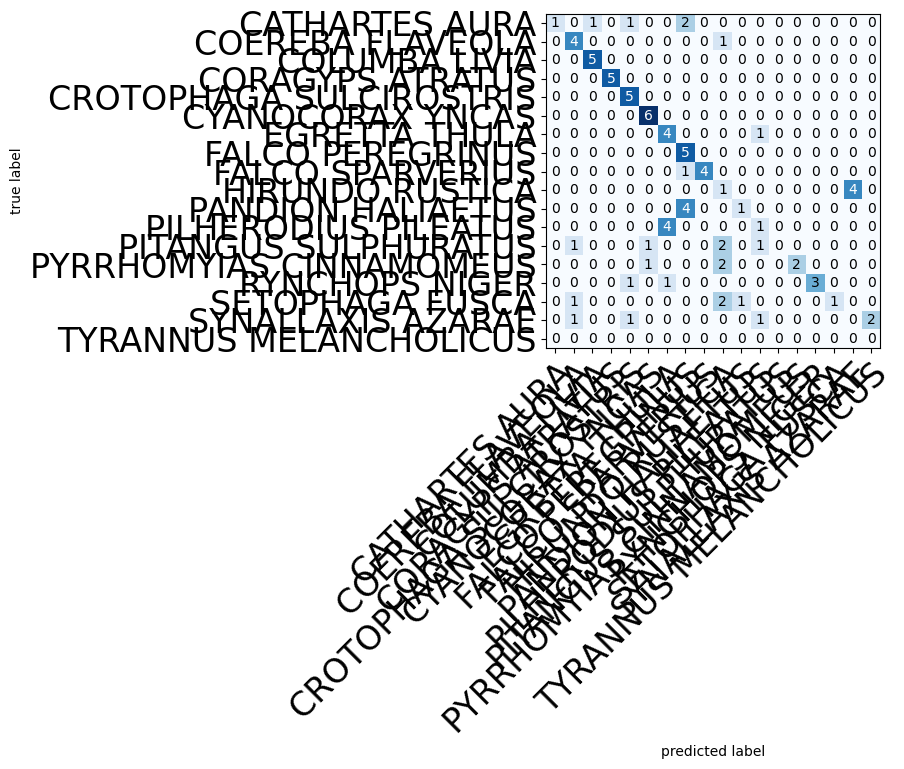

In [46]:
from sklearn.metrics import confusion_matrix, f1_score, roc_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


names = ['CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']



test_data_dir = 'dataset/test'  

test_datagen = ImageDataGenerator()

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape), 
    batch_size = batch_size,
    class_mode='categorical', 
    shuffle=False)

custom_Model= load_model(model_directory + file_name)

predictions = custom_Model.predict(test_generator)


y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes


matc=confusion_matrix(y_real, y_pred)

plot_confusion_matrix(conf_mat=matc, figsize=(9,9), class_names = names, show_normed=False)
plt.tight_layout()

print(metrics.classification_report(y_real,y_pred, digits = 4))

C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\mlxtend\plotting\plot_confusion_matrix.py:102: RuntimeWarning: invalid value encountered in divide
  normed_conf_mat = conf_mat.astype("float") / total_samples


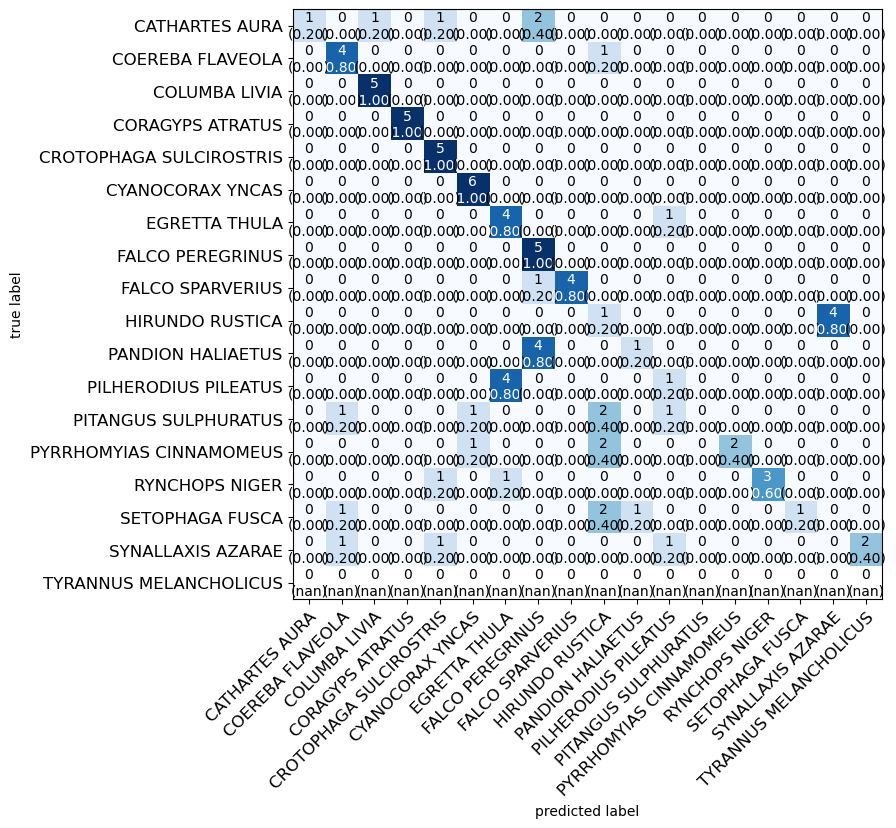

In [47]:
# Define el tamaño de la figura y los nombres de las clases
fig, ax = plot_confusion_matrix(conf_mat=matc, figsize=(9,9), class_names=names, show_normed=True)

# Ajusta el tamaño de las letras de los nombres de las clases
ax.set_xticklabels(names, fontsize=12)  # Ajusta el tamaño de las letras en el eje x
ax.set_yticklabels(names, fontsize=12)  # Ajusta el tamaño de las letras en el eje y

# Ajusta automáticamente el diseño de la figura
plt.tight_layout()

# Muestra la figura
plt.show()

# Prueba 3

# Regularización L2

# Entrenamiento

In [48]:
# Importar las funciones necesarias de Keras
from keras.layers import Input
from keras.applications import VGG16

# Definir la forma de entrada para las imágenes (ancho, alto, canales RGB)
image_input = Input(shape=(width_shape, height_shape, 3))

# Crear el modelo VGG16 utilizando la entrada de imagen definida
# include_top=True significa que se incluirán todas las capas densas en la parte superior del modelo
# weights='imagenet' significa que se utilizarán los pesos pre-entrenados en ImageNet
model2 = VGG16(input_tensor=image_input, include_top=True, weights='imagenet')

# Mostrar un resumen de la arquitectura del modelo
model2.summary()


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

In [49]:
last_layer = model2.get_layer('block5_pool').output
x= Flatten(name='flatten')(last_layer)
x = Dense(128, activation='relu', name='fc1')(x)
x = Dense(128, activation='relu', name='fc2')(x)
out = Dense(num_classes, activation='softmax', name='output')(x)
custom_model = Model(image_input, out)
custom_model.summary()

# freeze all the layers except the dense layers
for layer in custom_model.layers[:-3]:
	layer.trainable = False

custom_model.summary()

custom_model.compile(loss='categorical_crossentropy',optimizer='adadelta',metrics=['accuracy'])

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 18)             │         2,322 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,944,914 (68.45 MB)

 Trainable params: 17,944,914 (68.45 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 18)             │         2,322 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,944,914 (68.45 MB)

 Trainable params: 3,230,226 (12.32 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [50]:
# Definir el número de muestras de entrenamiento y validación
nb_train_samples = 2805
nb_validation_samples = 90

model_history = custom_model.fit(  
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    steps_per_epoch=nb_train_samples//batch_size,
    validation_steps=nb_validation_samples//batch_size)

Epoch 1/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 298s 3s/step - accuracy: 0.0663 - loss: 18.7191 - val_accuracy: 0.0312 - val_loss: 18.9593
Epoch 2/50
 1/87 ━━━━━━━━━━━━━━━━━━━━ 4:15 3s/step - accuracy: 0.0625 - loss: 17.2532

C:\Users\Oscar Diaz\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - accuracy: 0.0625 - loss: 17.2532 - val_accuracy: 0.1154 - val_loss: 12.6727
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 293s 3s/step - accuracy: 0.0679 - loss: 15.7419 - val_accuracy: 0.1562 - val_loss: 13.0466
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.1250 - loss: 16.9887 - val_accuracy: 0.0769 - val_loss: 14.3917
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 307s 4s/step - accuracy: 0.0892 - loss: 13.6572 - val_accuracy: 0.0938 - val_loss: 14.8485
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.0312 - loss: 12.3036 - val_accuracy: 0.1538 - val_loss: 9.1232
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 296s 3s/step - accuracy: 0.1002 - loss: 12.6286 - val_accuracy: 0.1406 - val_loss: 11.9384
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.0625 - loss: 12.5009 - val_accuracy: 0.1538 - val_loss: 10.8247
Epoch 9/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 301s 3s/step - accuracy: 0.1010 - loss: 11.3096 - val_accuracy: 0.0938 

# Grabar modelo en disco

In [51]:
import os

# Nombre base del modelo
model_name = "model_VGG16_v"

# Extensión del archivo
file_extension = ".keras"

# Directorio donde se guardarán los modelos
model_directory = "models/"

# Inicializar contador
counter = 1

# Generar el nombre completo del archivo
file_name = model_name + file_extension

ruta=model_directory + file_name
print(ruta)
# Verificar si el modelo ya está guardado
while os.path.exists(model_directory + file_name):
    
    # Si el archivo existe, agregar un número al final del nombre del modelo
    file_name = f"{model_name}{counter}{file_extension}"
    counter += 1

# Guardar el modelo con el nombre único en el directorio correcto
custom_vgg_model.save(model_directory + file_name)

models/model_VGG16_v.keras


# Gráficas de entrenamiento y validación (accuracy - loss)

In [52]:
def plotTraining(hist, epochs, typeData):
    
    if typeData=="loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'-r',label='Loss Training')
    if typeData=="accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'-r',label='Accuracy Training')
    if typeData=="val_loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['val_loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'--b',label='Loss Validate')
    if typeData=="val_accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['val_accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'--b',label='Training Validate')
        

    plt.rc('xtick',labelsize=24)
    plt.rc('ytick',labelsize=24)
    plt.rc('legend', fontsize=18) 
    plt.legend()
    plt.xlabel('Number of Epochs',fontsize=24)
    plt.grid(True)

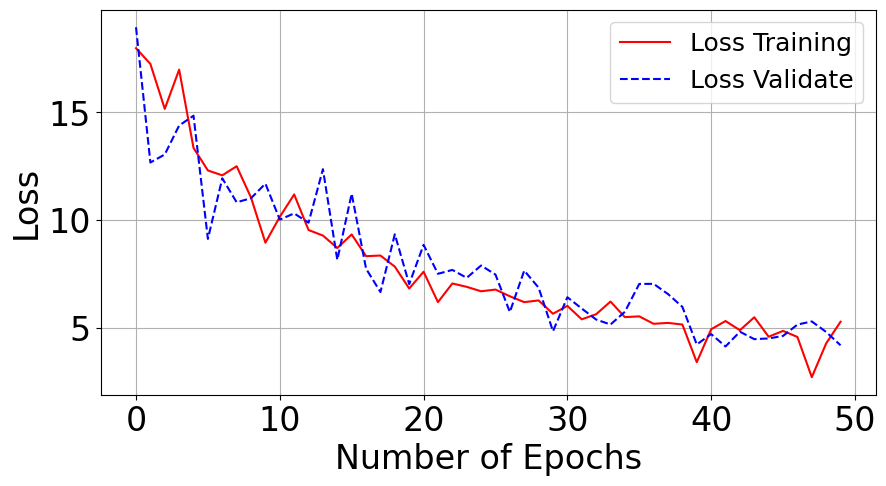

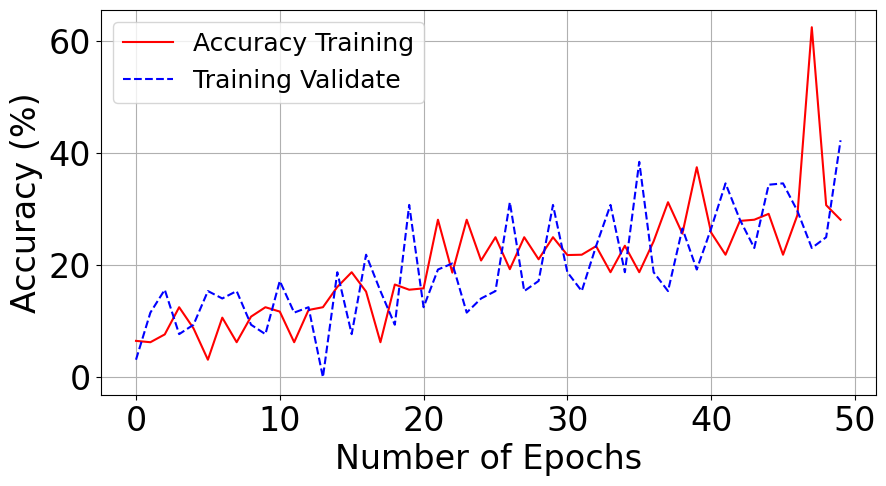

In [53]:
plotTraining(model_history,epochs,"loss")
plotTraining(model_history,epochs,"accuracy")
plotTraining(model_history,epochs,"val_loss")
plotTraining(model_history,epochs,"val_accuracy")

# Predicción usando el modelo entrenado

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step
Clase predicha: SICALIS FLAVEOLA
Porcentaje de confianza: 89.46%


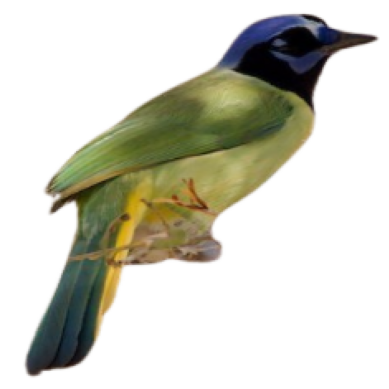

In [56]:
from keras.applications.imagenet_utils import preprocess_input, decode_predictions
from keras.models import load_model

names = ['CYANOCORAX YNCAS', 'PIRANGA RUBRA', 'PITANGUS SULPHURATUS', 'PYROCEPHALUS RUBINUS', 'RUPORNIS MAGNIROSTRIS', 'SICALIS FLAVEOLA', 'THRAUPIS EPISCOPUS', 'TIARIS OLIVACEUS', 'TYRANNUS MELANCHOLICUS', 'ZONOTRICHIA CAPENSIS', 'CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']

# Cargar el modelo
modelt = load_model(model_directory + file_name)
#modelt = custom_vgg_model

# Ruta de la imagen de prueba
imaget_path = "ImagenPrueba_SF.png"

# Leer la imagen, cambiar tamaño y preprocesar
imaget=cv2.resize(cv2.imread(imaget_path), (width_shape, height_shape), interpolation = cv2.INTER_AREA)
xt = np.asarray(imaget)
xt=preprocess_input(xt)
xt = np.expand_dims(xt,axis=0)

# Obtener las predicciones del modelo
preds = modelt.predict(xt)

# Obtener la clase predicha y su porcentaje de confianza
predicted_class_index = np.argmax(preds)
predicted_class_name = names[predicted_class_index]
confidence_percentage = preds[0][predicted_class_index] * 100

# Imprimir el resultado
print(f'Clase predicha: {predicted_class_name}')
print(f'Porcentaje de confianza: {confidence_percentage:.2f}%')

# Mostrar la imagen
plt.imshow(cv2.cvtColor(np.asarray(imaget), cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Matriz de confusión y métricas de desempeño

La validación oscila tanto porque podría haber un problema de sobreajuste (overfitting) o la necesidad de ajustar los hiperparámetros. El modelo parece estar aprendiendo bien durante el entrenamiento, como se muestra en la línea roja continua “Accuracy Training”, pero tiene un rendimiento inconsistente en los datos de validación, indicado por la línea azul punteada “Training Validate”.

Para abordar esto:

Regularización: Introduce técnicas de regularización como dropout o weight decay para reducir el sobreajuste.
Ajuste de Hiperparámetros: Experimenta con diferentes valores para hiperparámetros como tasa de aprendizaje, número de capas ocultas, etc.
Más Datos: Si es posible, aumenta el tamaño del conjunto de datos de entrenamiento.
Early Stopping: Detén el entrenamiento cuando la precisión de validación deja de mejorar.
El gráfico muestra que el modelo necesita más ajustes para generalizar mejor a datos no vistos

Found 89 images belonging to 18 classes.


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 13s 4s/step


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\mlxtend\plotting\plot_confusion_matrix.py:102: RuntimeWarning: invalid value encountered in divide
  normed_conf_mat = conf_mat.astype("float") / total_samples
C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being

              precision    recall  f1-score   support

           0     1.0000    0.2000    0.3333         5
           1     0.5714    0.8000    0.6667         5
           2     0.8333    1.0000    0.9091         5
           3     1.0000    1.0000    1.0000         5
           4     0.6250    1.0000    0.7692         5
           5     0.7500    1.0000    0.8571         6
           6     0.5833    0.8750    0.7000         8
           7     0.4167    1.0000    0.5882         5
           8     1.0000    0.8000    0.8889         5
           9     0.1250    0.2000    0.1538         5
          10     0.5000    0.2000    0.2857         5
          11     0.2500    0.2000    0.2222         5
          12     0.0000    0.0000    0.0000         5
          13     1.0000    0.4000    0.5714         5
          14     1.0000    0.6000    0.7500         5
          15     1.0000    0.2000    0.3333         5
          16     0.0000    0.0000    0.0000         5
          17     0.0000    

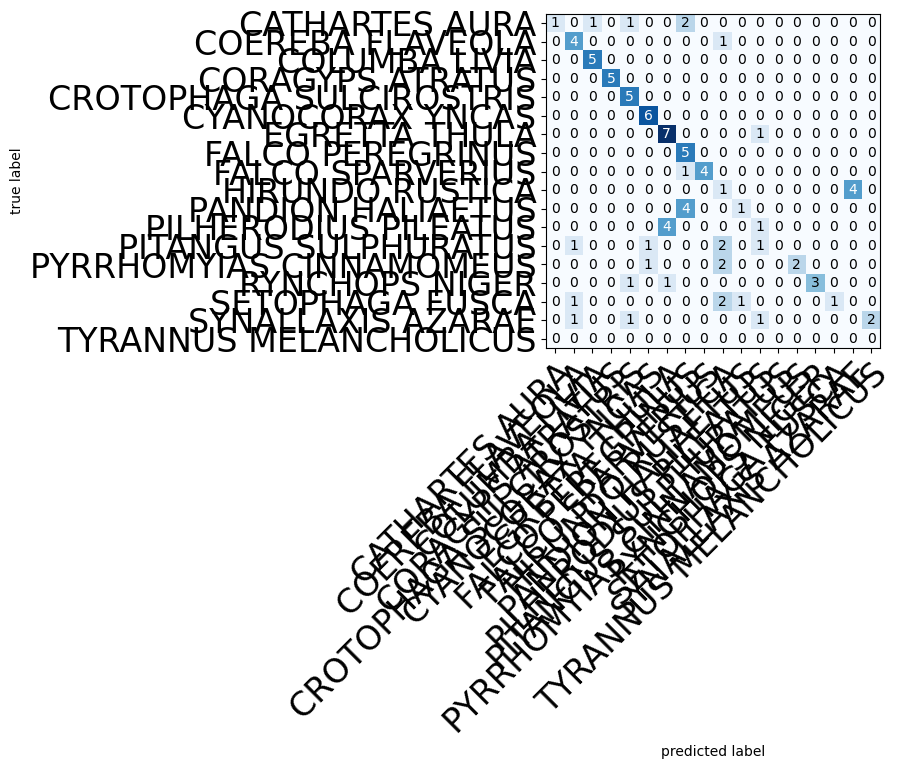

In [60]:
from sklearn.metrics import confusion_matrix, f1_score, roc_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


names = [ 'CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']



test_data_dir = 'dataset/test'  

test_datagen = ImageDataGenerator()

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape), 
    batch_size = batch_size,
    class_mode='categorical', 
    shuffle=False)

custom_Model50= load_model(model_directory + file_name)

predictions = custom_Model50.predict(test_generator)


y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes


matc=confusion_matrix(y_real, y_pred)

plot_confusion_matrix(conf_mat=matc, figsize=(9,9), class_names = names, show_normed=False)
plt.tight_layout()

print(metrics.classification_report(y_real,y_pred, digits = 4))

# Prueba 4

In [61]:
width_shape = 224
height_shape = 224
num_classes = 5
epochs = 50
batch_size = 32

In [62]:
train_data_dir = 'dataset/train'  
validation_data_dir = 'dataset/valid'

In [63]:
# Definir el generador de imágenes para el conjunto de entrenamiento con aumentos de datos
train_datagen = ImageDataGenerator(  
    rotation_range=20,               # Rango de grados para rotación aleatoria
    zoom_range=0.2,                  # Rango de zoom aleatorio
    width_shift_range=0.1,           # Rango de desplazamiento horizontal aleatorio
    height_shift_range=0.1,          # Rango de desplazamiento vertical aleatorio
    horizontal_flip=True,            # Volteo horizontal aleatorio
    vertical_flip=False,             # No se aplica volteo vertical
    preprocessing_function=preprocess_input)  # Función de preprocesamiento

# Definir el generador de imágenes para el conjunto de validación con los mismos aumentos de datos
valid_datagen = ImageDataGenerator(    
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False,
    preprocessing_function=preprocess_input)

# Crear un generador de lotes de imágenes para el conjunto de entrenamiento
train_generator = train_datagen.flow_from_directory(  
    train_data_dir,                  # Directorio que contiene las imágenes de entrenamiento
    target_size=(width_shape, height_shape),  # Tamaño al que se redimensionarán las imágenes
    batch_size=batch_size,           # Tamaño del lote
    class_mode='categorical')        # Modo de clasificación para imágenes categóricas

# Crear un generador de lotes de imágenes para el conjunto de validación
validation_generator = valid_datagen.flow_from_directory(  
    validation_data_dir,             # Directorio que contiene las imágenes de validación
    target_size=(width_shape, height_shape),  # Tamaño al que se redimensionarán las imágenes
    batch_size=batch_size,           # Tamaño del lote
    class_mode='categorical')        # Modo de clasificación para imágenes categóricas

Found 834 images belonging to 5 classes.
Found 25 images belonging to 5 classes.


In [64]:
# Definir el número de muestras de entrenamiento y validación
nb_train_samples = 834
nb_validation_samples = 25

# Definir la entrada de la red neuronal con el tamaño de las imágenes
image_input = Input(shape=(width_shape, height_shape, 3))

# Cargar el modelo VGG16 preentrenado con pesos ajustados desde ImageNet
model = VGG16(input_tensor=image_input, include_top=True, weights='imagenet')

# Obtener la salida de la penúltima capa densa del modelo VGG16 (fc2)
last_layer = model.get_layer('fc2').output

# Añadir una nueva capa densa al final del modelo para la clasificación multiclase con regularización L2 (Evita sobreajuste)
out = Dense(num_classes, activation='softmax', kernel_regularizer='l2', name='output')(last_layer)

# Crear un nuevo modelo personalizado que toma la entrada de la imagen y produce la salida clasificada
custom_vgg_model = Model(image_input, out)

# Congelar todas las capas del modelo, excepto la capa densa añadida
for layer in custom_vgg_model.layers[:-1]:
    layer.trainable = False

# Compilar el modelo con una función de pérdida, optimizador y métricas especificadas
custom_vgg_model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])


# Mostrar un resumen del modelo que incluye la arquitectura y el número de parámetros
custom_vgg_model.summary()

# Entrenar el modelo utilizando generadores de datos para el conjunto de entrenamiento y validación
model_history = custom_vgg_model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    steps_per_epoch=nb_train_samples//batch_size,  # Número de pasos por época de entrenamiento
    validation_steps=nb_validation_samples//batch_size)  # Número de pasos por época de validación


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 5)              │        20,485 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 134,281,029 (512.24 MB)

 Trainable params: 20,485 (80.02 KB)

 Non-trainable params: 134,260,544 (512.16 MB)

Epoch 1/50


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


26/26 ━━━━━━━━━━━━━━━━━━━━ 91s 3s/step - accuracy: 0.2838 - loss: 2.2863 - val_accuracy: 0.6000 - val_loss: 1.0493
Epoch 2/50
 1/26 ━━━━━━━━━━━━━━━━━━━━ 1:17 3s/step - accuracy: 0.6562 - loss: 1.1432

C:\Users\Oscar Diaz\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.6562 - loss: 1.1432 - val_accuracy: 0.6000 - val_loss: 1.0793
Epoch 3/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 89s 3s/step - accuracy: 0.7356 - loss: 0.8568 - val_accuracy: 0.8400 - val_loss: 0.5498
Epoch 4/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.7812 - loss: 0.5293 - val_accuracy: 0.7600 - val_loss: 0.7074
Epoch 5/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 87s 3s/step - accuracy: 0.8678 - loss: 0.5005 - val_accuracy: 0.8800 - val_loss: 0.4185
Epoch 6/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - accuracy: 0.9375 - loss: 0.2667 - val_accuracy: 0.8000 - val_loss: 0.5027
Epoch 7/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.9241 - loss: 0.3500 - val_accuracy: 0.9200 - val_loss: 0.3046
Epoch 8/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - accuracy: 0.9375 - loss: 0.3103 - val_accuracy: 0.8400 - val_loss: 0.4757
Epoch 9/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 94s 4s/step - accuracy: 0.9409 - loss: 0.3014 - val_accuracy: 0.8800 - val_loss: 0.

In [69]:
import os

# Nombre base del modelo
model_name = "model_VGG16_v"

# Extensión del archivo
file_extension = ".keras"

# Directorio donde se guardarán los modelos
model_directory = "models/"

# Inicializar contador
counter = 1

# Generar el nombre completo del archivo
file_name = model_name + file_extension

ruta=model_directory + file_name
print(ruta)
# Verificar si el modelo ya está guardado
while os.path.exists(model_directory + file_name):
    
    # Si el archivo existe, agregar un número al final del nombre del modelo
    file_name = f"{model_name}{counter}{file_extension}"
    counter += 1

# Guardar el modelo con el nombre único en el directorio correcto
custom_vgg_model.save(model_directory + file_name)

models/model_VGG16_v.keras


In [70]:
def plotTraining(hist, epochs, typeData):

    # Seleccionar la figura y establecer el tamaño
    # Dependiendo del tipo de datos (loss o accuracy), se elige la figura correspondiente
    
    if typeData=="loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'-r',label='Loss Training')
    if typeData=="accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'-r',label='Accuracy Training')
    if typeData=="val_loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['val_loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'--b',label='Loss Validate')
    if typeData=="val_accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['val_accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'--b',label='Training Validate')
        

    plt.rc('xtick',labelsize=24)
    plt.rc('ytick',labelsize=24)
    plt.rc('legend', fontsize=18) 
    plt.legend()
    plt.xlabel('Number of Epochs',fontsize=24)
    plt.grid(True)


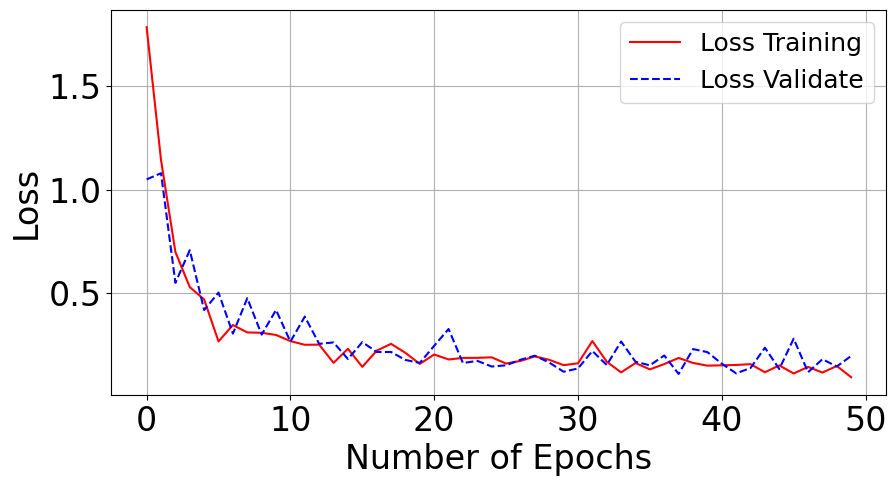

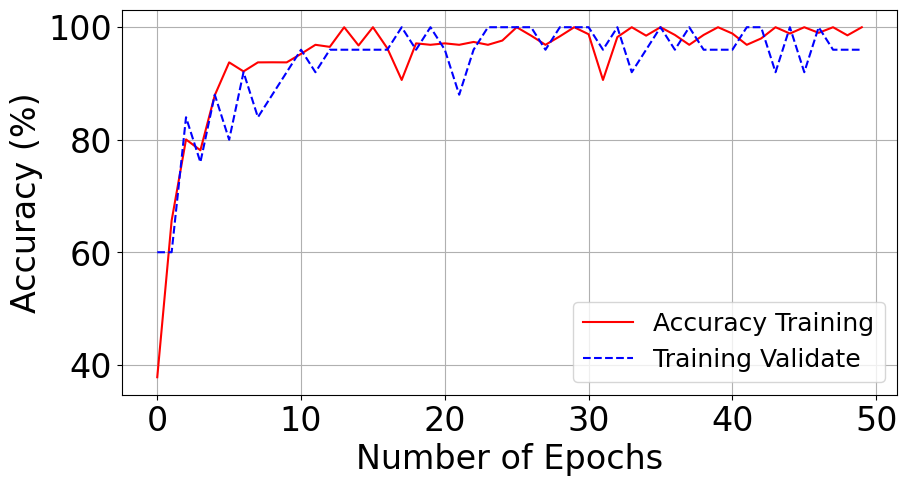

In [67]:
plotTraining(model_history,epochs,"loss")
plotTraining(model_history,epochs,"accuracy")
plotTraining(model_history,epochs,"val_loss")
plotTraining(model_history,epochs,"val_accuracy")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step
Clase predicha: CYANOCORAX YNCAS
Porcentaje de confianza: 52.63%


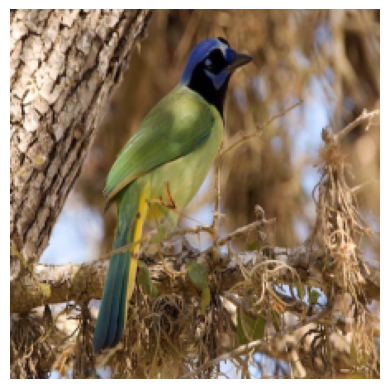

In [74]:
from keras.applications.imagenet_utils import preprocess_input, decode_predictions
from keras.models import load_model

names = ['CATHARTES AURA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS']

# Cargar el modelo
modelt = load_model(model_directory + file_name)
#modelt = custom_vgg_model

# Ruta de la imagen de prueba
imaget_path = "ImagenPrueba2.jpg"

# Leer la imagen, cambiar tamaño y preprocesar
imaget=cv2.resize(cv2.imread(imaget_path), (width_shape, height_shape), interpolation = cv2.INTER_AREA)
xt = np.asarray(imaget)
xt=preprocess_input(xt)
xt = np.expand_dims(xt,axis=0)

# Obtener las predicciones del modelo
preds = modelt.predict(xt)

# Obtener la clase predicha y su porcentaje de confianza
predicted_class_index = np.argmax(preds)
predicted_class_name = names[predicted_class_index]
confidence_percentage = preds[0][predicted_class_index] * 100

# Imprimir el resultado
print(f'Clase predicha: {predicted_class_name}')
print(f'Porcentaje de confianza: {confidence_percentage:.2f}%')

# Mostrar la imagen
plt.imshow(cv2.cvtColor(np.asarray(imaget), cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [72]:
from sklearn.metrics import confusion_matrix, f1_score, roc_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


names = ['CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']



test_data_dir = 'dataset/test'  

test_datagen = ImageDataGenerator()

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape), 
    batch_size = batch_size,
    class_mode='categorical', 
    shuffle=False)

custom_Model= load_model(model_directory + file_name)

predictions = custom_Model.predict(test_generator)


y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes


matc=confusion_matrix(y_real, y_pred)



print(metrics.classification_report(y_real,y_pred, digits = 4))

Found 27 images belonging to 5 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
              precision    recall  f1-score   support

           0     1.0000    0.2000    0.3333         5
           1     0.8333    1.0000    0.9091         5
           2     0.7143    1.0000    0.8333         5
           3     0.8333    1.0000    0.9091         5
           4     1.0000    1.0000    1.0000         7

    accuracy                         0.8519        27
   macro avg     0.8762    0.8400    0.7970        27
weighted avg     0.8854    0.8519    0.8120        27



# prueba 5

In [8]:
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization, Input
from keras.optimizers import Adam
from keras.callbacks import TensorBoard, ModelCheckpoint
from keras.utils import to_categorical
import os
import numpy as np
from keras.preprocessing import image
from keras.applications.imagenet_utils import preprocess_input, decode_predictions
from keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.models import load_model
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
width_shape = 224
height_shape = 224
num_classes = 18
epochs = 50
batch_size = 32

In [4]:
train_data_dir = 'datasetpreprocesado/train'  
validation_data_dir = 'datasetpreprocesado/valid'

In [5]:
# Definir el generador de imágenes para el conjunto de entrenamiento con aumentos de datos
train_datagen = ImageDataGenerator(  
    rotation_range=20,               # Rango de grados para rotación aleatoria
    zoom_range=0.2,                  # Rango de zoom aleatorio
    width_shift_range=0.1,           # Rango de desplazamiento horizontal aleatorio
    height_shift_range=0.1,          # Rango de desplazamiento vertical aleatorio
    horizontal_flip=True,            # Volteo horizontal aleatorio
    vertical_flip=False,             # No se aplica volteo vertical
    preprocessing_function=preprocess_input)  # Función de preprocesamiento

# Definir el generador de imágenes para el conjunto de validación con los mismos aumentos de datos
valid_datagen = ImageDataGenerator(    
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False,
    preprocessing_function=preprocess_input)

# Crear un generador de lotes de imágenes para el conjunto de entrenamiento
train_generator = train_datagen.flow_from_directory(  
    train_data_dir,                  # Directorio que contiene las imágenes de entrenamiento
    target_size=(width_shape, height_shape),  # Tamaño al que se redimensionarán las imágenes
    batch_size=batch_size,           # Tamaño del lote
    class_mode='categorical')        # Modo de clasificación para imágenes categóricas

# Crear un generador de lotes de imágenes para el conjunto de validación
validation_generator = valid_datagen.flow_from_directory(  
    validation_data_dir,             # Directorio que contiene las imágenes de validación
    target_size=(width_shape, height_shape),  # Tamaño al que se redimensionarán las imágenes
    batch_size=batch_size,           # Tamaño del lote
    class_mode='categorical')        # Modo de clasificación para imágenes categóricas

Found 2621 images belonging to 18 classes.
Found 738 images belonging to 18 classes.


In [ ]:
# Definir el número de muestras de entrenamiento y validación
nb_train_samples = 2621
nb_validation_samples =  738

# Definir la entrada de la red neuronal con el tamaño de las imágenes
image_input = Input(shape=(width_shape, height_shape, 3))

# Cargar el modelo VGG16 preentrenado con pesos ajustados desde ImageNet
model = VGG16(input_tensor=image_input, include_top=True, weights='imagenet')

# Obtener la salida de la penúltima capa densa del modelo VGG16 (fc2)
last_layer = model.get_layer('fc2').output

# Añadir una nueva capa densa al final del modelo para la clasificación multiclase con regularización L2 (Evita sobreajuste)
out = Dense(num_classes, activation='softmax', kernel_regularizer='l2', name='output')(last_layer)

# Crear un nuevo modelo personalizado que toma la entrada de la imagen y produce la salida clasificada
custom_vgg_model = Model(image_input, out)

# Congelar todas las capas del modelo, excepto la capa densa añadida
for layer in custom_vgg_model.layers[:-1]:
    layer.trainable = False

# Compilar el modelo con una función de pérdida, optimizador y métricas especificadas
custom_vgg_model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])


# Mostrar un resumen del modelo que incluye la arquitectura y el número de parámetros
custom_vgg_model.summary()

# Entrenar el modelo utilizando generadores de datos para el conjunto de entrenamiento y validación
model_history = custom_vgg_model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    steps_per_epoch=nb_train_samples//batch_size,  # Número de pasos por época de entrenamiento
    validation_steps=nb_validation_samples//batch_size)  # Número de pasos por época de validación


In [13]:
import os

# Nombre base del modelo
model_name = "model_VGG16_v"

# Extensión del archivo
file_extension = ".keras"

# Directorio donde se guardarán los modelos
model_directory = "models/"

# Inicializar contador
counter = 1

# Generar el nombre completo del archivo
file_name = model_name + file_extension

ruta=model_directory + file_name
print(ruta)
# Verificar si el modelo ya está guardado
while os.path.exists(model_directory + file_name):
    
    # Si el archivo existe, agregar un número al final del nombre del modelo
    file_name = f"{model_name}{counter}{file_extension}"
    counter += 1

# Guardar el modelo con el nombre único en el directorio correcto
custom_vgg_model.save(model_directory + file_name)

models/model_VGG16_v.keras


In [14]:
def plotTraining(hist, epochs, typeData):

    # Seleccionar la figura y establecer el tamaño
    # Dependiendo del tipo de datos (loss o accuracy), se elige la figura correspondiente
    
    if typeData=="loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'-r',label='Loss Training')
    if typeData=="accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'-r',label='Accuracy Training')
    if typeData=="val_loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['val_loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'--b',label='Loss Validate')
    if typeData=="val_accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['val_accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'--b',label='Training Validate')
        

    plt.rc('xtick',labelsize=24)
    plt.rc('ytick',labelsize=24)
    plt.rc('legend', fontsize=18) 
    plt.legend()
    plt.xlabel('Number of Epochs',fontsize=24)
    plt.grid(True)

In [15]:
def plotTraining(hist, epochs, typeData):

    # Seleccionar la figura y establecer el tamaño
    # Dependiendo del tipo de datos (loss o accuracy), se elige la figura correspondiente
    
    if typeData=="loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'-r',label='Loss Training')
    if typeData=="accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'-r',label='Accuracy Training')
    if typeData=="val_loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['val_loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'--b',label='Loss Validate')
    if typeData=="val_accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['val_accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'--b',label='Training Validate')
        

    plt.rc('xtick',labelsize=24)
    plt.rc('ytick',labelsize=24)
    plt.rc('legend', fontsize=18) 
    plt.legend()
    plt.xlabel('Number of Epochs',fontsize=24)
    plt.grid(True)

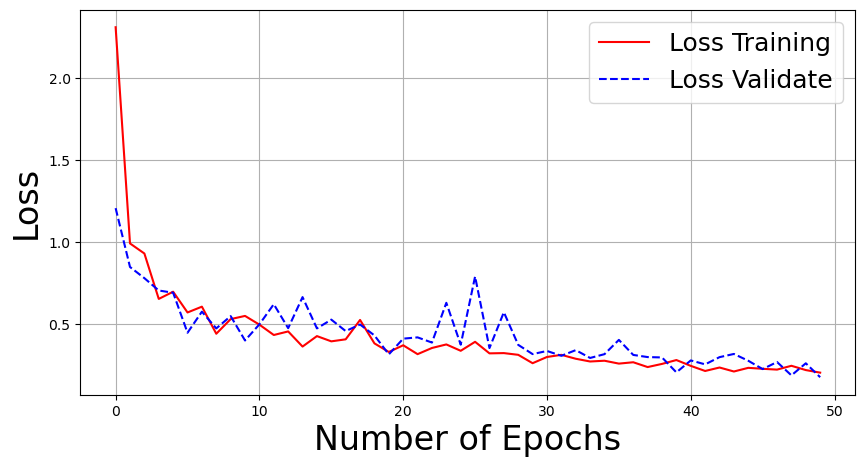

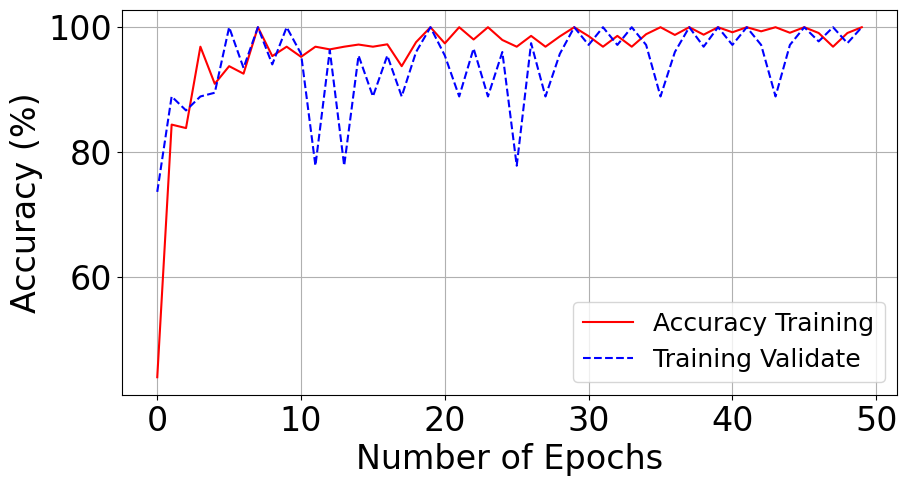

In [17]:
plotTraining(model_history,epochs,"loss")
plotTraining(model_history,epochs,"accuracy")
plotTraining(model_history,epochs,"val_loss")
plotTraining(model_history,epochs,"val_accuracy")

In [22]:
from sklearn.metrics import confusion_matrix, f1_score, roc_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


names = ['CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']



test_data_dir = 'datasetpreprocesado/test'  

test_datagen = ImageDataGenerator()

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape), 
    batch_size = batch_size,
    class_mode='categorical', 
    shuffle=False)

custom_Model= load_model('models/model_VGG16_v5.keras')

predictions = custom_Model.predict(test_generator)


y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes


matc=confusion_matrix(y_real, y_pred)



print(metrics.classification_report(y_real,y_pred, digits = 4))





Found 738 images belonging to 18 classes.


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


24/24 ━━━━━━━━━━━━━━━━━━━━ 76s 3s/step
              precision    recall  f1-score   support

           0     1.0000    0.2927    0.4528        41
           1     0.8095    0.4146    0.5484        41
           2     0.6949    1.0000    0.8200        41
           3     0.7400    0.9024    0.8132        41
           4     0.4933    0.9024    0.6379        41
           5     0.5600    0.6829    0.6154        41
           6     0.6308    1.0000    0.7736        41
           7     0.6271    0.9024    0.7400        41
           8     0.9118    0.7561    0.8267        41
           9     0.2871    0.7073    0.4085        41
          10     0.7750    0.7561    0.7654        41
          11     0.6500    0.6341    0.6420        41
          12     1.0000    0.2683    0.4231        41
          13     0.8000    0.0976    0.1739        41
          14     0.8529    0.7073    0.7733        41
          15     1.0000    0.1951    0.3265        41
          16     0.4091    0.4390    0.423

Found 361 images belonging to 18 classes.


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/6 ━━━━━━━━━━━━━━━━━━━━ 6s 7s/step WARNING:tensorflow:5 out of the last 13 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x00000153108E7100> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
6/6 ━━━━━━━━━━━━━━━━━━━━ 40s 6s/step
              precision    recall  f1-score   support

           0     1.0000    0.2000    0.3333        20
           1     0.9167    0.5500    0.6875        20
           2     0.7037    0.9500    

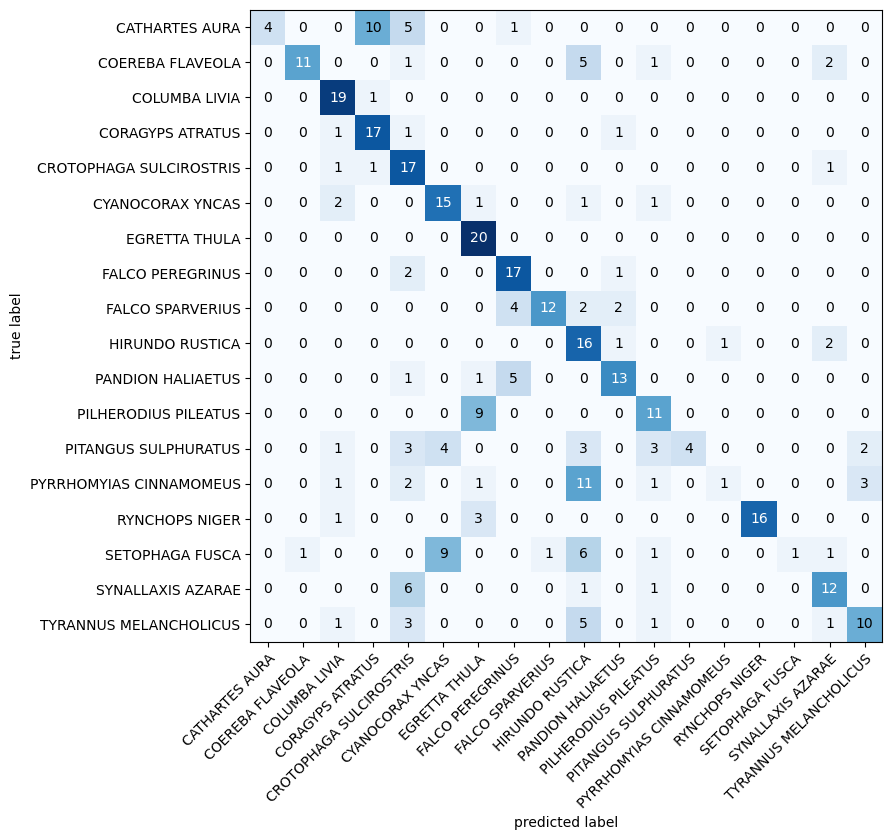

In [9]:
from sklearn.metrics import confusion_matrix, f1_score, roc_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


names = [ 'CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']



test_data_dir = 'datasetpreprocesado/test'  

test_datagen = ImageDataGenerator()

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape), 
    batch_size = batch_size,
    class_mode='categorical', 
    shuffle=False)

custom_Model50= load_model('models/model_VGG16_v5.keras')

predictions = custom_Model50.predict(test_generator)


y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes


matc=confusion_matrix(y_real, y_pred)

plot_confusion_matrix(conf_mat=matc, figsize=(9,9), class_names = names, show_normed=False)
plt.tight_layout()

print(metrics.classification_report(y_real,y_pred, digits = 4))

# prueba 6

In [1]:
width_shape = 224
height_shape = 224
num_classes = 18
epochs = 50
batch_size = 32

In [2]:
train_data_dir = 'datasetpreprocesado/train'  
validation_data_dir = 'datasetpreprocesado/valid'

In [14]:
# Definir el generador de imágenes para el conjunto de entrenamiento con aumentos de datos
train_datagen = ImageDataGenerator(  
    rotation_range=20,               # Rango de grados para rotación aleatoria
    zoom_range=0.2,                  # Rango de zoom aleatorio
    width_shift_range=0.1,           # Rango de desplazamiento horizontal aleatorio
    height_shift_range=0.1,          # Rango de desplazamiento vertical aleatorio
    horizontal_flip=True,            # Volteo horizontal aleatorio
    vertical_flip=False,             # No se aplica volteo vertical
    preprocessing_function=preprocess_input)  # Función de preprocesamiento

# Definir el generador de imágenes para el conjunto de validación con los mismos aumentos de datos
valid_datagen = ImageDataGenerator(    
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False,
    preprocessing_function=preprocess_input)

# Crear un generador de lotes de imágenes para el conjunto de entrenamiento
train_generator = train_datagen.flow_from_directory(  
    train_data_dir,                  # Directorio que contiene las imágenes de entrenamiento
    target_size=(width_shape, height_shape),  # Tamaño al que se redimensionarán las imágenes
    batch_size=batch_size,           # Tamaño del lote
    class_mode='categorical')        # Modo de clasificación para imágenes categóricas

# Crear un generador de lotes de imágenes para el conjunto de validación
validation_generator = valid_datagen.flow_from_directory(  
    validation_data_dir,             # Directorio que contiene las imágenes de validación
    target_size=(width_shape, height_shape),  # Tamaño al que se redimensionarán las imágenes
    batch_size=batch_size,           # Tamaño del lote
    class_mode='categorical')        # Modo de clasificación para imágenes categóricas

Found 2621 images belonging to 18 classes.
Found 738 images belonging to 18 classes.


Para aplicar la técnica de ajuste de hiperparámetros, como la tasa de aprendizaje, la regularización y el tamaño del lote, podemos realizar una búsqueda de cuadrícula para encontrar la combinación óptima de estos hiperparámetros que maximice la precisión y la sensibilidad del modelo en el conjunto de validación.

Aquí hay un ejemplo de cómo podríamos ajustar la tasa de aprendizaje y el tamaño del lote utilizando una búsqueda de cuadrícula:

In [2]:
# Importaciones necesarias
import time
import psutil
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Definir el número de muestras de entrenamiento y validación
nb_train_samples = 2621
nb_validation_samples = 738

# Definir el número de épocas
epochs = 50

# Definir el tamaño de las imágenes
width_shape = 224
height_shape = 224

# Definir el número de clases
num_classes = 18  # Ajustar según el número de clases en tu dataset

# Directorios de datos de entrenamiento y validación
train_data_dir = 'datasetpreprocesado/train'  
validation_data_dir = 'datasetpreprocesado/valid'

# Función para crear y entrenar el modelo
def create_and_train_vgg16_model(learning_rate, l2_regularization, batch_size):
    # Crear generadores de datos con el batch_size proporcionado
    train_datagen = ImageDataGenerator(
        rotation_range=20,
        zoom_range=0.2,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True,
        vertical_flip=False,
        preprocessing_function=preprocess_input
    )

    valid_datagen = ImageDataGenerator(
        rotation_range=20,
        zoom_range=0.2,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True,
        vertical_flip=False,
        preprocessing_function=preprocess_input
    )

    train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(width_shape, height_shape),
        batch_size=batch_size,
        class_mode='categorical'
    )

    validation_generator = valid_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(width_shape, height_shape),
        batch_size=batch_size,
        class_mode='categorical'
    )

    # Definir la entrada de la red neuronal con el tamaño de las imágenes
    image_input = Input(shape=(width_shape, height_shape, 3))

    # Cargar el modelo VGG16 preentrenado con pesos ajustados desde ImageNet
    model = VGG16(input_tensor=image_input, include_top=False, weights='imagenet')

    # Aplanar la salida del VGG16
    x = Flatten()(model.output)

    # Añadir una nueva capa densa al final del modelo para la clasificación multiclase con regularización L2
    out = Dense(num_classes, activation='softmax', kernel_regularizer='l2')(x)

    # Crear un nuevo modelo personalizado que toma la entrada de la imagen y produce la salida clasificada
    custom_vgg_model = Model(inputs=model.input, outputs=out)

    # Congelar todas las capas del modelo base VGG16
    for layer in model.layers:
        layer.trainable = False

    # Compilar el modelo con una función de pérdida, optimizador y métricas especificadas
    custom_vgg_model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=learning_rate), metrics=['accuracy'])

    # Mostrar un resumen del modelo que incluye la arquitectura y el número de parámetros
    custom_vgg_model.summary()

    # Medir el tiempo y el uso de CPU/memoria antes de entrenar
    start_time = time.time()
    start_cpu = psutil.cpu_percent(interval=None)
    start_memory = psutil.virtual_memory().used

    # Crear los callbacks para Early Stopping y guardar el mejor modelo
    checkpoint = ModelCheckpoint('best_model.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    early_stopping = EarlyStopping(monitor='val_accuracy', patience=10, verbose=1, restore_best_weights=True)

    # Entrenar el modelo utilizando generadores de datos para el conjunto de entrenamiento y validación
    model_history = custom_vgg_model.fit(
        train_generator,
        epochs=epochs,
        validation_data=validation_generator,
        steps_per_epoch=nb_train_samples // batch_size,
        validation_steps=nb_validation_samples // batch_size,
        callbacks=[checkpoint, early_stopping]
    )

    # Medir el tiempo y el uso de CPU/memoria después de entrenar
    end_time = time.time()
    end_cpu = psutil.cpu_percent(interval=None)
    end_memory = psutil.virtual_memory().used

    # Calcular métricas de tiempo y uso de recursos
    elapsed_time = end_time - start_time
    cpu_usage = end_cpu - start_cpu
    memory_usage = end_memory - start_memory

    print(f"Tiempo transcurrido para el entrenamiento: {elapsed_time} segundos")
    print(f"Uso de CPU durante el entrenamiento: {cpu_usage}%")
    print(f"Aumento en uso de memoria: {memory_usage / (1024 ** 3)} GB")

    return model_history, elapsed_time, cpu_usage, memory_usage

# Definir rangos de búsqueda para hiperparámetros
learning_rates = [0.0001, 0.0005, 0.001]
l2_regularizations = [0.01, 0.05, 0.1]
batch_sizes = [16, 32, 64]

# Variables para almacenar los mejores hiperparámetros y su rendimiento
best_val_accuracy = 0
best_hyperparams = {}

# Realizar la búsqueda de cuadrícula
for learning_rate in learning_rates:
    for l2_regularization in l2_regularizations:
        for batch_size in batch_sizes:
            # Crear y entrenar el modelo con los hiperparámetros actuales
            model_history, elapsed_time, cpu_usage, memory_usage = create_and_train_vgg16_model(learning_rate, l2_regularization, batch_size)
            
            # Obtener la mejor precisión de validación de esta combinación de hiperparámetros
            val_accuracy = np.max(model_history.history['val_accuracy'])
            
            # Imprimir los resultados
            print(f"Resultados para lr={learning_rate}, l2={l2_regularization}, batch_size={batch_size}:")
            print(f"Tiempo: {elapsed_time} segundos, CPU: {cpu_usage}%, Memoria: {memory_usage / (1024 ** 3)} GB")
            print(f"Precisión de validación: {val_accuracy}")
            
            # Actualizar los mejores hiperparámetros si la precisión de validación mejora
            if val_accuracy > best_val_accuracy:
                best_val_accuracy = val_accuracy
                best_hyperparams = {
                    'learning_rate': learning_rate,
                    'l2_regularization': l2_regularization,
                    'batch_size': batch_size,
                    'val_accuracy': val_accuracy,
                    'elapsed_time': elapsed_time,
                    'cpu_usage': cpu_usage,
                    'memory_usage': memory_usage
                }

# Imprimir los mejores hiperparámetros y su rendimiento
print("Mejores hiperparámetros encontrados:")
print(best_hyperparams)



Found 2621 images belonging to 18 classes.
Found 738 images belonging to 18 classes.


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3239 - loss: 15.1189
Epoch 1: val_accuracy improved from -inf to 0.76630, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 357s 2s/step - accuracy: 0.3251 - loss: 15.0816 - val_accuracy: 0.7663 - val_loss: 3.0483
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - accuracy: 0.6875 - loss: 6.4706

C:\Users\Oscar Diaz\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 2: val_accuracy improved from 0.76630 to 1.00000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6875 - loss: 6.4706 - val_accuracy: 1.0000 - val_loss: 0.3301
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8212 - loss: 2.2798
Epoch 3: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━━━━ 349s 2s/step - accuracy: 0.8213 - loss: 2.2797 - val_accuracy: 0.8492 - val_loss: 2.0425
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - accuracy: 0.8125 - loss: 1.3523
Epoch 4: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8125 - loss: 1.3523 - val_accuracy: 0.5000 - val_loss: 2.3321
Epoch 5/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8915 - loss: 1.4946
Epoch 5: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━━━━ 344s 2s/step - accuracy: 0.8915 - loss: 1.4945 - val_accuracy: 0.8995 - val_loss: 1.4449
Epoch 6/50
  1/163 ━━━━━━━━━━━

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.2720 - loss: 15.9114
Epoch 1: val_accuracy improved from -inf to 0.70788, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 347s 4s/step - accuracy: 0.2740 - loss: 15.8460 - val_accuracy: 0.7079 - val_loss: 4.0938
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:14 3s/step - accuracy: 0.8125 - loss: 1.8199
Epoch 2: val_accuracy improved from 0.70788 to 1.00000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8125 - loss: 1.8199 - val_accuracy: 1.0000 - val_loss: 0.3431
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7644 - loss: 3.3503
Epoch 3: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 352s 4s/step - accuracy: 0.7647 - loss: 3.3437 - val_accuracy: 0.8274 - val_loss: 2.2608
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:04 3s/step - accuracy: 0.8438 - loss: 4.1966
Epoch 4: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.1922 - loss: 19.0671
Epoch 1: val_accuracy improved from -inf to 0.63210, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 341s 8s/step - accuracy: 0.1956 - loss: 18.9325 - val_accuracy: 0.6321 - val_loss: 5.9457
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:12 6s/step - accuracy: 0.7031 - loss: 3.8762
Epoch 2: val_accuracy did not improve from 0.63210
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - accuracy: 0.7031 - loss: 3.8762 - val_accuracy: 0.5294 - val_loss: 7.1882
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.6876 - loss: 4.1880
Epoch 3: val_accuracy improved from 0.63210 to 0.76705, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 342s 8s/step - accuracy: 0.6885 - loss: 4.1744 - val_accuracy: 0.7670 - val_loss: 3.3744
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:05 6s/step - accuracy: 0.8125 - loss: 3.1874
Epoch 4: val_accuracy improved from 0.76705 to 0.79412, saving model to best_model.kera

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3164 - loss: 15.9286
Epoch 1: val_accuracy improved from -inf to 0.77174, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 352s 2s/step - accuracy: 0.3175 - loss: 15.8886 - val_accuracy: 0.7717 - val_loss: 3.0940
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - accuracy: 0.9375 - loss: 0.9383
Epoch 2: val_accuracy improved from 0.77174 to 1.00000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9375 - loss: 0.9383 - val_accuracy: 1.0000 - val_loss: 0.3275
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8018 - loss: 2.7480
Epoch 3: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━━━━ 347s 2s/step - accuracy: 0.8020 - loss: 2.7454 - val_accuracy: 0.8492 - val_loss: 2.1670
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.7500 - loss: 2.1549
Epoch 4: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.2749 - loss: 17.9757
Epoch 1: val_accuracy improved from -inf to 0.69565, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 351s 4s/step - accuracy: 0.2771 - loss: 17.8896 - val_accuracy: 0.6957 - val_loss: 3.9034
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:02 3s/step - accuracy: 0.7188 - loss: 5.1091
Epoch 2: val_accuracy improved from 0.69565 to 1.00000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.7188 - loss: 5.1091 - val_accuracy: 1.0000 - val_loss: 0.3802
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7577 - loss: 3.2050
Epoch 3: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 352s 4s/step - accuracy: 0.7580 - loss: 3.1992 - val_accuracy: 0.8098 - val_loss: 2.3410
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:09 3s/step - accuracy: 0.8750 - loss: 2.6156
Epoch 4: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.1886 - loss: 19.5179
Epoch 1: val_accuracy improved from -inf to 0.60795, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 345s 8s/step - accuracy: 0.1921 - loss: 19.3752 - val_accuracy: 0.6080 - val_loss: 5.6143
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:01 6s/step - accuracy: 0.5781 - loss: 5.2795
Epoch 2: val_accuracy did not improve from 0.60795
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - accuracy: 0.5781 - loss: 5.2795 - val_accuracy: 0.5588 - val_loss: 6.2684
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.6944 - loss: 4.2246
Epoch 3: val_accuracy improved from 0.60795 to 0.76278, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 339s 8s/step - accuracy: 0.6952 - loss: 4.2127 - val_accuracy: 0.7628 - val_loss: 2.8212
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:57 6s/step - accuracy: 0.7500 - loss: 3.9552
Epoch 4: val_accuracy improved from 0.76278 to 0.82353, saving model to best_model.kera

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3288 - loss: 14.9486
Epoch 1: val_accuracy improved from -inf to 0.78397, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 351s 2s/step - accuracy: 0.3300 - loss: 14.9123 - val_accuracy: 0.7840 - val_loss: 2.6475
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - accuracy: 0.6875 - loss: 3.8685
Epoch 2: val_accuracy did not improve from 0.78397
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6875 - loss: 3.8685 - val_accuracy: 0.5000 - val_loss: 13.7053
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8037 - loss: 2.5107
Epoch 3: val_accuracy improved from 0.78397 to 0.86821, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 350s 2s/step - accuracy: 0.8038 - loss: 2.5097 - val_accuracy: 0.8682 - val_loss: 1.8337
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:26 2s/step - accuracy: 0.7500 - loss: 3.8194
Epoch 4: val_accuracy improved from 0.86821 to 1.00000, saving model to be

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.2459 - loss: 18.2191
Epoch 1: val_accuracy improved from -inf to 0.71467, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 345s 4s/step - accuracy: 0.2481 - loss: 18.1370 - val_accuracy: 0.7147 - val_loss: 3.9515
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:20 3s/step - accuracy: 0.6562 - loss: 4.0978
Epoch 2: val_accuracy did not improve from 0.71467
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.6562 - loss: 4.0978 - val_accuracy: 0.5000 - val_loss: 1.6435
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7742 - loss: 3.2432
Epoch 3: val_accuracy improved from 0.71467 to 0.82609, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 345s 4s/step - accuracy: 0.7744 - loss: 3.2406 - val_accuracy: 0.8261 - val_loss: 1.9856
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:13 3s/step - accuracy: 0.8750 - loss: 1.7970
Epoch 4: val_accuracy improved from 0.82609 to 1.00000, saving model to best_model.keras


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.1955 - loss: 20.0114
Epoch 1: val_accuracy improved from -inf to 0.61364, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 340s 8s/step - accuracy: 0.1991 - loss: 19.8526 - val_accuracy: 0.6136 - val_loss: 5.2234
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:04 6s/step - accuracy: 0.6250 - loss: 5.4743
Epoch 2: val_accuracy did not improve from 0.61364
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - accuracy: 0.6250 - loss: 5.4743 - val_accuracy: 0.5882 - val_loss: 4.2118
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.7038 - loss: 4.1146
Epoch 3: val_accuracy improved from 0.61364 to 0.74858, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 332s 8s/step - accuracy: 0.7045 - loss: 4.1037 - val_accuracy: 0.7486 - val_loss: 3.3856
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:55 6s/step - accuracy: 0.7500 - loss: 2.9660
Epoch 4: val_accuracy did not improve from 0.74858
40/40 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/s

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_10 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5546 - loss: 12.8082
Epoch 1: val_accuracy improved from -inf to 0.89538, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 359s 2s/step - accuracy: 0.5557 - loss: 12.7727 - val_accuracy: 0.8954 - val_loss: 2.8618
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - accuracy: 0.8750 - loss: 1.4841
Epoch 2: val_accuracy did not improve from 0.89538
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8750 - loss: 1.4841 - val_accuracy: 0.5000 - val_loss: 11.1557
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8976 - loss: 2.6548
Epoch 3: val_accuracy improved from 0.89538 to 0.92391, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 351s 2s/step - accuracy: 0.8977 - loss: 2.6542 - val_accuracy: 0.9239 - val_loss: 2.0025
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:27 2s/step - accuracy: 1.0000 - loss: 0.3994
Epoch 4: val_accuracy improved from 0.92391 to 1.00000, saving model to be

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5144 - loss: 14.6996
Epoch 1: val_accuracy improved from -inf to 0.88179, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 350s 4s/step - accuracy: 0.5167 - loss: 14.6152 - val_accuracy: 0.8818 - val_loss: 2.9613
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:12 3s/step - accuracy: 0.9688 - loss: 1.7583
Epoch 2: val_accuracy improved from 0.88179 to 1.00000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9688 - loss: 1.7583 - val_accuracy: 1.0000 - val_loss: 0.3864
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9136 - loss: 1.9025
Epoch 3: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 346s 4s/step - accuracy: 0.9136 - loss: 1.9027 - val_accuracy: 0.9307 - val_loss: 2.0287
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:08 3s/step - accuracy: 0.8750 - loss: 1.3993
Epoch 4: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_12 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.4318 - loss: 14.4941
Epoch 1: val_accuracy improved from -inf to 0.86790, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 344s 8s/step - accuracy: 0.4373 - loss: 14.3318 - val_accuracy: 0.8679 - val_loss: 2.4264
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:11 6s/step - accuracy: 0.9062 - loss: 2.3292
Epoch 2: val_accuracy improved from 0.86790 to 0.94118, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.9062 - loss: 2.3292 - val_accuracy: 0.9412 - val_loss: 0.5288
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.9010 - loss: 2.0859
Epoch 3: val_accuracy did not improve from 0.94118
40/40 ━━━━━━━━━━━━━━━━━━━━ 351s 9s/step - accuracy: 0.9014 - loss: 2.0799 - val_accuracy: 0.9020 - val_loss: 1.8627
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:29 7s/step - accuracy: 0.9531 - loss: 3.0323
Epoch 4: val_accuracy did not improve from 0.94118
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/

Model: "functional_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_13 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5648 - loss: 13.0838
Epoch 1: val_accuracy improved from -inf to 0.88859, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 344s 2s/step - accuracy: 0.5659 - loss: 13.0474 - val_accuracy: 0.8886 - val_loss: 2.6211
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - accuracy: 0.7500 - loss: 4.3496
Epoch 2: val_accuracy did not improve from 0.88859
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7500 - loss: 4.3496 - val_accuracy: 0.5000 - val_loss: 22.2576
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8735 - loss: 3.6052
Epoch 3: val_accuracy improved from 0.88859 to 0.92391, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 341s 2s/step - accuracy: 0.8735 - loss: 3.6050 - val_accuracy: 0.9239 - val_loss: 2.4035
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 1.0000 - loss: 0.4120
Epoch 4: val_accuracy did not improve from 0.92391
163/163 ━━━━━━━━━━━━━━━

Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_14 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4948 - loss: 12.3616
Epoch 1: val_accuracy improved from -inf to 0.89810, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 343s 4s/step - accuracy: 0.4972 - loss: 12.2954 - val_accuracy: 0.8981 - val_loss: 2.1775
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 3:59 3s/step - accuracy: 0.8125 - loss: 7.0758
Epoch 2: val_accuracy improved from 0.89810 to 1.00000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8125 - loss: 7.0758 - val_accuracy: 1.0000 - val_loss: 0.3430
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9089 - loss: 1.9784
Epoch 3: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 339s 4s/step - accuracy: 0.9089 - loss: 1.9796 - val_accuracy: 0.9212 - val_loss: 1.8589
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 3:59 3s/step - accuracy: 0.9688 - loss: 0.7362
Epoch 4: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step

Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_15 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.4263 - loss: 14.7463
Epoch 1: val_accuracy improved from -inf to 0.87642, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 334s 8s/step - accuracy: 0.4316 - loss: 14.5857 - val_accuracy: 0.8764 - val_loss: 2.3411
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:09 6s/step - accuracy: 0.8750 - loss: 2.2404
Epoch 2: val_accuracy did not improve from 0.87642
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - accuracy: 0.8750 - loss: 2.2404 - val_accuracy: 0.8529 - val_loss: 3.7646
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9086 - loss: 1.7937
Epoch 3: val_accuracy improved from 0.87642 to 0.91193, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 335s 8s/step - accuracy: 0.9087 - loss: 1.7930 - val_accuracy: 0.9119 - val_loss: 1.9631
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:55 6s/step - accuracy: 0.8594 - loss: 3.5218
Epoch 4: val_accuracy improved from 0.91193 to 0.97059, saving model to best_model.kera

Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_16 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5565 - loss: 12.2703
Epoch 1: val_accuracy improved from -inf to 0.88179, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 344s 2s/step - accuracy: 0.5576 - loss: 12.2386 - val_accuracy: 0.8818 - val_loss: 3.1303
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - accuracy: 0.9375 - loss: 1.2366
Epoch 2: val_accuracy did not improve from 0.88179
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9375 - loss: 1.2366 - val_accuracy: 0.5000 - val_loss: 4.4717
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8919 - loss: 3.1137
Epoch 3: val_accuracy improved from 0.88179 to 0.89538, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 347s 2s/step - accuracy: 0.8920 - loss: 3.1126 - val_accuracy: 0.8954 - val_loss: 3.1921
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.8750 - loss: 2.9106
Epoch 4: val_accuracy improved from 0.89538 to 1.00000, saving model to bes

Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_17 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5139 - loss: 13.9244
Epoch 1: val_accuracy improved from -inf to 0.83152, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 338s 4s/step - accuracy: 0.5162 - loss: 13.8457 - val_accuracy: 0.8315 - val_loss: 3.1930
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 3:58 3s/step - accuracy: 0.9062 - loss: 1.2108
Epoch 2: val_accuracy improved from 0.83152 to 1.00000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.9062 - loss: 1.2108 - val_accuracy: 1.0000 - val_loss: 0.3445
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8895 - loss: 2.4827
Epoch 3: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 339s 4s/step - accuracy: 0.8897 - loss: 2.4774 - val_accuracy: 0.9321 - val_loss: 1.6311
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:00 3s/step - accuracy: 1.0000 - loss: 0.3721
Epoch 4: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step

Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_18 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.4347 - loss: 15.1208
Epoch 1: val_accuracy improved from -inf to 0.88778, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 339s 8s/step - accuracy: 0.4399 - loss: 14.9572 - val_accuracy: 0.8878 - val_loss: 2.3847
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:56 6s/step - accuracy: 0.8594 - loss: 2.2792
Epoch 2: val_accuracy did not improve from 0.88778
40/40 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - accuracy: 0.8594 - loss: 2.2792 - val_accuracy: 0.8824 - val_loss: 1.4323
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9011 - loss: 2.0955
Epoch 3: val_accuracy improved from 0.88778 to 0.91477, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 333s 8s/step - accuracy: 0.9014 - loss: 2.0898 - val_accuracy: 0.9148 - val_loss: 1.9255
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:26 7s/step - accuracy: 0.8906 - loss: 2.2663
Epoch 4: val_accuracy improved from 0.91477 to 0.94118, saving model to best_model.keras

Model: "functional_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_19 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5745 - loss: 16.4246
Epoch 1: val_accuracy improved from -inf to 0.84647, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 344s 2s/step - accuracy: 0.5755 - loss: 16.3879 - val_accuracy: 0.8465 - val_loss: 6.8197
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:05 2s/step - accuracy: 0.6250 - loss: 20.9407
Epoch 2: val_accuracy improved from 0.84647 to 1.00000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6250 - loss: 20.9407 - val_accuracy: 1.0000 - val_loss: 0.5724
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9014 - loss: 5.7236
Epoch 3: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━━━━ 346s 2s/step - accuracy: 0.9014 - loss: 5.7240 - val_accuracy: 0.8967 - val_loss: 6.0108
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - accuracy: 1.0000 - loss: 0.8505
Epoch 4: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━

Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_20 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5123 - loss: 19.5326
Epoch 1: val_accuracy improved from -inf to 0.88723, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 341s 4s/step - accuracy: 0.5147 - loss: 19.4293 - val_accuracy: 0.8872 - val_loss: 4.3339
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 3:58 3s/step - accuracy: 0.8750 - loss: 4.3965
Epoch 2: val_accuracy improved from 0.88723 to 1.00000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8750 - loss: 4.3965 - val_accuracy: 1.0000 - val_loss: 0.4681
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9111 - loss: 3.7682
Epoch 3: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 336s 4s/step - accuracy: 0.9111 - loss: 3.7639 - val_accuracy: 0.9389 - val_loss: 2.3771
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:07 3s/step - accuracy: 0.9375 - loss: 0.8779
Epoch 4: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step

Model: "functional_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_21 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.4979 - loss: 16.8666
Epoch 1: val_accuracy improved from -inf to 0.89773, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 338s 8s/step - accuracy: 0.5027 - loss: 16.6990 - val_accuracy: 0.8977 - val_loss: 3.1693
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:03 6s/step - accuracy: 0.9062 - loss: 1.4228
Epoch 2: val_accuracy did not improve from 0.89773
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.9062 - loss: 1.4228 - val_accuracy: 0.8529 - val_loss: 1.7117
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9099 - loss: 2.9109
Epoch 3: val_accuracy improved from 0.89773 to 0.93040, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 334s 8s/step - accuracy: 0.9101 - loss: 2.9086 - val_accuracy: 0.9304 - val_loss: 2.4162
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:54 6s/step - accuracy: 0.9375 - loss: 1.2634
Epoch 4: val_accuracy did not improve from 0.93040
40/40 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/s

Model: "functional_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_22 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_22 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5710 - loss: 17.9512
Epoch 1: val_accuracy improved from -inf to 0.90489, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 344s 2s/step - accuracy: 0.5720 - loss: 17.9129 - val_accuracy: 0.9049 - val_loss: 4.4843
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - accuracy: 0.9375 - loss: 6.4414
Epoch 2: val_accuracy improved from 0.90489 to 1.00000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9375 - loss: 6.4414 - val_accuracy: 1.0000 - val_loss: 0.5899
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8966 - loss: 4.5973
Epoch 3: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━━━━ 340s 2s/step - accuracy: 0.8966 - loss: 4.5965 - val_accuracy: 0.9198 - val_loss: 4.8002
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - accuracy: 1.0000 - loss: 0.8673
Epoch 4: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━

Model: "functional_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_23 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_23 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5571 - loss: 16.3684
Epoch 1: val_accuracy improved from -inf to 0.87364, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 350s 4s/step - accuracy: 0.5593 - loss: 16.2828 - val_accuracy: 0.8736 - val_loss: 3.9299
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:35 3s/step - accuracy: 0.9375 - loss: 4.3357
Epoch 2: val_accuracy improved from 0.87364 to 1.00000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.9375 - loss: 4.3357 - val_accuracy: 1.0000 - val_loss: 0.4603
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9114 - loss: 2.9168
Epoch 3: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 344s 4s/step - accuracy: 0.9115 - loss: 2.9171 - val_accuracy: 0.9280 - val_loss: 3.1590
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:09 3s/step - accuracy: 0.9375 - loss: 0.8917
Epoch 4: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step

Model: "functional_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_24 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_24 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.5064 - loss: 16.5895
Epoch 1: val_accuracy improved from -inf to 0.88778, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 334s 8s/step - accuracy: 0.5113 - loss: 16.4095 - val_accuracy: 0.8878 - val_loss: 3.9406
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:09 6s/step - accuracy: 0.8438 - loss: 9.4449
Epoch 2: val_accuracy improved from 0.88778 to 0.91176, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - accuracy: 0.8438 - loss: 9.4449 - val_accuracy: 0.9118 - val_loss: 4.7573
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9107 - loss: 2.7772
Epoch 3: val_accuracy improved from 0.91176 to 0.96165, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 336s 8s/step - accuracy: 0.9110 - loss: 2.7715 - val_accuracy: 0.9616 - val_loss: 1.8672
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:57 6s/step - accuracy: 0.9688 - loss: 1.4099
Epoch 4: val_accuracy did not improve from 0.9616

Model: "functional_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_25 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_25 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5630 - loss: 20.5819
Epoch 1: val_accuracy improved from -inf to 0.89674, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 348s 2s/step - accuracy: 0.5641 - loss: 20.5299 - val_accuracy: 0.8967 - val_loss: 4.6448
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - accuracy: 0.7500 - loss: 7.4270
Epoch 2: val_accuracy did not improve from 0.89674
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7500 - loss: 7.4270 - val_accuracy: 0.5000 - val_loss: 1.8399
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9080 - loss: 4.5251
Epoch 3: val_accuracy improved from 0.89674 to 0.91712, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 343s 2s/step - accuracy: 0.9080 - loss: 4.5274 - val_accuracy: 0.9171 - val_loss: 4.5629
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.9375 - loss: 6.8902
Epoch 4: val_accuracy improved from 0.91712 to 1.00000, saving model to bes

Model: "functional_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_26 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_26 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5339 - loss: 19.7976
Epoch 1: val_accuracy improved from -inf to 0.89946, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 345s 4s/step - accuracy: 0.5362 - loss: 19.6943 - val_accuracy: 0.8995 - val_loss: 3.6957
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:23 3s/step - accuracy: 0.8750 - loss: 3.5391
Epoch 2: val_accuracy improved from 0.89946 to 1.00000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.8750 - loss: 3.5391 - val_accuracy: 1.0000 - val_loss: 0.4663
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9058 - loss: 3.7751
Epoch 3: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 339s 4s/step - accuracy: 0.9058 - loss: 3.7760 - val_accuracy: 0.9293 - val_loss: 3.4588
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:01 3s/step - accuracy: 0.9688 - loss: 1.5962
Epoch 4: val_accuracy did not improve from 1.00000
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step

Model: "functional_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_27 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_27 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.4760 - loss: 23.8683
Epoch 1: val_accuracy improved from -inf to 0.89915, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 339s 8s/step - accuracy: 0.4811 - loss: 23.6032 - val_accuracy: 0.8991 - val_loss: 2.8106
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:56 6s/step - accuracy: 0.9062 - loss: 2.6127
Epoch 2: val_accuracy improved from 0.89915 to 0.91176, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.9062 - loss: 2.6127 - val_accuracy: 0.9118 - val_loss: 1.7004
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9219 - loss: 2.2101
Epoch 3: val_accuracy improved from 0.91176 to 0.92188, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 332s 8s/step - accuracy: 0.9219 - loss: 2.2157 - val_accuracy: 0.9219 - val_loss: 2.8222
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:02 6s/step - accuracy: 0.8906 - loss: 1.8345
Epoch 4: val_accuracy did not improve from 0.921

Explicación de la implementación:
Early Stopping:

Se añade el callback EarlyStopping con patience configurado para detener el entrenamiento si no hay mejora en la precisión de validación después de 10 épocas.
restore_best_weights=True asegura que el modelo retorne a los pesos de la época con la mejor precisión de validación.
ModelCheckpoint:

El callback ModelCheckpoint guarda el mejor modelo basado en la precisión de validación.
Seguimiento de métricas:

Se calculan y se imprimen las métricas de tiempo, uso de CPU y memoria para cada combinación de hiperparámetros.
Con esta configuración, el entrenamiento se detendrá automáticamente cuando el modelo deje de mejorar, y el mejor modelo encontrado durante la búsqueda de hiperparámetros será guardado.

# graficas ultimo modelo

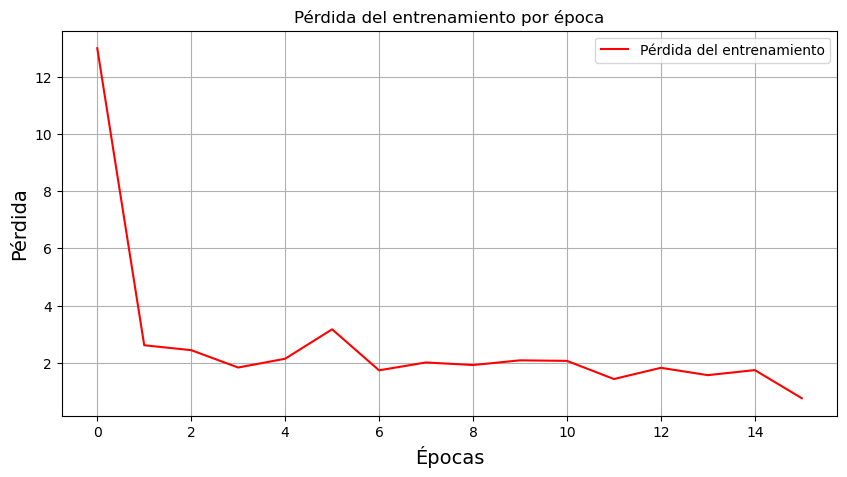

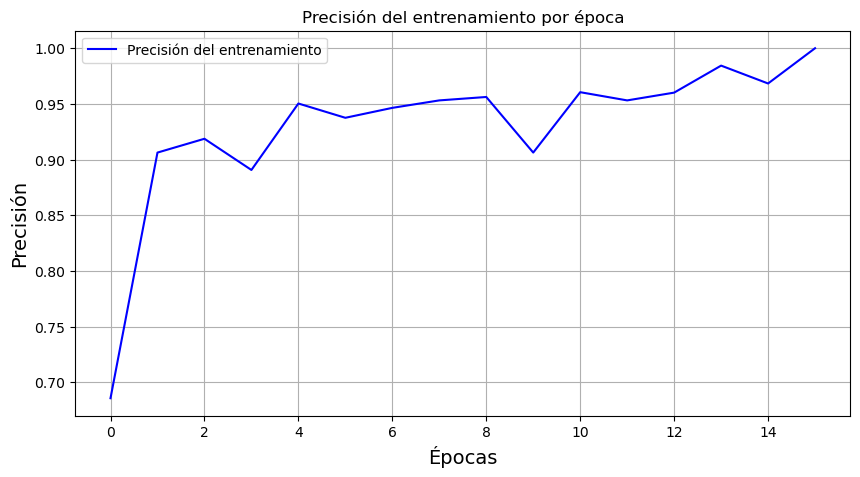

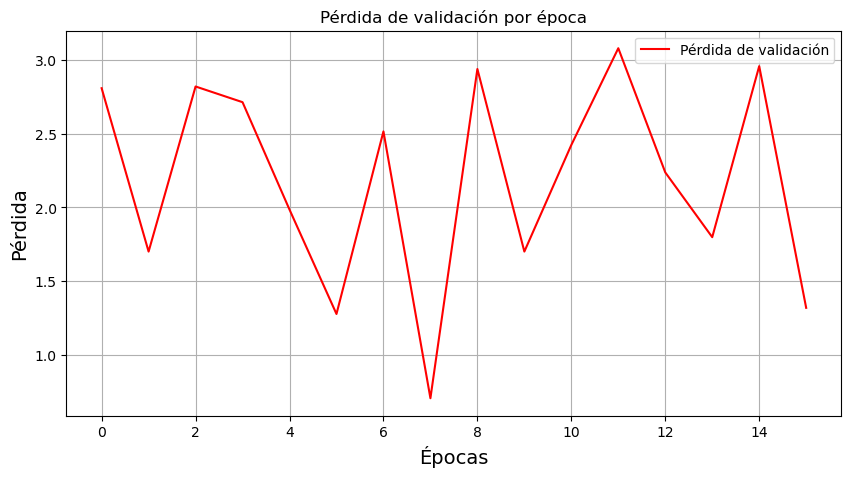

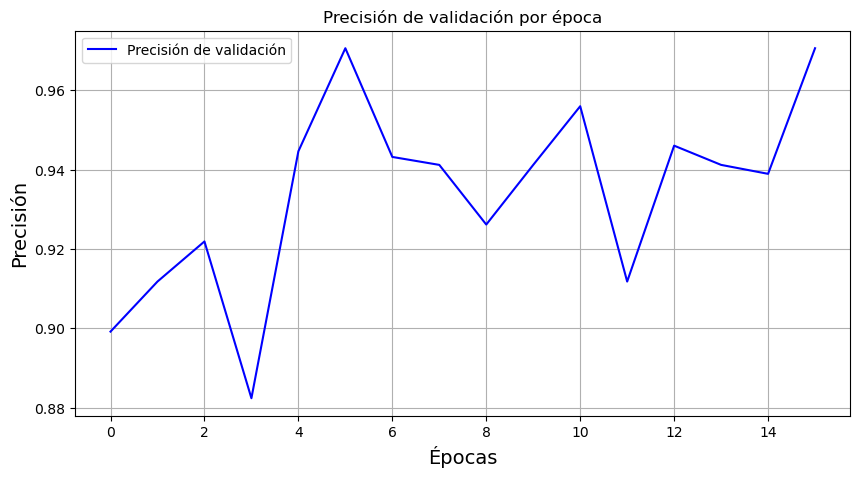

In [11]:
import matplotlib.pyplot as plt

def plotTraining(hist, typeData):
    if typeData == "loss":
        # Obteniendo los valores de la pérdida
        yc = hist.history['loss']
        epochs = len(yc)  # Actualizamos el número de épocas con la longitud real de yc
        xc = range(epochs)
        plt.figure(figsize=(10, 5))
        plt.plot(xc, yc, '-r', label='Pérdida del entrenamiento')
        plt.title('Pérdida del entrenamiento por época')
        plt.xlabel('Épocas', fontsize=14)
        plt.ylabel('Pérdida', fontsize=14)
        plt.legend()
        plt.grid()
        plt.show()

    elif typeData == "accuracy":
        # Obteniendo los valores de la precisión
        yc = hist.history['accuracy']
        epochs = len(yc)  # Actualizamos el número de épocas con la longitud real de yc
        xc = range(epochs)
        plt.figure(figsize=(10, 5))
        plt.plot(xc, yc, '-b', label='Precisión del entrenamiento')
        plt.title('Precisión del entrenamiento por época')
        plt.xlabel('Épocas', fontsize=14)
        plt.ylabel('Precisión', fontsize=14)
        plt.legend()
        plt.grid()
        plt.show()

    elif typeData == "val_loss":
        # Obteniendo los valores de la pérdida de validación
        yc = hist.history['val_loss']
        epochs = len(yc)  # Actualizamos el número de épocas con la longitud real de yc
        xc = range(epochs)
        plt.figure(figsize=(10, 5))
        plt.plot(xc, yc, '-r', label='Pérdida de validación')
        plt.title('Pérdida de validación por época')
        plt.xlabel('Épocas', fontsize=14)
        plt.ylabel('Pérdida', fontsize=14)
        plt.legend()
        plt.grid()
        plt.show()

    elif typeData == "val_accuracy":
        # Obteniendo los valores de la precisión de validación
        yc = hist.history['val_accuracy']
        epochs = len(yc)  # Actualizamos el número de épocas con la longitud real de yc
        xc = range(epochs)
        plt.figure(figsize=(10, 5))
        plt.plot(xc, yc, '-b', label='Precisión de validación')
        plt.title('Precisión de validación por época')
        plt.xlabel('Épocas', fontsize=14)
        plt.ylabel('Precisión', fontsize=14)
        plt.legend()
        plt.grid()
        plt.show()

    else:
        raise ValueError(f"Tipo de dato desconocido: {typeData}. Use 'loss', 'accuracy', 'val_loss' o 'val_accuracy'.")

# Uso de la función para graficar las diferentes métricas
plotTraining(model_history, "loss")
plotTraining(model_history, "accuracy")
plotTraining(model_history, "val_loss")
plotTraining(model_history, "val_accuracy")


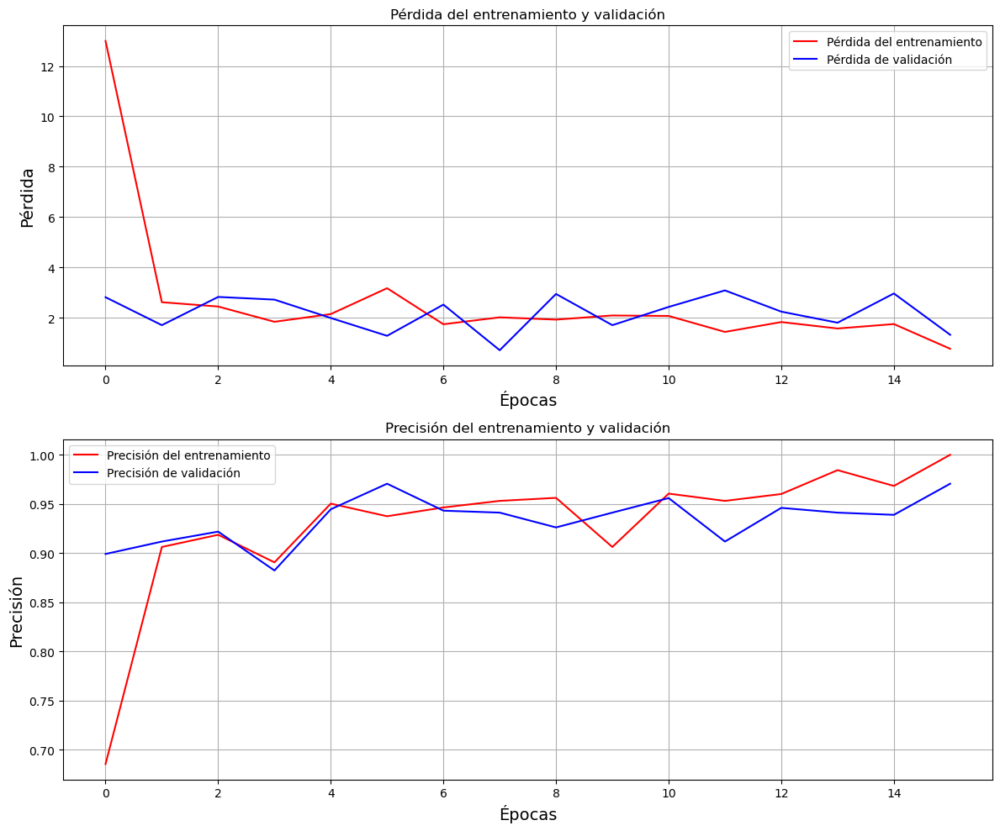

In [12]:
import matplotlib.pyplot as plt

def plotTraining(hist):
    epochs = range(len(hist.history['loss']))
    
    plt.figure(figsize=(12, 10))

    # Gráfico de la pérdida
    plt.subplot(2, 1, 1)
    plt.plot(epochs, hist.history['loss'], '-r', label='Pérdida del entrenamiento')
    plt.plot(epochs, hist.history['val_loss'], '-b', label='Pérdida de validación')
    plt.title('Pérdida del entrenamiento y validación')
    plt.xlabel('Épocas', fontsize=14)
    plt.ylabel('Pérdida', fontsize=14)
    plt.legend()
    plt.grid()

    # Gráfico de la precisión
    plt.subplot(2, 1, 2)
    plt.plot(epochs, hist.history['accuracy'], '-r', label='Precisión del entrenamiento')
    plt.plot(epochs, hist.history['val_accuracy'], '-b', label='Precisión de validación')
    plt.title('Precisión del entrenamiento y validación')
    plt.xlabel('Épocas', fontsize=14)
    plt.ylabel('Precisión', fontsize=14)
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

# Uso de la función para graficar
plotTraining(model_history)


Found 361 images belonging to 18 classes.


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 43s 6s/step
              precision    recall  f1-score   support

           0     1.0000    0.5500    0.7097        20
           1     0.7778    0.3500    0.4828        20
           2     0.8696    1.0000    0.9302        20
           3     0.7083    0.8500    0.7727        20
           4     0.5714    0.8000    0.6667        20
           5     0.3830    0.9000    0.5373        20
           6     0.6897    1.0000    0.8163        20
           7     0.9375    0.7500    0.8333        20
           8     0.9500    0.9500    0.9500        20
           9     0.6250    1.0000    0.7692        20
          10     0.7500    0.9000    0.8182        20
          11     0.8571    0.6000    0.7059        20
          12     0.8000    0.4000    0.5333        20
          13     0.8000    0.2000    0.3200        20
          14     0.9000    0.9000    0.9000        20
          15     1.0000    0.5500    0.7097        20
          16     0.8462    0.5500    0.6667 

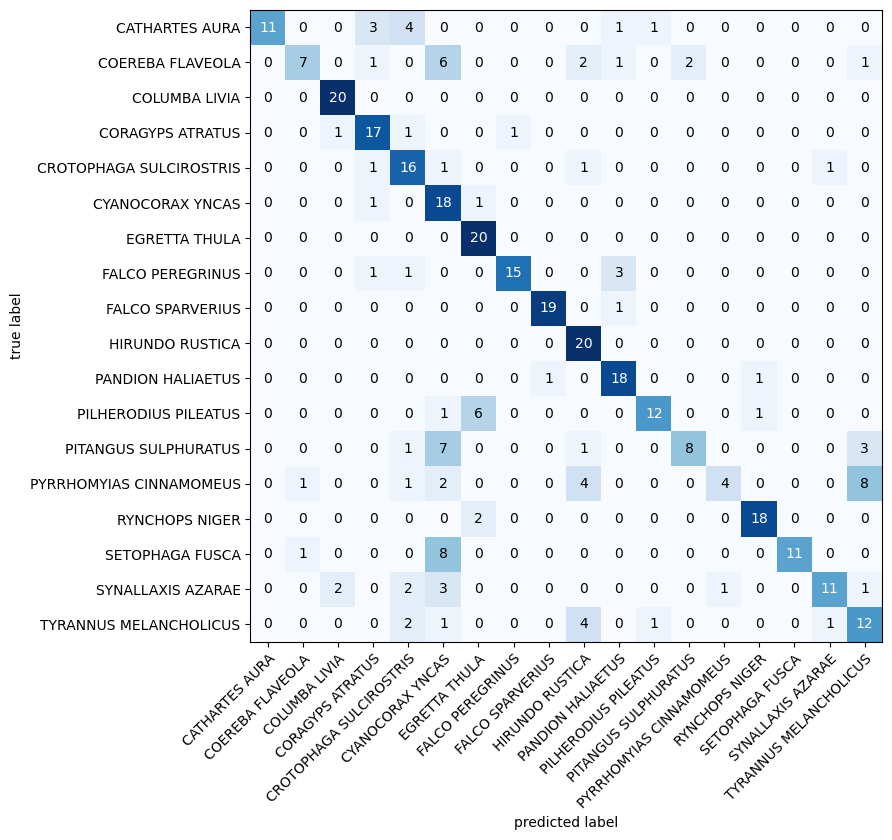

In [10]:
from sklearn.metrics import confusion_matrix, f1_score, roc_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


names = [ 'CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']



test_data_dir = 'datasetpreprocesado/test'  

test_datagen = ImageDataGenerator()

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape), 
    batch_size = batch_size,
    class_mode='categorical', 
    shuffle=False)

custom_Model50= load_model('best_model.keras')

predictions = custom_Model50.predict(test_generator)


y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes


matc=confusion_matrix(y_real, y_pred)

plot_confusion_matrix(conf_mat=matc, figsize=(9,9), class_names = names, show_normed=False)
plt.tight_layout()

print(metrics.classification_report(y_real,y_pred, digits = 4))

# Prueba 7

In [3]:
import time
import psutil
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Definir el número de muestras de entrenamiento y validación
nb_train_samples = 2621
nb_validation_samples = 738

# Definir el número de épocas
epochs = 50

# Definir el tamaño de las imágenes
width_shape = 224
height_shape = 224

# Definir el número de clases
num_classes = 18  # Ajustar según el número de clases en tu dataset

# Directorios de datos de entrenamiento y validación
train_data_dir = 'datasetpreprocesado/train'  
validation_data_dir = 'datasetpreprocesado/valid'

# Función para crear y entrenar el modelo
def create_and_train_vgg16_model(learning_rate, l2_regularization, batch_size):
    # Crear generadores de datos con el batch_size proporcionado
    train_datagen = ImageDataGenerator(
        rotation_range=20,
        zoom_range=0.2,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True,
        vertical_flip=False,
        preprocessing_function=preprocess_input
    )

    valid_datagen = ImageDataGenerator(
        rotation_range=20,
        zoom_range=0.2,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True,
        vertical_flip=False,
        preprocessing_function=preprocess_input
    )

    train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(width_shape, height_shape),
        batch_size=batch_size,
        class_mode='categorical'
    )

    validation_generator = valid_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(width_shape, height_shape),
        batch_size=batch_size,
        class_mode='categorical'
    )

    # Definir la entrada de la red neuronal con el tamaño de las imágenes
    image_input = Input(shape=(width_shape, height_shape, 3))

    # Cargar el modelo VGG16 preentrenado con pesos ajustados desde ImageNet
    base_model = VGG16(input_tensor=image_input, include_top=True, weights='imagenet')

    # Aplanar la salida del VGG16
    x = Flatten(name='custom_flatten')(base_model.output)

    # Añadir una nueva capa densa al final del modelo para la clasificación multiclase con regularización L2
    out = Dense(num_classes, activation='softmax', kernel_regularizer='l2', name='custom_dense')(x)

    # Crear un nuevo modelo personalizado que toma la entrada de la imagen y produce la salida clasificada
    custom_vgg_model = Model(inputs=base_model.input, outputs=out)

    # Congelar todas las capas del modelo base VGG16
    for layer in base_model.layers:
        layer.trainable = False

    # Compilar el modelo con una función de pérdida, optimizador y métricas especificadas
    custom_vgg_model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=learning_rate), metrics=['accuracy'])

    # Mostrar un resumen del modelo que incluye la arquitectura y el número de parámetros
    custom_vgg_model.summary()

    # Medir el tiempo y el uso de CPU/memoria antes de entrenar
    start_time = time.time()
    start_cpu = psutil.cpu_percent(interval=None)
    start_memory = psutil.virtual_memory().used

    # Crear los callbacks para Early Stopping y guardar el mejor modelo
    checkpoint = ModelCheckpoint('best_model.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    early_stopping = EarlyStopping(monitor='val_accuracy', patience=10, verbose=1, restore_best_weights=True)

    # Entrenar el modelo utilizando generadores de datos para el conjunto de entrenamiento y validación
    model_history = custom_vgg_model.fit(
        train_generator,
        epochs=epochs,
        validation_data=validation_generator,
        steps_per_epoch=nb_train_samples // batch_size,
        validation_steps=nb_validation_samples // batch_size,
        callbacks=[checkpoint, early_stopping]
    )

    # Medir el tiempo y el uso de CPU/memoria después de entrenar
    end_time = time.time()
    end_cpu = psutil.cpu_percent(interval=None)
    end_memory = psutil.virtual_memory().used

    # Calcular métricas de tiempo y uso de recursos
    elapsed_time = end_time - start_time
    cpu_usage = end_cpu - start_cpu
    memory_usage = end_memory - start_memory

    print(f"Tiempo transcurrido para el entrenamiento: {elapsed_time} segundos")
    print(f"Uso de CPU durante el entrenamiento: {cpu_usage}%")
    print(f"Aumento en uso de memoria: {memory_usage / (1024 ** 3)} GB")

    return model_history, elapsed_time, cpu_usage, memory_usage

# Definir rangos de búsqueda para hiperparámetros
learning_rates = [0.0001, 0.0005, 0.001]
l2_regularizations = [0.01, 0.05, 0.1]
batch_sizes = [16, 32, 64]

# Variables para almacenar los mejores hiperparámetros y su rendimiento
best_val_accuracy = 0
best_hyperparams = {}

# Realizar la búsqueda de cuadrícula
for learning_rate in learning_rates:
    for l2_regularization in l2_regularizations:
        for batch_size in batch_sizes:
            # Crear y entrenar el modelo con los hiperparámetros actuales
            model_history, elapsed_time, cpu_usage, memory_usage = create_and_train_vgg16_model(learning_rate, l2_regularization, batch_size)
            
            # Obtener la mejor precisión de validación de esta combinación de hiperparámetros
            val_accuracy = np.max(model_history.history['val_accuracy'])
            
            # Imprimir los resultados
            print(f"Resultados para lr={learning_rate}, l2={l2_regularization}, batch_size={batch_size}:")
            print(f"Tiempo: {elapsed_time} segundos, CPU: {cpu_usage}%, Memoria: {memory_usage / (1024 ** 3)} GB")
            print(f"Precisión de validación: {val_accuracy}")
            
            # Actualizar los mejores hiperparámetros si la precisión de validación mejora
            if val_accuracy > best_val_accuracy:
                best_val_accuracy = val_accuracy
                best_hyperparams = {
                    'learning_rate': learning_rate,
                    'l2_regularization': l2_regularization,
                    'batch_size': batch_size,
                    'val_accuracy': val_accuracy,
                    'elapsed_time': elapsed_time,
                    'cpu_usage': cpu_usage,
                    'memory_usage': memory_usage
                }

# Imprimir los mejores hiperparámetros y su rendimiento
print("Mejores hiperparámetros encontrados:")
print(best_hyperparams)


Found 2621 images belonging to 18 classes.
Found 738 images belonging to 18 classes.


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.0766 - loss: 3.1955
Epoch 1: val_accuracy improved from -inf to 0.13451, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 365s 2s/step - accuracy: 0.0768 - loss: 3.1952 - val_accuracy: 0.1345 - val_loss: 3.0679
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - accuracy: 0.0625 - loss: 3.0668

C:\Users\Oscar Diaz\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 2: val_accuracy did not improve from 0.13451
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0625 - loss: 3.0668 - val_accuracy: 0.0000e+00 - val_loss: 3.0574
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.1637 - loss: 3.0388
Epoch 3: val_accuracy improved from 0.13451 to 0.21467, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 361s 2s/step - accuracy: 0.1638 - loss: 3.0387 - val_accuracy: 0.2147 - val_loss: 2.9675
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - accuracy: 0.3125 - loss: 2.9683
Epoch 4: val_accuracy did not improve from 0.21467
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3125 - loss: 2.9683 - val_accuracy: 0.0000e+00 - val_loss: 2.9687
Epoch 5/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2599 - loss: 2.9509
Epoch 5: val_accuracy improved from 0.21467 to 0.34239, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 351s 2s/step - accuracy: 0.2601 - loss: 2.9508 - val_accuracy: 0.3424 - v

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.0962 - loss: 3.2078
Epoch 1: val_accuracy improved from -inf to 0.10598, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 346s 4s/step - accuracy: 0.0961 - loss: 3.2075 - val_accuracy: 0.1060 - val_loss: 3.1354
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:01 3s/step - accuracy: 0.1875 - loss: 3.1282
Epoch 2: val_accuracy did not improve from 0.10598
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1875 - loss: 3.1282 - val_accuracy: 0.0000e+00 - val_loss: 3.1432
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1299 - loss: 3.1149
Epoch 3: val_accuracy improved from 0.10598 to 0.13587, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 347s 4s/step - accuracy: 0.1300 - loss: 3.1147 - val_accuracy: 0.1359 - val_loss: 3.0595
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 3:59 3s/step - accuracy: 0.1250 - loss: 3.0502
Epoch 4: val_accuracy did not improve from 0.13587
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/st

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.0637 - loss: 3.2282
Epoch 1: val_accuracy improved from -inf to 0.09375, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 356s 9s/step - accuracy: 0.0640 - loss: 3.2278 - val_accuracy: 0.0938 - val_loss: 3.1871
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:09 6s/step - accuracy: 0.0469 - loss: 3.1898
Epoch 2: val_accuracy did not improve from 0.09375
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - accuracy: 0.0469 - loss: 3.1898 - val_accuracy: 0.0294 - val_loss: 3.1986
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.0889 - loss: 3.1741
Epoch 3: val_accuracy improved from 0.09375 to 0.13778, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 339s 8s/step - accuracy: 0.0893 - loss: 3.1738 - val_accuracy: 0.1378 - val_loss: 3.1378
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:32 7s/step - accuracy: 0.1562 - loss: 3.1376
Epoch 4: val_accuracy improved from 0.13778 to 0.23529, saving model to best_model.keras


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.1113 - loss: 3.1941
Epoch 1: val_accuracy improved from -inf to 0.20516, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 357s 2s/step - accuracy: 0.1115 - loss: 3.1938 - val_accuracy: 0.2052 - val_loss: 3.0679
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 6:39 2s/step - accuracy: 0.2500 - loss: 3.0733
Epoch 2: val_accuracy did not improve from 0.20516
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.2500 - loss: 3.0733 - val_accuracy: 0.0000e+00 - val_loss: 3.0653
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2256 - loss: 3.0380
Epoch 3: val_accuracy improved from 0.20516 to 0.28261, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 356s 2s/step - accuracy: 0.2257 - loss: 3.0378 - val_accuracy: 0.2826 - val_loss: 2.9675
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.1875 - loss: 2.9712
Epoch 4: val_accuracy did not improve from 0.28261
163/163 ━━━━━━━━━━━━━━

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.0846 - loss: 3.2216
Epoch 1: val_accuracy improved from -inf to 0.12228, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 348s 4s/step - accuracy: 0.0847 - loss: 3.2213 - val_accuracy: 0.1223 - val_loss: 3.1471
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:04 3s/step - accuracy: 0.0625 - loss: 3.1451
Epoch 2: val_accuracy improved from 0.12228 to 0.50000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - accuracy: 0.0625 - loss: 3.1451 - val_accuracy: 0.5000 - val_loss: 3.1167
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1387 - loss: 3.1243
Epoch 3: val_accuracy did not improve from 0.50000
81/81 ━━━━━━━━━━━━━━━━━━━━ 347s 4s/step - accuracy: 0.1389 - loss: 3.1241 - val_accuracy: 0.1753 - val_loss: 3.0696
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:14 3s/step - accuracy: 0.0938 - loss: 3.0729
Epoch 4: val_accuracy did not improve from 0.50000
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step 

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.0560 - loss: 3.2283
Epoch 1: val_accuracy improved from -inf to 0.08665, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 362s 9s/step - accuracy: 0.0561 - loss: 3.2279 - val_accuracy: 0.0866 - val_loss: 3.1875
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:07 6s/step - accuracy: 0.0781 - loss: 3.1928
Epoch 2: val_accuracy improved from 0.08665 to 0.11765, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 13s 182ms/step - accuracy: 0.0781 - loss: 3.1928 - val_accuracy: 0.1176 - val_loss: 3.1972
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.0993 - loss: 3.1750
Epoch 3: val_accuracy improved from 0.11765 to 0.14062, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 341s 8s/step - accuracy: 0.0997 - loss: 3.1747 - val_accuracy: 0.1406 - val_loss: 3.1395
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:14 7s/step - accuracy: 0.0781 - loss: 3.1400
Epoch 4: val_accuracy improved from 0.14062 to 0.1

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.0853 - loss: 3.1943
Epoch 1: val_accuracy improved from -inf to 0.16984, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 355s 2s/step - accuracy: 0.0855 - loss: 3.1940 - val_accuracy: 0.1698 - val_loss: 3.0692
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:35 2s/step - accuracy: 0.2500 - loss: 3.0561
Epoch 2: val_accuracy improved from 0.16984 to 0.50000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.2500 - loss: 3.0561 - val_accuracy: 0.5000 - val_loss: 3.0764
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2061 - loss: 3.0397
Epoch 3: val_accuracy did not improve from 0.50000
163/163 ━━━━━━━━━━━━━━━━━━━━ 359s 2s/step - accuracy: 0.2062 - loss: 3.0395 - val_accuracy: 0.2473 - val_loss: 2.9681
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - accuracy: 0.1875 - loss: 2.9743
Epoch 4: val_accuracy did not improve from 0.50000
163/163 ━━━━━━━━━━━━━━━━━

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.0545 - loss: 3.2192
Epoch 1: val_accuracy improved from -inf to 0.07201, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 349s 4s/step - accuracy: 0.0545 - loss: 3.2189 - val_accuracy: 0.0720 - val_loss: 3.1452
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:08 3s/step - accuracy: 0.1250 - loss: 3.1491
Epoch 2: val_accuracy improved from 0.07201 to 0.50000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.1250 - loss: 3.1491 - val_accuracy: 0.5000 - val_loss: 3.1301
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.0782 - loss: 3.1235
Epoch 3: val_accuracy did not improve from 0.50000
81/81 ━━━━━━━━━━━━━━━━━━━━ 342s 4s/step - accuracy: 0.0785 - loss: 3.1233 - val_accuracy: 0.1168 - val_loss: 3.0672
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:06 3s/step - accuracy: 0.0938 - loss: 3.0692
Epoch 4: val_accuracy did not improve from 0.50000
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step 

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.0383 - loss: 3.2350
Epoch 1: val_accuracy improved from -inf to 0.05682, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 349s 8s/step - accuracy: 0.0384 - loss: 3.2346 - val_accuracy: 0.0568 - val_loss: 3.1941
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:56 6s/step - accuracy: 0.0469 - loss: 3.1963
Epoch 2: val_accuracy did not improve from 0.05682
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - accuracy: 0.0469 - loss: 3.1963 - val_accuracy: 0.0294 - val_loss: 3.1926
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.0603 - loss: 3.1807
Epoch 3: val_accuracy improved from 0.05682 to 0.08381, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 337s 8s/step - accuracy: 0.0605 - loss: 3.1804 - val_accuracy: 0.0838 - val_loss: 3.1449
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:59 6s/step - accuracy: 0.0781 - loss: 3.1474
Epoch 4: val_accuracy did not improve from 0.08381
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/st

Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2015 - loss: 3.0636
Epoch 1: val_accuracy improved from -inf to 0.42663, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 360s 2s/step - accuracy: 0.2020 - loss: 3.0630 - val_accuracy: 0.4266 - val_loss: 2.8548
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 5:51 2s/step - accuracy: 0.4375 - loss: 2.8509
Epoch 2: val_accuracy improved from 0.42663 to 1.00000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.4375 - loss: 2.8509 - val_accuracy: 1.0000 - val_loss: 2.8538
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4730 - loss: 2.8419
Epoch 3: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━━━━ 358s 2s/step - accuracy: 0.4730 - loss: 2.8419 - val_accuracy: 0.5245 - val_loss: 2.8181
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - accuracy: 0.5625 - loss: 2.8304
Epoch 4: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━

Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1225 - loss: 3.1285
Epoch 1: val_accuracy improved from -inf to 0.35734, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 349s 4s/step - accuracy: 0.1237 - loss: 3.1275 - val_accuracy: 0.3573 - val_loss: 2.9184
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:09 3s/step - accuracy: 0.3750 - loss: 2.9194
Epoch 2: val_accuracy did not improve from 0.35734
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.3750 - loss: 2.9194 - val_accuracy: 0.0000e+00 - val_loss: 2.9299
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4026 - loss: 2.8914
Epoch 3: val_accuracy improved from 0.35734 to 0.47283, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 346s 4s/step - accuracy: 0.4028 - loss: 2.8912 - val_accuracy: 0.4728 - val_loss: 2.8442
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 5:21 4s/step - accuracy: 0.5000 - loss: 2.8305
Epoch 4: val_accuracy improved from 0.47283 to 0.50000, saving model to best_model.kera

Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.0913 - loss: 3.1883
Epoch 1: val_accuracy improved from -inf to 0.19034, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 353s 9s/step - accuracy: 0.0921 - loss: 3.1870 - val_accuracy: 0.1903 - val_loss: 3.0344
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:56 8s/step - accuracy: 0.1875 - loss: 3.0358
Epoch 2: val_accuracy improved from 0.19034 to 0.23529, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 14s 165ms/step - accuracy: 0.1875 - loss: 3.0358 - val_accuracy: 0.2353 - val_loss: 3.0330
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.2273 - loss: 2.9999
Epoch 3: val_accuracy improved from 0.23529 to 0.29261, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 341s 8s/step - accuracy: 0.2279 - loss: 2.9993 - val_accuracy: 0.2926 - val_loss: 2.9268
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:57 6s/step - accuracy: 0.4062 - loss: 2.9223
Epoch 4: val_accuracy did not improve from 0.29261

Model: "functional_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.1560 - loss: 3.0733
Epoch 1: val_accuracy improved from -inf to 0.40217, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 360s 2s/step - accuracy: 0.1565 - loss: 3.0727 - val_accuracy: 0.4022 - val_loss: 2.8613
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - accuracy: 0.4375 - loss: 2.8690
Epoch 2: val_accuracy improved from 0.40217 to 1.00000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.4375 - loss: 2.8690 - val_accuracy: 1.0000 - val_loss: 2.8305
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4571 - loss: 2.8489
Epoch 3: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━━━━ 355s 2s/step - accuracy: 0.4573 - loss: 2.8489 - val_accuracy: 0.5326 - val_loss: 2.8251
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - accuracy: 0.6250 - loss: 2.8501
Epoch 4: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━

Model: "functional_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1232 - loss: 3.1322
Epoch 1: val_accuracy improved from -inf to 0.30707, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 353s 4s/step - accuracy: 0.1240 - loss: 3.1312 - val_accuracy: 0.3071 - val_loss: 2.9228
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:06 3s/step - accuracy: 0.4062 - loss: 2.9174
Epoch 2: val_accuracy did not improve from 0.30707
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.4062 - loss: 2.9174 - val_accuracy: 0.0000e+00 - val_loss: 2.9656
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.3718 - loss: 2.8941
Epoch 3: val_accuracy improved from 0.30707 to 0.41304, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 347s 4s/step - accuracy: 0.3720 - loss: 2.8939 - val_accuracy: 0.4130 - val_loss: 2.8485
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:13 3s/step - accuracy: 0.4375 - loss: 2.8420
Epoch 4: val_accuracy did not improve from 0.41304
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/st

Model: "functional_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.0984 - loss: 3.1908
Epoch 1: val_accuracy improved from -inf to 0.18466, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 353s 9s/step - accuracy: 0.0990 - loss: 3.1895 - val_accuracy: 0.1847 - val_loss: 3.0370
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:04 6s/step - accuracy: 0.1562 - loss: 3.0350
Epoch 2: val_accuracy improved from 0.18466 to 0.26471, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 13s 173ms/step - accuracy: 0.1562 - loss: 3.0350 - val_accuracy: 0.2647 - val_loss: 3.0281
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.1981 - loss: 3.0008
Epoch 3: val_accuracy improved from 0.26471 to 0.28977, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 345s 9s/step - accuracy: 0.1987 - loss: 3.0002 - val_accuracy: 0.2898 - val_loss: 2.9268
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:23 7s/step - accuracy: 0.2188 - loss: 2.9286
Epoch 4: val_accuracy did not improve from 0.28977

Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.1224 - loss: 3.0702
Epoch 1: val_accuracy improved from -inf to 0.37636, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 357s 2s/step - accuracy: 0.1229 - loss: 3.0695 - val_accuracy: 0.3764 - val_loss: 2.8578
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:28 2s/step - accuracy: 0.3750 - loss: 2.8611
Epoch 2: val_accuracy improved from 0.37636 to 0.50000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - accuracy: 0.3750 - loss: 2.8611 - val_accuracy: 0.5000 - val_loss: 2.8441
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4033 - loss: 2.8455
Epoch 3: val_accuracy improved from 0.50000 to 0.51223, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 354s 2s/step - accuracy: 0.4035 - loss: 2.8454 - val_accuracy: 0.5122 - val_loss: 2.8205
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - accuracy: 0.3750 - loss: 2.8013
Epoch 4: val_accuracy did not improve 

Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1433 - loss: 3.1293
Epoch 1: val_accuracy improved from -inf to 0.33967, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 352s 4s/step - accuracy: 0.1442 - loss: 3.1283 - val_accuracy: 0.3397 - val_loss: 2.9191
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:03 3s/step - accuracy: 0.3750 - loss: 2.9157
Epoch 2: val_accuracy improved from 0.33967 to 0.50000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - accuracy: 0.3750 - loss: 2.9157 - val_accuracy: 0.5000 - val_loss: 2.9243
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4088 - loss: 2.8918
Epoch 3: val_accuracy did not improve from 0.50000
81/81 ━━━━━━━━━━━━━━━━━━━━ 344s 4s/step - accuracy: 0.4090 - loss: 2.8915 - val_accuracy: 0.4633 - val_loss: 2.8461
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:12 3s/step - accuracy: 0.3793 - loss: 2.8483
Epoch 4: val_accuracy improved from 0.50000 to 1.00000, saving model to best_model.keras
8

Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.0843 - loss: 3.1845
Epoch 1: val_accuracy improved from -inf to 0.16335, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 345s 8s/step - accuracy: 0.0848 - loss: 3.1832 - val_accuracy: 0.1634 - val_loss: 3.0301
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:09 6s/step - accuracy: 0.1719 - loss: 3.0297
Epoch 2: val_accuracy did not improve from 0.16335
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - accuracy: 0.1719 - loss: 3.0297 - val_accuracy: 0.1471 - val_loss: 3.0253
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.2015 - loss: 2.9939
Epoch 3: val_accuracy improved from 0.16335 to 0.32386, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 343s 8s/step - accuracy: 0.2021 - loss: 2.9932 - val_accuracy: 0.3239 - val_loss: 2.9209
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:07 6s/step - accuracy: 0.2031 - loss: 2.9261
Epoch 4: val_accuracy did not improve from 0.32386
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/st

Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2410 - loss: 2.9945
Epoch 1: val_accuracy improved from -inf to 0.46332, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 360s 2s/step - accuracy: 0.2416 - loss: 2.9939 - val_accuracy: 0.4633 - val_loss: 2.8190
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - accuracy: 0.5625 - loss: 2.8076
Epoch 2: val_accuracy improved from 0.46332 to 1.00000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - accuracy: 0.5625 - loss: 2.8076 - val_accuracy: 1.0000 - val_loss: 2.8018
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5013 - loss: 2.8078
Epoch 3: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━━━━ 359s 2s/step - accuracy: 0.5015 - loss: 2.8077 - val_accuracy: 0.5312 - val_loss: 2.7812
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:18 2s/step - accuracy: 0.2500 - loss: 2.7819
Epoch 4: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━

Model: "functional_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1430 - loss: 3.0686
Epoch 1: val_accuracy improved from -inf to 0.45924, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 350s 4s/step - accuracy: 0.1445 - loss: 3.0674 - val_accuracy: 0.4592 - val_loss: 2.8516
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:14 3s/step - accuracy: 0.5312 - loss: 2.8481
Epoch 2: val_accuracy improved from 0.45924 to 0.50000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - accuracy: 0.5312 - loss: 2.8481 - val_accuracy: 0.5000 - val_loss: 2.8618
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5006 - loss: 2.8383
Epoch 3: val_accuracy improved from 0.50000 to 0.50408, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 351s 4s/step - accuracy: 0.5006 - loss: 2.8382 - val_accuracy: 0.5041 - val_loss: 2.8135
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:08 3s/step - accuracy: 0.6250 - loss: 2.7998
Epoch 4: val_accuracy did not improve from 0.50408
8

Model: "functional_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_22 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.0829 - loss: 3.1401
Epoch 1: val_accuracy improved from -inf to 0.25142, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 345s 8s/step - accuracy: 0.0842 - loss: 3.1380 - val_accuracy: 0.2514 - val_loss: 2.9238
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:53 6s/step - accuracy: 0.1406 - loss: 2.9289
Epoch 2: val_accuracy improved from 0.25142 to 0.32353, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 13s 182ms/step - accuracy: 0.1406 - loss: 2.9289 - val_accuracy: 0.3235 - val_loss: 2.9157
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.3350 - loss: 2.8944
Epoch 3: val_accuracy improved from 0.32353 to 0.38210, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 348s 9s/step - accuracy: 0.3358 - loss: 2.8940 - val_accuracy: 0.3821 - val_loss: 2.8500
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:57 6s/step - accuracy: 0.3594 - loss: 2.8457
Epoch 4: val_accuracy improved from 0.38210 to 0.4

Model: "functional_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_23 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2191 - loss: 2.9961
Epoch 1: val_accuracy improved from -inf to 0.46060, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 361s 2s/step - accuracy: 0.2198 - loss: 2.9955 - val_accuracy: 0.4606 - val_loss: 2.8177
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - accuracy: 0.3750 - loss: 2.8064
Epoch 2: val_accuracy improved from 0.46060 to 1.00000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - accuracy: 0.3750 - loss: 2.8064 - val_accuracy: 1.0000 - val_loss: 2.7709
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4738 - loss: 2.8050
Epoch 3: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━━━━ 350s 2s/step - accuracy: 0.4739 - loss: 2.8049 - val_accuracy: 0.5245 - val_loss: 2.7783
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - accuracy: 0.5625 - loss: 2.7841
Epoch 4: val_accuracy did not improve from 1.00000
163/163 ━━━━━━━━━━━━━━━━━

Model: "functional_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_24 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1535 - loss: 3.0690
Epoch 1: val_accuracy improved from -inf to 0.46332, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 346s 4s/step - accuracy: 0.1549 - loss: 3.0677 - val_accuracy: 0.4633 - val_loss: 2.8484
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:06 3s/step - accuracy: 0.5312 - loss: 2.8454
Epoch 2: val_accuracy did not improve from 0.46332
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.5312 - loss: 2.8454 - val_accuracy: 0.0000e+00 - val_loss: 2.8535
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4983 - loss: 2.8365
Epoch 3: val_accuracy improved from 0.46332 to 0.52717, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 345s 4s/step - accuracy: 0.4985 - loss: 2.8364 - val_accuracy: 0.5272 - val_loss: 2.8099
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 4:07 3s/step - accuracy: 0.5312 - loss: 2.8100
Epoch 4: val_accuracy improved from 0.52717 to 1.00000, saving model to best_model.kera

Model: "functional_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_25 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.1017 - loss: 3.1400
Epoch 1: val_accuracy improved from -inf to 0.25284, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 350s 8s/step - accuracy: 0.1030 - loss: 3.1379 - val_accuracy: 0.2528 - val_loss: 2.9239
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:06 6s/step - accuracy: 0.2188 - loss: 2.9276
Epoch 2: val_accuracy improved from 0.25284 to 0.26471, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - accuracy: 0.2188 - loss: 2.9276 - val_accuracy: 0.2647 - val_loss: 2.9167
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.3108 - loss: 2.8949
Epoch 3: val_accuracy improved from 0.26471 to 0.42188, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 340s 8s/step - accuracy: 0.3116 - loss: 2.8944 - val_accuracy: 0.4219 - val_loss: 2.8506
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3:52 6s/step - accuracy: 0.2969 - loss: 2.8544
Epoch 4: val_accuracy did not improve from 0.42188

Model: "functional_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_26 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2899 - loss: 2.9905
Epoch 1: val_accuracy improved from -inf to 0.48098, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 355s 2s/step - accuracy: 0.2904 - loss: 2.9899 - val_accuracy: 0.4810 - val_loss: 2.8158
Epoch 2/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:23 2s/step - accuracy: 0.5000 - loss: 2.8190
Epoch 2: val_accuracy improved from 0.48098 to 0.50000, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - accuracy: 0.5000 - loss: 2.8190 - val_accuracy: 0.5000 - val_loss: 2.7869
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5144 - loss: 2.8026
Epoch 3: val_accuracy improved from 0.50000 to 0.57201, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 354s 2s/step - accuracy: 0.5146 - loss: 2.8026 - val_accuracy: 0.5720 - val_loss: 2.7791
Epoch 4/50
  1/163 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.5000 - loss: 2.7909
Epoch 4: val_accuracy improved from 0.

Model: "functional_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_27 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1336 - loss: 3.0745
Epoch 1: val_accuracy improved from -inf to 0.45245, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 350s 4s/step - accuracy: 0.1350 - loss: 3.0732 - val_accuracy: 0.4524 - val_loss: 2.8566
Epoch 2/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 5:11 4s/step - accuracy: 0.5312 - loss: 2.8480
Epoch 2: val_accuracy improved from 0.45245 to 0.50000, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - accuracy: 0.5312 - loss: 2.8480 - val_accuracy: 0.5000 - val_loss: 2.8530
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4663 - loss: 2.8439
Epoch 3: val_accuracy improved from 0.50000 to 0.51902, saving model to best_model.keras
81/81 ━━━━━━━━━━━━━━━━━━━━ 345s 4s/step - accuracy: 0.4665 - loss: 2.8438 - val_accuracy: 0.5190 - val_loss: 2.8174
Epoch 4/50
 1/81 ━━━━━━━━━━━━━━━━━━━━ 3:59 3s/step - accuracy: 0.5625 - loss: 2.8044
Epoch 4: val_accuracy improved from 0.51902 to 1.000

Model: "functional_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_28 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_flatten (Flatten)        │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_dense (Dense)            │ (None, 18)             │        18,01

 Total params: 138,375,562 (527.86 MB)

 Trainable params: 18,018 (70.38 KB)

 Non-trainable params: 138,357,544 (527.79 MB)

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.1474 - loss: 3.1268
Epoch 1: val_accuracy improved from -inf to 0.42756, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 355s 8s/step - accuracy: 0.1495 - loss: 3.1247 - val_accuracy: 0.4276 - val_loss: 2.9106
Epoch 2/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:11 6s/step - accuracy: 0.4219 - loss: 2.9086
Epoch 2: val_accuracy did not improve from 0.42756
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.4219 - loss: 2.9086 - val_accuracy: 0.3529 - val_loss: 2.9115
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.4548 - loss: 2.8814
Epoch 3: val_accuracy improved from 0.42756 to 0.51705, saving model to best_model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 344s 9s/step - accuracy: 0.4556 - loss: 2.8810 - val_accuracy: 0.5170 - val_loss: 2.8368
Epoch 4/50
 1/40 ━━━━━━━━━━━━━━━━━━━━ 4:14 7s/step - accuracy: 0.5312 - loss: 2.8409
Epoch 4: val_accuracy did not improve from 0.51705
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/st

# graficas de entrenamiento y validación 

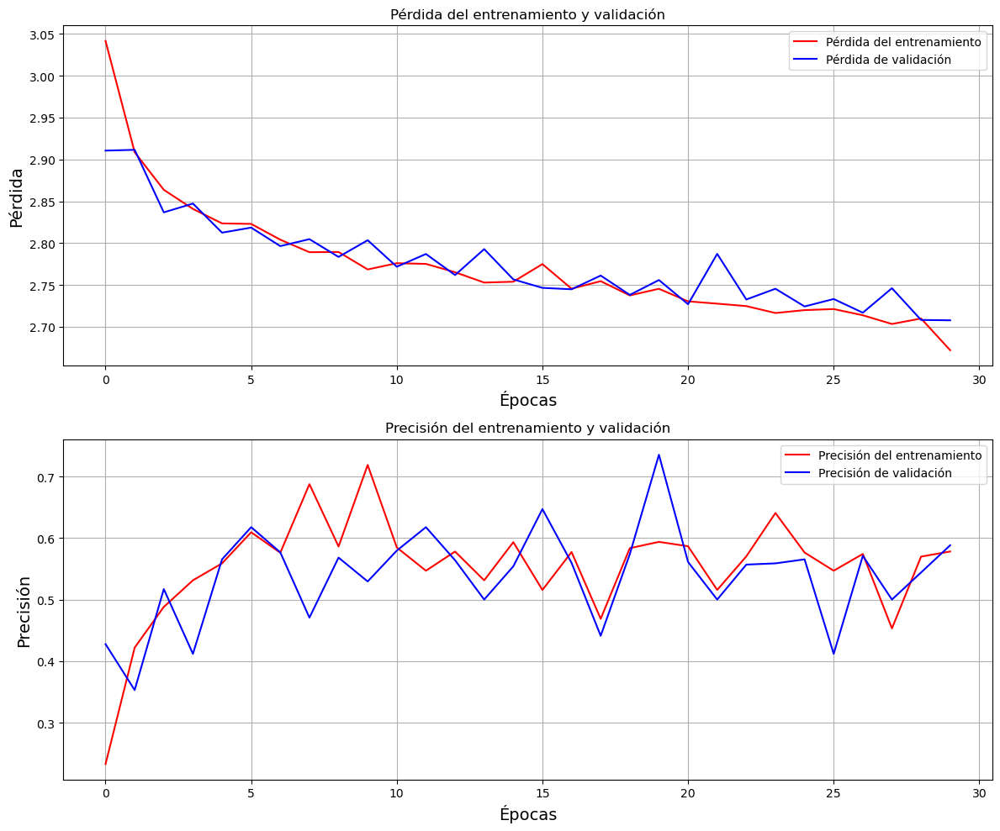

In [5]:
import matplotlib.pyplot as plt

def plotTraining(hist):
    epochs = range(len(hist.history['loss']))
    
    plt.figure(figsize=(12, 10))

    # Gráfico de la pérdida
    plt.subplot(2, 1, 1)
    plt.plot(epochs, hist.history['loss'], '-r', label='Pérdida del entrenamiento')
    plt.plot(epochs, hist.history['val_loss'], '-b', label='Pérdida de validación')
    plt.title('Pérdida del entrenamiento y validación')
    plt.xlabel('Épocas', fontsize=14)
    plt.ylabel('Pérdida', fontsize=14)
    plt.legend()
    plt.grid()

    # Gráfico de la precisión
    plt.subplot(2, 1, 2)
    plt.plot(epochs, hist.history['accuracy'], '-r', label='Precisión del entrenamiento')
    plt.plot(epochs, hist.history['val_accuracy'], '-b', label='Precisión de validación')
    plt.title('Precisión del entrenamiento y validación')
    plt.xlabel('Épocas', fontsize=14)
    plt.ylabel('Precisión', fontsize=14)
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

# Uso de la función para graficar
plotTraining(model_history)

Found 361 images belonging to 18 classes.


C:\Users\Oscar Diaz\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 42s 6s/step
              precision    recall  f1-score   support

           0     0.4783    0.5500    0.5116        20
           1     0.4444    0.2000    0.2759        20
           2     0.6000    0.4500    0.5143        20
           3     0.6667    0.1000    0.1739        20
           4     0.2812    0.4500    0.3462        20
           5     0.1509    0.4000    0.2192        20
           6     0.4872    0.9500    0.6441        20
           7     0.1967    0.6000    0.2963        20
           8     0.1111    0.0500    0.0690        20
           9     0.0385    0.0500    0.0435        20
          10     0.2500    0.0500    0.0833        20
          11     0.2381    0.2500    0.2439        20
          12     0.1250    0.0500    0.0714        20
          13     0.0952    0.1000    0.0976        20
          14     0.7778    0.7000    0.7368        20
          15     0.0000    0.0000    0.0000        20
          16     0.3125    0.2500    0.2778 

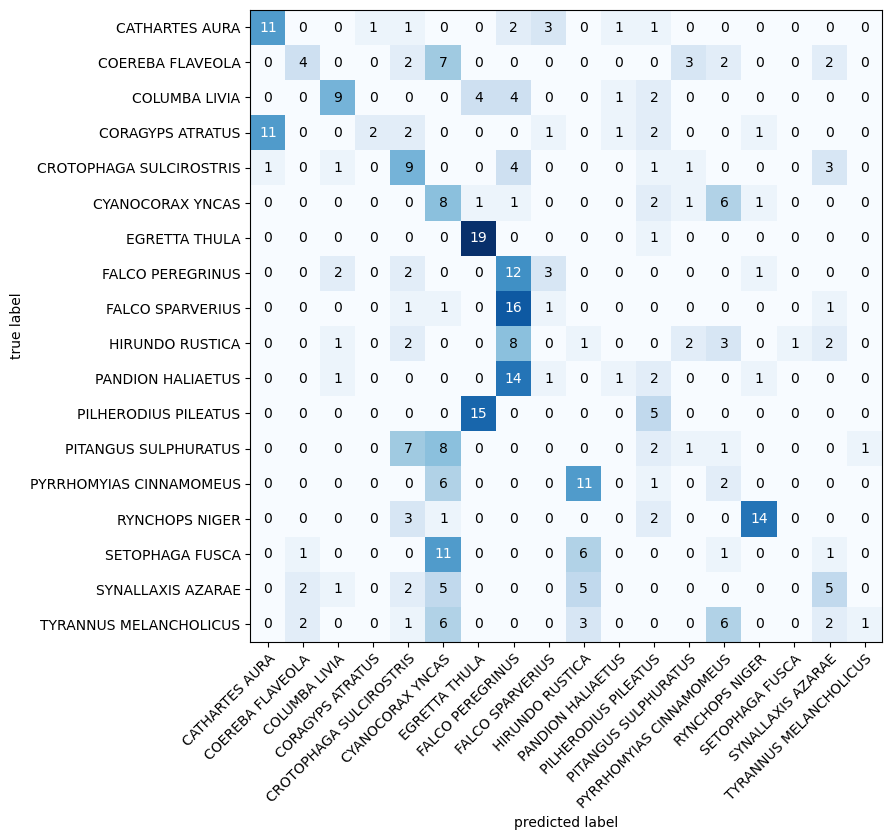

In [6]:
from sklearn.metrics import confusion_matrix, f1_score, roc_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


names = [ 'CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']



test_data_dir = 'datasetpreprocesado/test'  

test_datagen = ImageDataGenerator()

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape), 
    batch_size = batch_size,
    class_mode='categorical', 
    shuffle=False)

custom_Model50= load_model('best_model.keras')

predictions = custom_Model50.predict(test_generator)


y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes


matc=confusion_matrix(y_real, y_pred)

plot_confusion_matrix(conf_mat=matc, figsize=(9,9), class_names = names, show_normed=False)
plt.tight_layout()

print(metrics.classification_report(y_real,y_pred, digits = 4))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 991ms/step
Clase predicha: CYANOCORAX YNCAS
Porcentaje de confianza: 98.90%


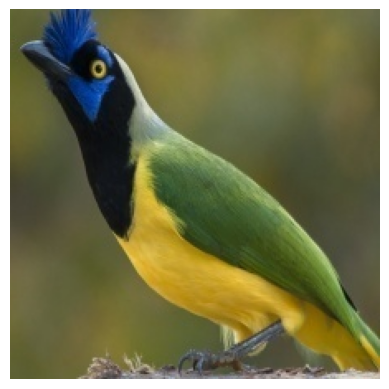

In [12]:
from keras.applications.imagenet_utils import preprocess_input, decode_predictions
from keras.models import load_model
import cv2

names =  [
    'CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 
    'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS',
    'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS',
    'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA',
    'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']

# Cargar el modelo
modelt = load_model("models\entrenamiento.keras")
#modelt = custom_vgg_model

# Ruta de la imagen de prueba
imaget_path = 'output\CYANOCORAX YNCAS_CYANOCORAX YNCAS_1.jpg'

# Leer la imagen, cambiar tamaño y preprocesar
imaget=cv2.resize(cv2.imread(imaget_path), (width_shape, height_shape), interpolation = cv2.INTER_AREA)
xt = np.asarray(imaget)
xt=preprocess_input(xt)
xt = np.expand_dims(xt,axis=0)

# Obtener las predicciones del modelo
preds = modelt.predict(xt)

# Obtener la clase predicha y su porcentaje de confianza
predicted_class_index = np.argmax(preds)
predicted_class_name = names[predicted_class_index]
confidence_percentage = preds[0][predicted_class_index] * 100

# Imprimir el resultado
print(f'Clase predicha: {predicted_class_name}')
print(f'Porcentaje de confianza: {confidence_percentage:.2f}%')

# Mostrar la imagen
plt.imshow(cv2.cvtColor(np.asarray(imaget), cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 839ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 770ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 830ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 957ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 994ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 975ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 835ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 973ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 841ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865

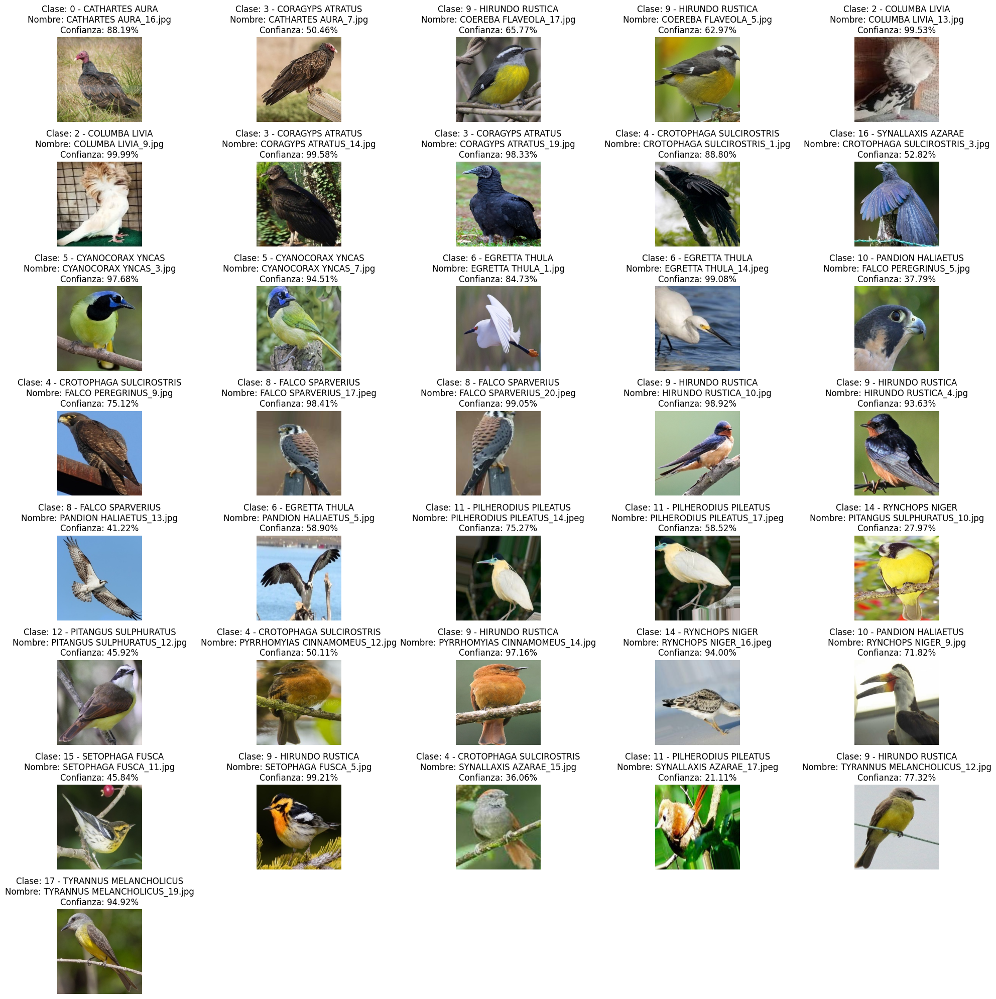

In [22]:
import os
import cv2
from keras.applications.imagenet_utils import preprocess_input
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt

# Definir el tamaño de las imágenes
width_shape = 224
height_shape = 224

# Nombres de las clases
class_names = [
    'CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 
    'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS',
    'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS',
    'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA',
    'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS'
]

# Cargar el modelo
model = load_model("models/entrenamiento.keras")

# Directorio de salida
output_dir = "output"

# Obtener una lista de todas las imágenes en el directorio de salida
image_files = [f for f in os.listdir(output_dir) if os.path.isfile(os.path.join(output_dir, f))]

# Número de columnas por fila
num_cols = 5

# Número de imágenes procesadas
num_processed = 0

# Crear una nueva figura
plt.figure(figsize=(20, 20))

# Iterar sobre cada imagen
for image_file in image_files:
    # Ruta completa de la imagen
    image_path = os.path.join(output_dir, image_file)
    
    # Leer la imagen, cambiar tamaño y preprocesar
    image = cv2.imread(image_path)
    image = cv2.resize(image, (width_shape, height_shape), interpolation=cv2.INTER_AREA)
    image = np.asarray(image)
    image = preprocess_input(image)
    image = np.expand_dims(image, axis=0)

    # Obtener las predicciones del modelo
    preds = model.predict(image)

    # Obtener la clase predicha y su porcentaje de confianza
    predicted_class_index = np.argmax(preds)
    confidence_percentage = preds[0][predicted_class_index] * 100
    predicted_class_name = class_names[predicted_class_index]

    # Mostrar la imagen y la predicción
    plt.subplot((len(image_files) - 1) // num_cols + 1, num_cols, num_processed + 1)
    plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
    plt.title(f'Clase: {predicted_class_index} - {predicted_class_name}\nNombre: {image_file}\nConfianza: {confidence_percentage:.2f}%')
    plt.axis('off')
    
    # Incrementar el contador de imágenes procesadas
    num_processed += 1

# Ajustar el espacio entre subtramas y mostrar la figura
plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 753ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 845ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 824ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 794ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 819ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 830ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

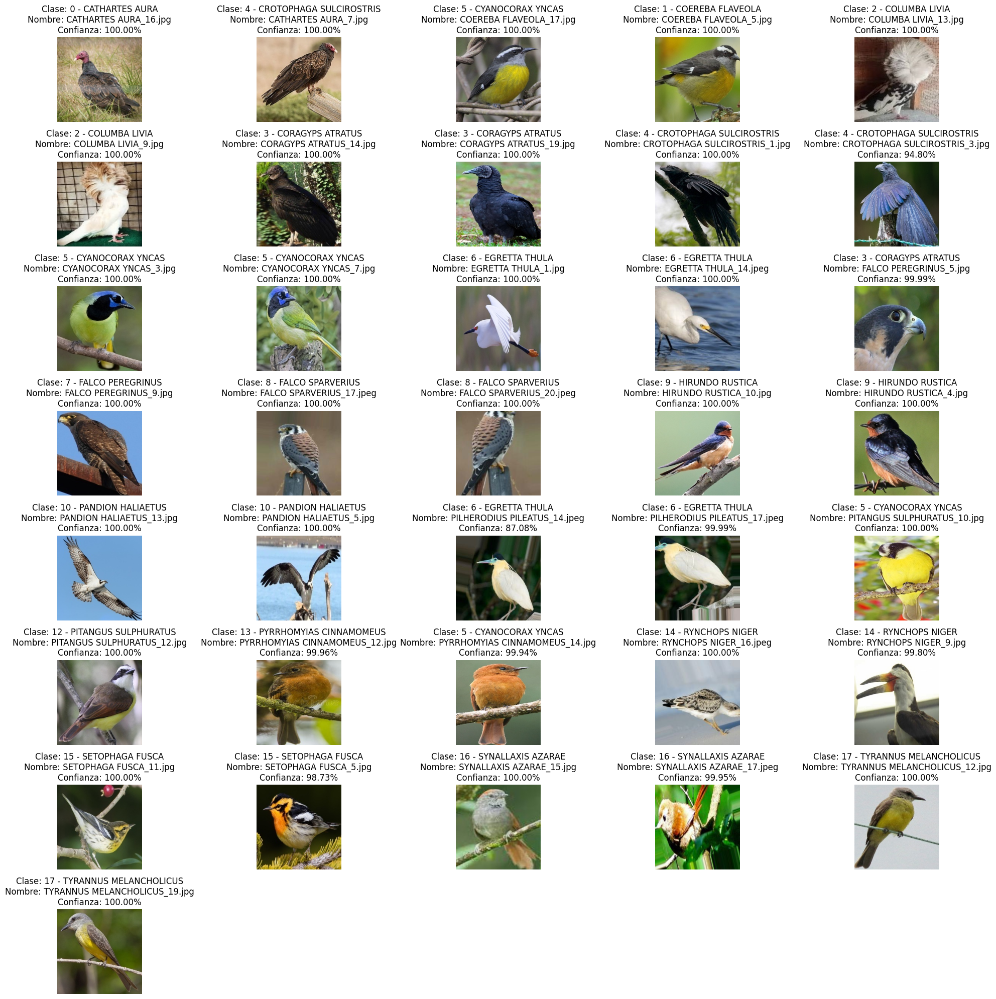

In [21]:
import os
import cv2
from keras.applications.imagenet_utils import preprocess_input
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt

# Definir el tamaño de las imágenes
width_shape = 224
height_shape = 224

# Nombres de las clases
class_names = [
    'CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 
    'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS',
    'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS',
    'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA',
    'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS'
]

# Cargar el modelo
model = load_model("models/optimizado.keras")

# Directorio de salida
output_dir = "output"

# Obtener una lista de todas las imágenes en el directorio de salida
image_files = [f for f in os.listdir(output_dir) if os.path.isfile(os.path.join(output_dir, f))]

# Número de columnas por fila
num_cols = 5

# Número de imágenes procesadas
num_processed = 0

# Crear una nueva figura
plt.figure(figsize=(20, 20))

# Iterar sobre cada imagen
for image_file in image_files:
    # Ruta completa de la imagen
    image_path = os.path.join(output_dir, image_file)
    
    # Leer la imagen, cambiar tamaño y preprocesar
    image = cv2.imread(image_path)
    image = cv2.resize(image, (width_shape, height_shape), interpolation=cv2.INTER_AREA)
    image = np.asarray(image)
    image = preprocess_input(image)
    image = np.expand_dims(image, axis=0)

    # Obtener las predicciones del modelo
    preds = model.predict(image)

    # Obtener la clase predicha y su porcentaje de confianza
    predicted_class_index = np.argmax(preds)
    confidence_percentage = preds[0][predicted_class_index] * 100
    predicted_class_name = class_names[predicted_class_index]

    # Mostrar la imagen y la predicción
    plt.subplot((len(image_files) - 1) // num_cols + 1, num_cols, num_processed + 1)
    plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
    plt.title(f'Clase: {predicted_class_index} - {predicted_class_name}\nNombre: {image_file}\nConfianza: {confidence_percentage:.2f}%')
    plt.axis('off')
    
    # Incrementar el contador de imágenes procesadas
    num_processed += 1

# Ajustar el espacio entre subtramas y mostrar la figura
plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 812ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 812ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 736ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 768ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 760ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 703ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 834ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 835ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

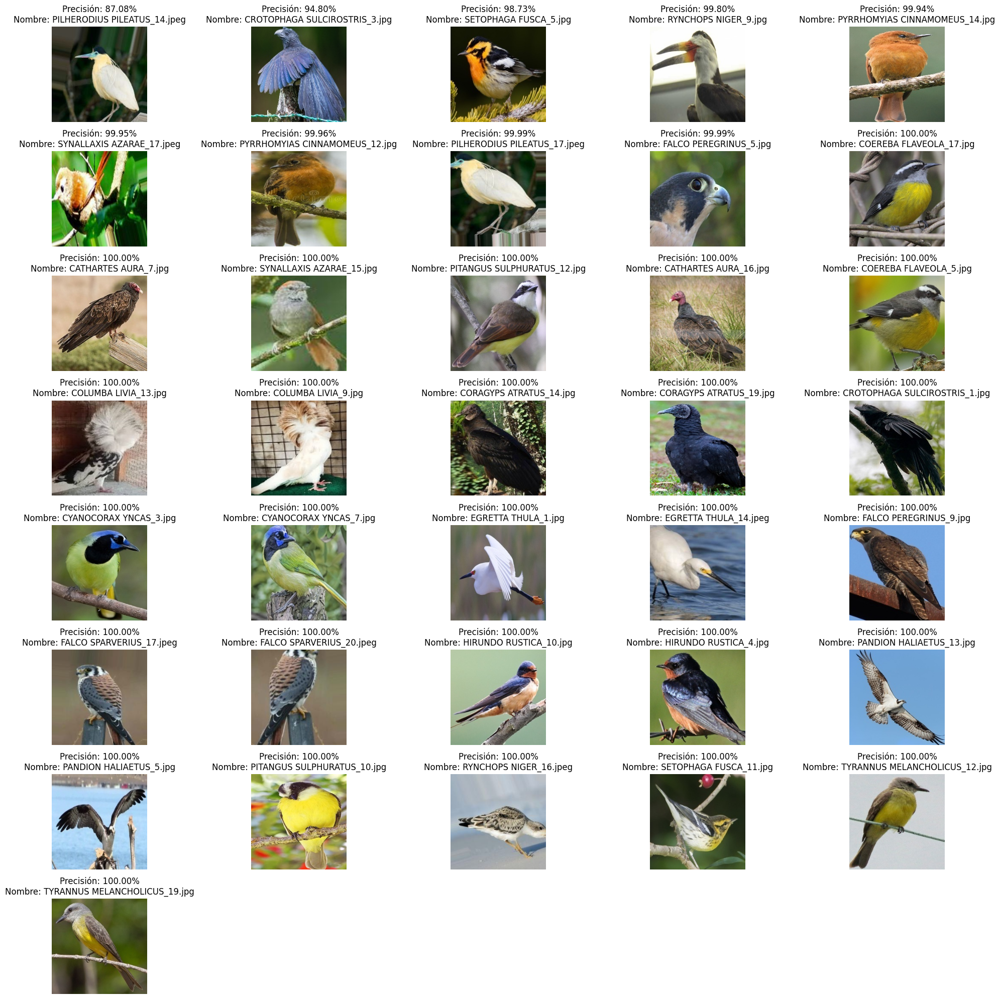

In [22]:
import os
import cv2
from keras.applications.imagenet_utils import preprocess_input
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt

# Definir el tamaño de las imágenes
width_shape = 224
height_shape = 224

# Nombres de las clases
class_names = [
    'CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 
    'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS',
    'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS',
    'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA',
    'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS'
]

# Cargar el modelo
model = load_model("models/optimizado.keras")

# Directorio de salida
output_dir = "output"

# Obtener una lista de todas las imágenes en el directorio de salida
image_files = [f for f in os.listdir(output_dir) if os.path.isfile(os.path.join(output_dir, f))]

# Calcular la precisión para cada imagen y almacenarla en una lista de tuplas
image_precisions = []
for image_file in image_files:
    # Ruta completa de la imagen
    image_path = os.path.join(output_dir, image_file)
    
    # Leer la imagen, cambiar tamaño y preprocesar
    image = cv2.imread(image_path)
    image = cv2.resize(image, (width_shape, height_shape), interpolation=cv2.INTER_AREA)
    image = np.asarray(image)
    image = preprocess_input(image)
    image = np.expand_dims(image, axis=0)

    # Obtener las predicciones del modelo
    preds = model.predict(image)

    # Obtener la clase predicha y su porcentaje de confianza
    predicted_class_index = np.argmax(preds)
    confidence_percentage = preds[0][predicted_class_index] * 100
    
    # Almacenar la precisión y el nombre de la imagen en la lista de tuplas
    image_precisions.append((confidence_percentage, image_file))

# Ordenar la lista de imágenes según la precisión
image_precisions.sort()

# Crear una nueva figura
plt.figure(figsize=(20, 20))

# Iterar sobre cada imagen ordenada por precisión
for idx, (precision, image_file) in enumerate(image_precisions):
    # Ruta completa de la imagen
    image_path = os.path.join(output_dir, image_file)
    
    # Mostrar la imagen y la predicción
    plt.subplot((len(image_files) - 1) // num_cols + 1, num_cols, idx + 1)
    plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
    plt.title(f'Precisión: {precision:.2f}%\nNombre: {image_file}')
    plt.axis('off')

# Ajustar el espacio entre subtramas y mostrar la figura
plt.tight_layout()
plt.show()


C:\Users\DIAZOVIEDO\anaconda3\envs\TFMaves\lib\site-packages\keras\src\saving\saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 58 variables whereas the saved optimizer has 6 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


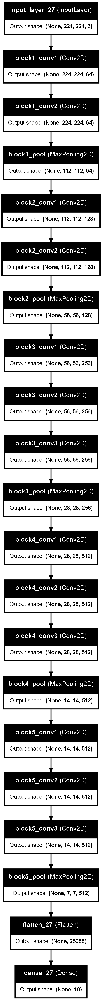

In [1]:
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model

# Cargar el modelo
model = load_model("models/optimizado.keras")

# Guardar la representación gráfica de la arquitectura del modelo en un archivo
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)


C:\Users\DIAZOVIEDO\anaconda3\envs\TFMaves\lib\site-packages\keras\src\saving\saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 58 variables whereas the saved optimizer has 6 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


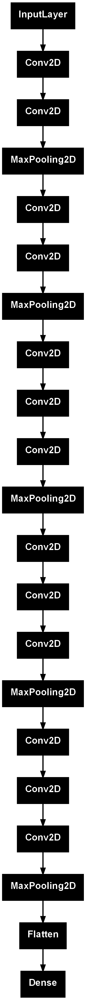

In [1]:
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model

# Cargar el modelo
model = load_model("models/optimizado.keras")

# Generar un gráfico más compacto
plot_model(model, to_file='model_plot.png', show_shapes=False, show_layer_names=False)


# PRUEBA 8 

In [2]:
# Importaciones necesarias
import time
import psutil
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import albumentations as A
from imgaug import augmenters as iaa



# Definir el número de muestras de entrenamiento y validación
nb_train_samples = 2621
nb_validation_samples = 738

# Definir el número de épocas
epochs = 50

# Definir el tamaño de las imágenes
width_shape = 224
height_shape = 224

# Definir el número de clases
num_classes = 18  # Ajustar según el número de clases en tu dataset

# Directorios de datos de entrenamiento y validación
train_data_dir = 'datasetpreprocesado/train'
validation_data_dir = 'datasetpreprocesado/valid'

# Función para crear y entrenar el modelo
def create_and_train_vgg16_model(learning_rate, l2_regularization, batch_size):
    # Función de preprocesamiento para ajuste de contraste con albumentations
    def albumentations_preprocessing(image):
        transform = A.Compose([
            A.RandomBrightnessContrast(p=1.0),
            A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=0.5)
        ])
        image = transform(image=image)['image']
        return image

    # Función de mezcla de imágenes (Mixup)
    def mixup(images, labels, alpha=0.2):
        lam = np.random.beta(alpha, alpha)
        batch_size = images.shape[0]
        index = np.random.permutation(batch_size)
        mixed_images = lam * images + (1 - lam) * images[index]
        mixed_labels = lam * labels + (1 - lam) * labels[index]
        return mixed_images, mixed_labels

    # Función para ajuste de contraste con OpenCV
    def clahe_preprocessing(image):
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        image = clahe.apply(image)
        return cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

    

    # Definición del generador de imágenes con ImageDataGenerator
    train_datagen = ImageDataGenerator(
        preprocessing_function=lambda x: preprocess_input((albumentations_preprocessing(x))),
        rotation_range=20,
        zoom_range=0.2,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True,
        vertical_flip=False
    )

    # Función que aplica Mixup a un lote de imágenes y etiquetas
    def apply_mixup(generator, batch_size, alpha=0.2):
        while True:
            x_batch, y_batch = next(generator)
            x_batch, y_batch = mixup(x_batch, y_batch, alpha)
            yield x_batch, y_batch

    # Generador de lotes de imágenes para el conjunto de entrenamiento
    train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(width_shape, height_shape),
        batch_size=batch_size,
        class_mode='categorical'
    )

    # Aplicar Mixup al generador de entrenamiento
    train_generator = apply_mixup(train_generator, batch_size)

    # Generador de imágenes para el conjunto de validación sin técnicas avanzadas de aumentación
    valid_datagen = ImageDataGenerator(
        preprocessing_function=preprocess_input,
        rotation_range=20,
        zoom_range=0.2,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True,
        vertical_flip=False
    )

    # Generador de lotes de imágenes para el conjunto de validación
    validation_generator = valid_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(width_shape, height_shape),
        batch_size=batch_size,
        class_mode='categorical'
    
    )

    # Definir la entrada de la red neuronal con el tamaño de las imágenes
    image_input = Input(shape=(width_shape, height_shape, 3))

    # Cargar el modelo VGG16 preentrenado con pesos ajustados desde ImageNet
    base_model = VGG16(input_tensor=image_input, include_top=False, weights='imagenet')

    # Aplanar la salida del VGG16
    x = Flatten()(base_model.output)

    # Añadir una nueva capa densa al final del modelo para la clasificación multiclase con regularización L2
    out = Dense(num_classes, activation='softmax', kernel_regularizer=tf.keras.regularizers.l2(l2_regularization))(x)

    # Crear un nuevo modelo personalizado que toma la entrada de la imagen y produce la salida clasificada
    custom_vgg_model = Model(inputs=base_model.input, outputs=out)

    # Congelar todas las capas del modelo base VGG16
    for layer in base_model.layers:
        layer.trainable = False

    # Compilar el modelo con una función de pérdida, optimizador y métricas especificadas
    custom_vgg_model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=learning_rate), metrics=['accuracy'])

    # Mostrar un resumen del modelo que incluye la arquitectura y el número de parámetros
    custom_vgg_model.summary()

    # Medir el tiempo y el uso de CPU/memoria antes de entrenar
    start_time = time.time()
    start_cpu = psutil.cpu_percent(interval=None)
    start_memory = psutil.virtual_memory().used

    # Directorio donde se guardará el modelo 
    model_save_dir = '/saved_models2/'


    # Crear los callbacks para Early Stopping y guardar el mejor modelo
    checkpoint = ModelCheckpoint(model_save_dir +'best_model.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    early_stopping = EarlyStopping(monitor='val_accuracy', patience=10, verbose=1, restore_best_weights=True)


    # Entrenar el modelo utilizando generadores de datos para el conjunto de entrenamiento y validación
    model_history = custom_vgg_model.fit(
        train_generator,
        epochs=epochs,
        validation_data=validation_generator,
        steps_per_epoch=nb_train_samples // batch_size,
        validation_steps=nb_validation_samples // batch_size,
        callbacks=[checkpoint, early_stopping]
    )

    # Medir el tiempo y el uso de CPU/memoria después de entrenar
    end_time = time.time()
    end_cpu = psutil.cpu_percent(interval=None)
    end_memory = psutil.virtual_memory().used

    # Calcular métricas de tiempo y uso de recursos
    elapsed_time = end_time - start_time
    cpu_usage = end_cpu - start_cpu
    memory_usage = end_memory - start_memory

    print(f"Tiempo transcurrido para el entrenamiento: {elapsed_time} segundos")
    print(f"Uso de CPU durante el entrenamiento: {cpu_usage}%")
    print(f"Aumento en uso de memoria: {memory_usage / (1024 ** 3)} GB")

    return model_history, elapsed_time, cpu_usage, memory_usage

# Definir rangos de búsqueda para hiperparámetros
learning_rates = [0.0001]
l2_regularizations = [0.01]
batch_sizes = [16]

# Variables para almacenar los mejores hiperparámetros y su rendimiento
best_val_accuracy = 0
best_hyperparams = {}

# Realizar la búsqueda de cuadrícula
for learning_rate in learning_rates:
    for l2_regularization in l2_regularizations:
        for batch_size in batch_sizes:
            # Crear y entrenar el modelo con los hiperparámetros actuales
            model_history, elapsed_time, cpu_usage, memory_usage = create_and_train_vgg16_model(learning_rate, l2_regularization, batch_size)
            
            # Obtener la mejor precisión de validación de esta combinación de hiperparámetros
            val_accuracy = np.max(model_history.history['val_accuracy'])
            
            # Imprimir los resultados
            print(f"Resultados para lr={learning_rate}, l2={l2_regularization}, batch_size={batch_size}:")
            print(f"Tiempo: {elapsed_time} segundos, CPU: {cpu_usage}%, Memoria: {memory_usage / (1024 ** 3)} GB")
            print(f"Precisión de validación: {val_accuracy}")
            
            # Actualizar los mejores hiperparámetros si la precisión de validación mejora
            if val_accuracy > best_val_accuracy:
                best_val_accuracy = val_accuracy
                best_hyperparams = {
                    'learning_rate': learning_rate,
                    'l2_regularization': l2_regularization,
                    'batch_size': batch_size,
                    'val_accuracy': val_accuracy,
                    'elapsed_time': elapsed_time,
                    'cpu_usage': cpu_usage,
                    'memory_usage': memory_usage
                }

# Imprimir los mejores hiperparámetros y su rendimiento
print("Mejores hiperparámetros encontrados:")
print(best_hyperparams)


Found 2621 images belonging to 18 classes.
Found 738 images belonging to 18 classes.


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 18)             │       451,602 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,166,290 (57.85 MB)

 Trainable params: 451,602 (1.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.0591 - loss: 3.4718 

C:\Users\DIAZOVIEDO\anaconda3\envs\TFMaves\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 1: val_accuracy improved from -inf to 0.09239, saving model to /saved_models2/best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 2577s 16s/step - accuracy: 0.0591 - loss: 3.4698 - val_accuracy: 0.0924 - val_loss: 5.4994
Epoch 2/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.0596 - loss: 2.9538 
Epoch 2: val_accuracy did not improve from 0.09239
163/163 ━━━━━━━━━━━━━━━━━━━━ 1947s 12s/step - accuracy: 0.0596 - loss: 2.9539 - val_accuracy: 0.0000e+00 - val_loss: 2.1648
Epoch 3/50


C:\Users\DIAZOVIEDO\anaconda3\envs\TFMaves\lib\contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.0541 - loss: 2.9574 
Epoch 3: val_accuracy did not improve from 0.09239
163/163 ━━━━━━━━━━━━━━━━━━━━ 2537s 16s/step - accuracy: 0.0541 - loss: 2.9575 - val_accuracy: 0.0802 - val_loss: 4.4774
Epoch 4/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.0490 - loss: 2.9660 
Epoch 4: val_accuracy did not improve from 0.09239
163/163 ━━━━━━━━━━━━━━━━━━━━ 1746s 11s/step - accuracy: 0.0490 - loss: 2.9661 - val_accuracy: 0.0000e+00 - val_loss: 2.3821
Epoch 5/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.0513 - loss: 2.9847 
Epoch 5: val_accuracy improved from 0.09239 to 0.10190, saving model to /saved_models2/best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 2264s 14s/step - accuracy: 0.0513 - loss: 2.9847 - val_accuracy: 0.1019 - val_loss: 4.4698
Epoch 6/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.0635 - loss: 2.9719 
Epoch 6: val_accuracy did not improve from 0.10190
163/163 ━━━━━━━━━━━━━━━━━━━━ 1755s 11s/ste

In [4]:
import os
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model

# Suponiendo que custom_vgg_model es un modelo de Keras
# Aquí se crea un modelo VGG16 de ejemplo
base_model = VGG16(weights='imagenet', include_top=False)
custom_vgg_model = Model(inputs=base_model.input, outputs=base_model.output)

# Nombre base del modelo
model_name = "model_VGG16_v"

# Extensión del archivo
file_extension = ".keras"

# Directorio donde se guardarán los modelos
model_directory = "models/"

# Crear el directorio si no existe
if not os.path.exists(model_directory):
    os.makedirs(model_directory)

# Inicializar contador
counter = 1

# Generar el nombre completo del archivo
file_name = model_name + file_extension

# Verificar si el modelo ya está guardado
while os.path.exists(model_directory + file_name):
    # Si el archivo existe, agregar un número al final del nombre del modelo
    file_name = f"{model_name}{counter}{file_extension}"
    counter += 1

# Guardar el modelo con el nombre único en el directorio correcto
custom_vgg_model.save(model_directory + file_name)

print(f"Modelo guardado en: {model_directory + file_name}")


Modelo guardado en: models/model_VGG16_v.keras


In [27]:
import matplotlib.pyplot as plt
def plotTraining(hist, epochs, typeData):

    epochs=17

    # Seleccionar la figura y establecer el tamaño
    # Dependiendo del tipo de datos (loss o accuracy), se elige la figura correspondiente
    
    if typeData=="loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'-r',label='Loss Training')
    if typeData=="accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'-r',label='Accuracy Training')
    if typeData=="val_loss":
        plt.figure(1,figsize=(10,5))
        yc=hist.history['val_loss']
        xc=range(epochs)
        plt.ylabel('Loss', fontsize=24)
        plt.plot(xc,yc,'--b',label='Loss Validate')
    if typeData=="val_accuracy":
        plt.figure(2,figsize=(10,5))
        yc=hist.history['val_accuracy']
        for i in range(0, len(yc)):
            yc[i]=100*yc[i]
        xc=range(epochs)
        plt.ylabel('Accuracy (%)', fontsize=24)
        plt.plot(xc,yc,'--b',label='Training Validate')
        

    plt.rc('xtick',labelsize=24)
    plt.rc('ytick',labelsize=24)
    plt.rc('legend', fontsize=18) 
    plt.legend()
    plt.xlabel('Number of Epochs',fontsize=24)
    plt.grid(True)


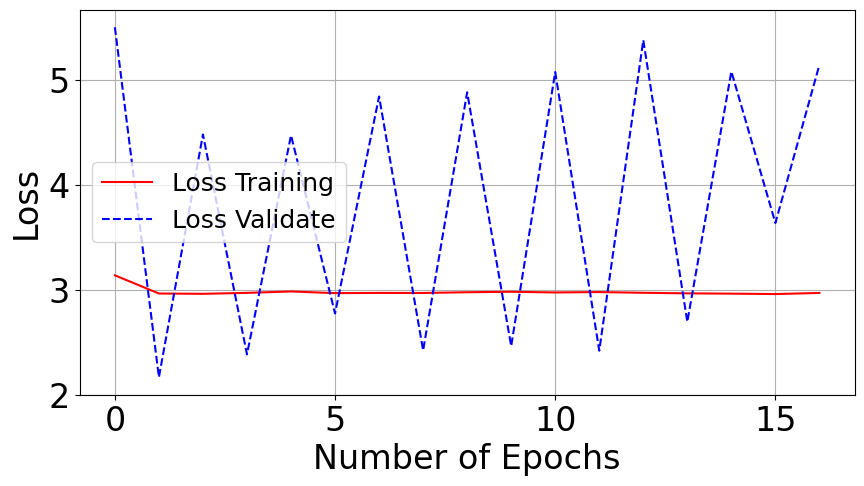

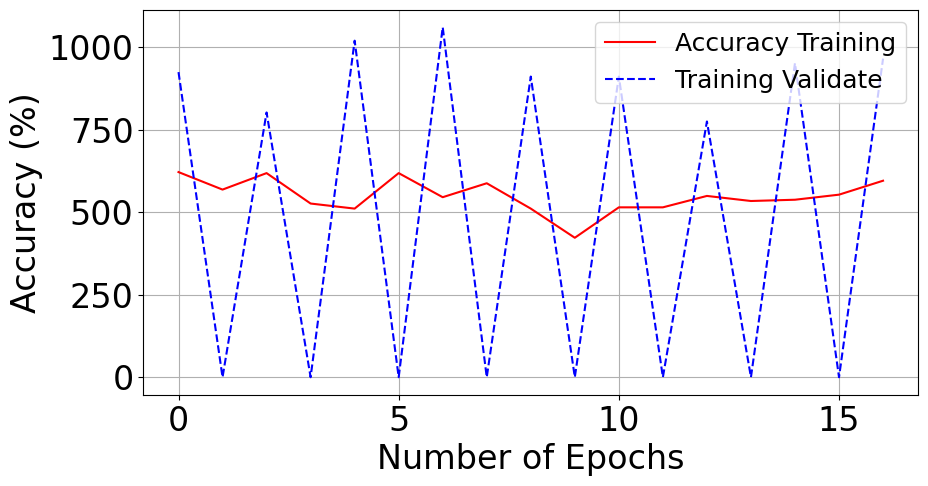

In [28]:
plotTraining(model_history,epochs,"loss")
plotTraining(model_history,epochs,"accuracy")
plotTraining(model_history,epochs,"val_loss")
plotTraining(model_history,epochs,"val_accuracy")

In [31]:
from keras.applications.imagenet_utils import preprocess_input, decode_predictions
from keras.models import load_model

names = ['CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']


# Cargar el modelo
modelt = load_model(model_directory + file_name)
#modelt = custom_vgg_model

# Ruta de la imagen de prueba
imaget_path = "ImagenPrueba2.jpg"

# Leer la imagen, cambiar tamaño y preprocesar
imaget=cv2.resize(cv2.imread(imaget_path), (width_shape, height_shape), interpolation = cv2.INTER_AREA)
xt = np.asarray(imaget)
xt=preprocess_input(xt)
xt = np.expand_dims(xt,axis=0)

# Obtener las predicciones del modelo
preds = modelt.predict(xt)

# Obtener la clase predicha y su porcentaje de confianza
predicted_class_index = np.argmax(preds)
predicted_class_name = names[predicted_class_index]
confidence_percentage = preds[0][predicted_class_index] * 100

# Imprimir el resultado
print(f'Clase predicha: {predicted_class_name}')
print(f'Porcentaje de confianza: {confidence_percentage:.2f}%')

# Mostrar la imagen
plt.imshow(cv2.cvtColor(np.asarray(imaget), cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'cv::resize'


In [30]:
from sklearn.metrics import confusion_matrix, f1_score, roc_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


names = ['CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']



test_data_dir = 'datasetpreprocesado/test'  

test_datagen = ImageDataGenerator()

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape), 
    batch_size = batch_size,
    class_mode='categorical', 
    shuffle=False)

custom_Model= load_model('models/model_VGG16_v.keras')

predictions = custom_Model.predict(test_generator)


y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes


matc=confusion_matrix(y_real, y_pred)



print(metrics.classification_report(y_real,y_pred, digits = 4))





Found 320 images belonging to 18 classes.


C:\Users\DIAZOVIEDO\anaconda3\envs\TFMaves\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 231s 23s/step


ValueError: Classification metrics can't handle a mix of multiclass and unknown targets

In [29]:
from sklearn.metrics import confusion_matrix, f1_score, roc_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


names = ['CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']



test_data_dir = 'datasetpreprocesado/test'  

test_datagen = ImageDataGenerator()

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape), 
    batch_size = batch_size,
    class_mode='categorical', 
    shuffle=False)

custom_Model50= load_model('models/model_VGG16_v.keras')

predictions = custom_Model50.predict(test_generator)


y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes


matc=confusion_matrix(y_real, y_pred)

plot_confusion_matrix(conf_mat=matc, figsize=(9,9), class_names = names, show_normed=False)
plt.tight_layout()

print(metrics.classification_report(y_real,y_pred, digits = 4))

Found 320 images belonging to 18 classes.


C:\Users\DIAZOVIEDO\anaconda3\envs\TFMaves\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 229s 23s/step


ValueError: Classification metrics can't handle a mix of multiclass and unknown targets

In [22]:
import os
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report
from mlxtend.plotting import plot_confusion_matrix

# Suponiendo que custom_vgg_model es un modelo de Keras
# Aquí se crea un modelo VGG16 de ejemplo
base_model = VGG16(weights='imagenet', include_top=False)
custom_vgg_model = Model(inputs=base_model.input, outputs=base_model.output)

# Nombre base del modelo
model_name = "model_VGG16_v"
file_extension = ".keras"
model_directory = "models/"

# Crear el directorio si no existe
if not os.path.exists(model_directory):
    os.makedirs(model_directory)

# Inicializar contador
counter = 1
file_name = model_name + file_extension

# Verificar si el modelo ya está guardado
while os.path.exists(model_directory + file_name):
    file_name = f"{model_name}{counter}{file_extension}"
    counter += 1

# Guardar el modelo con el nombre único en el directorio correcto
custom_vgg_model.save(model_directory + file_name)
print(f"Modelo guardado en: {model_directory + file_name}")

# Función para plotear métricas de entrenamiento
def plotTraining(hist, epochs, typeData):
    plt.figure(figsize=(10, 5))
    xc = range(epochs)

    if typeData == "loss":
        plt.plot(xc, hist.history['loss'], '-r', label='Loss Training')
        plt.plot(xc, hist.history['val_loss'], '--b', label='Loss Validate')
        plt.ylabel('Loss', fontsize=24)

    elif typeData == "accuracy":
        plt.plot(xc, np.array(hist.history['accuracy']) * 100, '-r', label='Accuracy Training')
        plt.plot(xc, np.array(hist.history['val_accuracy']) * 100, '--b', label='Accuracy Validate')
        plt.ylabel('Accuracy (%)', fontsize=24)

    plt.xlabel('Number of Epochs', fontsize=24)
    plt.legend()
    plt.grid(True)
    plt.xticks(fontsize=24)
    plt.yticks(fontsize=24)
    plt.legend(fontsize=18)

# Ejemplo de uso de la función plotTraining
# plotTraining(model_history, epochs, "loss")
# plotTraining(model_history, epochs, "accuracy")

# Configuración de datos de prueba
names = ['CATHARTES AURA', 'COEREBA FLAVEOLA', 'COLUMBA LIVIA', 'CORAGYPS ATRATUS', 
         'CROTOPHAGA SULCIROSTRIS', 'CYANOCORAX YNCAS', 'EGRETTA THULA', 'FALCO PEREGRINUS', 
         'FALCO SPARVERIUS', 'HIRUNDO RUSTICA', 'PANDION HALIAETUS', 'PILHERODIUS PILEATUS', 
         'PITANGUS SULPHURATUS', 'PYRRHOMYIAS CINNAMOMEUS', 'RYNCHOPS NIGER', 
         'SETOPHAGA FUSCA', 'SYNALLAXIS AZARAE', 'TYRANNUS MELANCHOLICUS']

test_data_dir = 'datasetpreprocesado/test'
width_shape, height_shape = 224, 224  # Tamaño de las imágenes
batch_size = 32  # Tamaño del lote

test_datagen = ImageDataGenerator()
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(width_shape, height_shape),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Cargar modelo guardado
custom_Model50 = load_model(model_directory + file_name)
predictions = custom_Model50.predict(test_generator)

# Convertir predicciones a clases
y_pred = np.argmax(predictions, axis=1)
y_real = test_generator.classes

# Confusion matrix
matc = confusion_matrix(y_real, y_pred)
plot_confusion_matrix(conf_mat=matc, figsize=(9, 9), class_names=names, show_normed=False)
plt.tight_layout()
plt.show()

# Classification report
print(classification_report(y_real, y_pred, target_names=names, digits=4))


Modelo guardado en: models/model_VGG16_v2.keras
Found 320 images belonging to 18 classes.


C:\Users\DIAZOVIEDO\anaconda3\envs\TFMaves\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 219s 22s/step


ValueError: Classification metrics can't handle a mix of multiclass and unknown targets

In [23]:
print("y_real:", y_real[:18])
print("y_pred:", y_pred[:18])


y_real: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
y_pred: [[[0 0 0 ... 0 0 1]
  [3 1 6 ... 2 1 0]
  [3 0 6 ... 2 1 1]
  ...
  [0 0 0 ... 0 5 0]
  [0 0 0 ... 0 0 5]
  [0 0 0 ... 0 0 0]]

 [[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [4 0 5 ... 0 4 0]
  ...
  [3 6 1 ... 3 0 4]
  [3 0 1 ... 2 0 0]
  [2 0 0 ... 0 1 0]]

 [[0 0 0 ... 0 2 2]
  [0 0 0 ... 0 0 1]
  [1 0 0 ... 0 0 0]
  ...
  [1 0 1 ... 0 0 1]
  [1 0 1 ... 0 6 1]
  [0 0 0 ... 0 1 1]]

 ...

 [[0 5 6 ... 6 2 0]
  [0 0 4 ... 0 0 0]
  [0 0 0 ... 0 3 0]
  ...
  [3 0 1 ... 1 0 0]
  [0 0 1 ... 1 0 0]
  [0 2 0 ... 1 0 0]]

 [[0 0 1 ... 1 0 0]
  [0 0 1 ... 1 1 0]
  [0 0 1 ... 0 1 0]
  ...
  [0 0 0 ... 0 3 0]
  [0 0 6 ... 0 3 2]
  [0 0 6 ... 0 5 4]]

 [[0 0 0 ... 0 3 0]
  [3 1 0 ... 1 4 0]
  [2 1 2 ... 1 5 1]
  ...
  [0 0 3 ... 0 5 0]
  [0 5 0 ... 0 0 0]
  [0 5 0 ... 6 1 0]]]


In [24]:
import numpy as np
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
import matplotlib.pyplot as plt

# Verificar las primeras entradas de y_real y y_pred
print("y_real:", y_real[:10])
print("y_pred (shape):", y_pred.shape)

# Asegurarse de que y_pred tenga el formato correcto
# Asumimos que y_pred es un array tridimensional de probabilidades
y_pred_labels = np.argmax(y_pred, axis=-1).flatten()

print("y_pred_labels:", y_pred_labels[:10])

# Asegurarse de que y_real sea un array
y_real = np.array(y_real)

# Matriz de confusión
matc = confusion_matrix(y_real, y_pred_labels)
plot_confusion_matrix(conf_mat=matc, figsize=(9, 9), class_names=names, show_normed=False)
plt.tight_layout()
plt.show()


y_real: [0 0 0 0 0 0 0 0 0 0]
y_pred (shape): (320, 7, 512)
y_pred_labels: [28  2  2  2 28 36 21 12 12  3]


ValueError: Found input variables with inconsistent numbers of samples: [320, 2240]